# Egg Quality Classification Based on its Shell Visual Property through Image Processing and Deep Learning


Group CGM: <br>

Caguioa, JV Bryan <br>
Guinto, Ryhle Nodnyhlson <br>
Mesias, Lee Reuben

# References

https://thedatafrog.com/en/articles/image-recognition-transfer-learning/ <br>
https://medium.com/the-owl/k-fold-cross-validation-in-keras-3ec4a3a00538 <br>
https://www.datacamp.com/community/tutorials/convolutional-neural-networks-python

## Imports

In [1]:
# for image name
import random

# define and move to dataset and model directory
import os
# the directory where the data is stored
directory = "C:/Users/user/Desktop/Dataset"
#directory where set of models per training are stored
gen_dir = "C:/Users/user/Desktop/Model"

# duplicate combined image to other directory and delete directory with its content
import shutil

#for stopping code if not the right amount of images
import sys

#histograph/confusion matrix
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sn

#model creation
import tensorflow.keras as keras

import numpy as np

# data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#k-fold cross validation
import pandas as pd                                     #store all images and their class/label
from sklearn.model_selection import StratifiedKFold     
from sklearn.model_selection import train_test_split    #split the dataset to train-test
import tensorflow as tf                                 #for callbacks

#for model evaluation
from tensorflow.keras.preprocessing import image as im                   #load image
from tensorflow.keras.applications.resnet50 import preprocess_input      #preprocess image                                                               
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc       
from sklearn.metrics import roc_auc_score
from scipy import interp                            #interpolation needed for plotting all classes into one roc plot
from itertools import cycle                         #for the color of lines on that multiclass plot

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

#validating misclassified images
import cv2     #load the image

## Put Dataset in a Dataframe

The directory of the images are put in a dataframe in order to prepare for splitting the dataset into train and test set.

In [2]:
totaldsdirect = directory + "/CombinedTwoAngleEggs"

image = []

if not os.path.exists(totaldsdirect):
    print("Directory does not exist. Please run the code on data cleaning notebook.")
    sys.exit()

for x in os.listdir(totaldsdirect):
    totaldsdirect2 = totaldsdirect + "/" + x
    for y in os.listdir(totaldsdirect2):
        if x == "Balut-penoy2":
            lbl = "0"
        elif x == "Salted egg2":
            lbl = "1"
        else:
            lbl = "2"
                 
        #append to image array
        image.append([totaldsdirect2 + "/" + y,lbl])

In [3]:
df = pd.DataFrame(image,columns=['filename','label'])
df

,filename,label
0,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,0
1,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,0
2,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,0
3,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,0
4,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,0
...,...,...
295,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,2
296,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,2
297,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,2
298,C:/Users/user/Desktop/Dataset/CombinedTwoAngle...,2


Classes: <br>
0 - Balut/Penoy <br> 
1 - Salted <br>
2 - Table

In [4]:
print(df['label'].unique())

['0' '1' '2']


Check if there are null values

In [5]:
print(df.isna().any())

filename    False
label       False
dtype: bool


## Split Data to train and test set

We will need to split the dataset to train and test set. Only the train set will be used for transfer learning with K-fold validation. Test set will be used for model prediction and use that for model evaluation. Stratify is used in order to split the data in equal numbers under the classes specified.

In [6]:
# Split the data to train and test
X = df[['filename']]
y = df[['label']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=69)

Save the split sets to train and test set folders.

In [7]:
#folder to store the train and test set folders
fortraintest = directory + "/ToBeUsed"
if not os.path.exists(fortraintest):
    os.makedirs(fortraintest)

#train set folder
tr = fortraintest + "/train_set"
if not os.path.exists(tr):
    os.makedirs(tr)
else:
    #remove previous folder and create new one
    shutil.rmtree(tr)
    os.makedirs(tr)
    
#test set folder
te = fortraintest + "/test_set"
if not os.path.exists(te):
    os.makedirs(te)
else:
    #remove previous folder and create new one
    shutil.rmtree(te)
    os.makedirs(te)

#copying the images to the train set folder
for index, row in X_train.iterrows():
    trcpy = shutil.copy2(row['filename'], tr)
    X_train.loc[X_train['filename']==row['filename'],'filename']=trcpy #change to directory where image is copied
    
#copying the images to the test set folder
for index, row in X_test.iterrows():
    tecpy = shutil.copy2(row['filename'], te)
    X_test.loc[X_test['filename']==row['filename'],'filename']=tecpy #change to directory where image is copiedb

C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


In [8]:
df2 = pd.concat([X_train,y_train],axis=1)
df2

,filename,label
117,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,1
197,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,1
200,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,2
232,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,2
95,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,0
...,...,...
158,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,1
297,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,2
28,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,0
240,C:/Users/user/Desktop/Dataset/ToBeUsed/train_s...,2


## Data Augmentation

We will apply data augmentation of the dataset per epoch in order to increase the accuracy of the models

In [9]:
resnet50 = keras.applications.resnet50

imgdatagen = ImageDataGenerator(
        preprocessing_function = resnet50.preprocess_input,
        horizontal_flip = True,
        vertical_flip = True,
        width_shift_range = 2,
        height_shift_range = 2,
    )

## Create Plot History

Plot history will display the training and validation accuracy, and training and validation loss in every epoch in a fold.

In [10]:
def plot_history(history, yrange):
    #Plot loss and accuracy as a function of the epoch,
    #for the training and validation datasets.
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Get number of epochs
    epochs = range(len(acc))

    # Plot training and validation accuracy per epoch
    plt.plot(epochs, acc)
    plt.plot(epochs, val_acc)
    plt.title('Training and validation accuracy')
    plt.legend(['train_accuracy','val_accuracy'])
    plt.ylim(yrange)
    
    # Plot training and validation loss per epoch
    plt.figure()

    plt.plot(epochs, loss)
    plt.plot(epochs, val_loss)
    plt.title('Training and validation loss')
    plt.legend(['train_loss','val_loss'])
    
    plt.show() 

## Save Models

K-fold cross validation will be used in training the model.The set of models produced per fold will be saved in an automatic generated folder. Every training will generated another folder to save the new set of models.

In [11]:
def savemodel():
    save_cur = ""  #check if there is any saved_models folders

    svnum = 0
    svnum2 = 0

    for x in os.listdir(gen_dir):
        if "saved_models" in x:
            save_cur = x
            if not save_cur == "":
                for word in save_cur.split("_"):
                    if word.isdigit():
                        svnum2 = int(word)
                        if svnum < svnum2:
                            svnum = svnum2


    #save_dir is where the created models using the current set of parameters are added        
    if save_cur == "":
        save_dir = gen_dir + "/saved_models_1"
        os.makedirs(save_dir)
    else:
        save_dir = gen_dir + "/saved_models_" + str(svnum + 1)
        os.makedirs(save_dir)
        
    return save_dir

## Model Creation

The model will be based on ResNet50 Architecture. The classifier block will be changed to suit to our dataset.

In [12]:
def model():
    conv_model = resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

    for layer in conv_model.layers:
        layer.trainable = False

    """
    #print(conv_model.output_shape)
    x = keras.layers.GlobalAveragePooling2D()(conv_model.output)
    x = keras.layers.Dense(512, activation='relu')(x)
    x = keras.layers.Dense(256, activation='relu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Dropout(0.5)(x) #to further reduce overfitting
    """
    x = keras.layers.Flatten()(conv_model.output)
    #x = keras.layers.Dense(256, activation='relu')(x)
    #x = keras.layers.Dense(256, activation='relu')(x)
    x = keras.layers.Dense(100, activation='relu')(x)
    x = keras.layers.Dense(100, activation='relu')(x)
    #x = keras.layers.BatchNormalization()(x)

    x = keras.layers.Dropout(0.2)(x) #to further reduce overfitting

    predictions = keras.layers.Dense(3, activation='softmax')(x)
    full_model = keras.models.Model(inputs=conv_model.input, outputs=predictions)

    return full_model

In [13]:
full_model = model()
full_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [14]:
stopper

NameError: name 'stopper' is not defined

## Hyper-Parameter Tuning

We will check the parameters that yielded the best results. A set of values on chosen parameters is given. The one that will yield the best results will be used for prediction.

### Model Parameters

In [15]:
#kfold parameters
Y = df2[['label']]
skf = StratifiedKFold(n_splits = 5, random_state = 69, shuffle = True)

#initialize parameters
VALIDATION_ACCURACY = []                          #holds all validation_accuracy
VALIDATION_LOSS = []                              #holds all validation_loss
image_dir = directory + "/ToBeUsed/train_set"     #where the train set images are stored
batch_size_arr = [4,8,16,32]                      #batch size
fold_var = 1                                      #number of fold of the model
n = len(df2)                                      #number of data in train set
num_epochs_arr = [20,50,100]                      #number of epochs
dim = (224,224)                                   #required dimensions for process_unit (ResNet50)
lr_arr = [0.00001,0.0001]                         #learning rate Adamax

param_arr = []                                    #holds the parameter values per combination
val_acc_arr = []                                  #holds the set of validation accuracy per combination
val_loss_arr = []                                 #holds the set of validation loss per combination
val_acc_means = []                                #holds the means of all set of validation loss per combination
val_loss_means = []                               #holds the means of all set of validation loss per combination

Train the model per combination of parameters.

Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
54/54 [==============================] - 14s 110ms/step - loss: 1.2306 - accuracy: 0.4074 - val_loss: 0.9981 - val_accuracy: 0.4815

Epoch 00001: val_accuracy improved from -inf to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
54/54 [==============================] - 4s 77ms/step - loss: 0.8979 - accuracy: 0.5972 - val_loss: 0.9101 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.48148 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_1.h5
Epoch 3/20
54/54 [==============================] - 4s 79ms/step - loss: 0.8195 - accuracy: 0.6250 - val_loss: 0.8401 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.61111 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_1.h5
Epoch 4/20
54/54 [==============================] - 4s 82ms/step - loss: 0.7508 - accuracy: 0.6713 - val_loss: 0.7012 - val_accuracy: 0.6667

Epoch 00004: val_accuracy improved from 0.64815 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_1.h5
Epoch 5/20
54/54 [==============================] - 4s 82ms/step - loss: 0.7066 - accuracy: 0.7083 - val_loss: 0.6587 - val_accuracy: 0.7222

Epoch 00005: val_accuracy improved from 0.

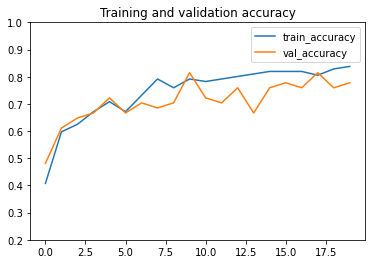

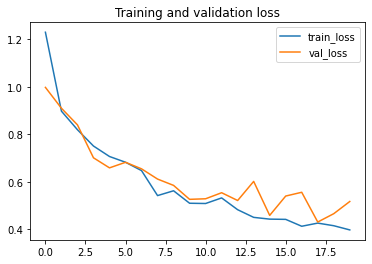

14/14 [==============================] - 1s 57ms/step - loss: 0.5558 - accuracy: 0.7037
{'loss': 0.5557782053947449, 'accuracy': 0.7037037014961243}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
54/54 [==============================] - 9s 101ms/step - loss: 1.2139 - accuracy: 0.4630 - val_loss: 0.8297 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_2.h5
Epoch 2/20
54/54 [==============================] - 4s 81ms/step - loss: 0.9337 - accuracy: 0.5417 - val_loss: 0.9319 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.62963
Epoch 3/20
54/54 [==============================] - 4s 82ms/step - loss: 0.8476 - accuracy: 0.5741 - val_loss: 0.8171 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did not improve from 0.62963
Epoch 4/20
54/54 [==============================] - 4s

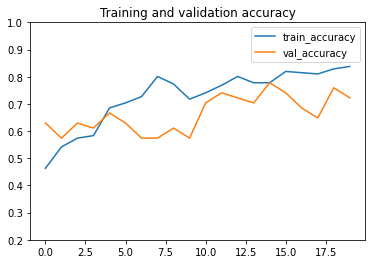

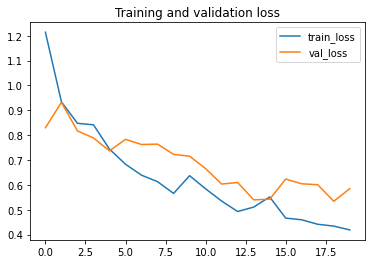

14/14 [==============================] - 1s 58ms/step - loss: 0.6195 - accuracy: 0.7037
{'loss': 0.6194644570350647, 'accuracy': 0.7037037014961243}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
54/54 [==============================] - 9s 100ms/step - loss: 1.1983 - accuracy: 0.3796 - val_loss: 0.9346 - val_accuracy: 0.5926

Epoch 00001: val_accuracy improved from -inf to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_3.h5
Epoch 2/20
54/54 [==============================] - 4s 83ms/step - loss: 0.9511 - accuracy: 0.5602 - val_loss: 0.7550 - val_accuracy: 0.6852

Epoch 00002: val_accuracy improved from 0.59259 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_3.h5
Epoch 3/20
54/54 [==============================] - 4s 80ms/step - loss: 0.9234 - accuracy: 0.5972 - val_loss: 0.6979 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did not 

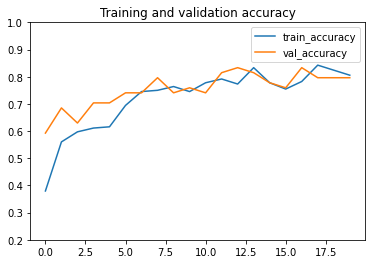

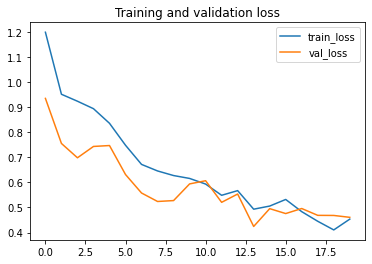

14/14 [==============================] - 1s 59ms/step - loss: 0.5640 - accuracy: 0.7593
{'loss': 0.5640292167663574, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
54/54 [==============================] - 8s 95ms/step - loss: 1.1802 - accuracy: 0.3935 - val_loss: 0.8733 - val_accuracy: 0.6481

Epoch 00001: val_accuracy improved from -inf to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_4.h5
Epoch 2/20
54/54 [==============================] - 4s 81ms/step - loss: 0.9645 - accuracy: 0.5278 - val_loss: 0.8171 - val_accuracy: 0.5926

Epoch 00002: val_accuracy did not improve from 0.64815
Epoch 3/20
54/54 [==============================] - 4s 82ms/step - loss: 0.9598 - accuracy: 0.5741 - val_loss: 0.7423 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved from 0.64815 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_

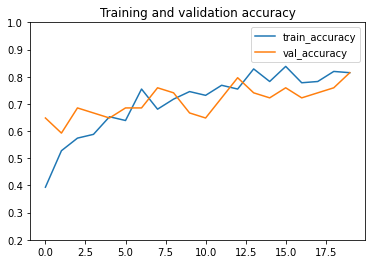

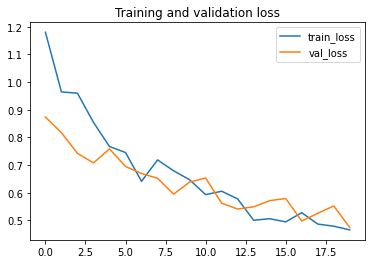

14/14 [==============================] - 1s 59ms/step - loss: 0.4629 - accuracy: 0.8333
{'loss': 0.4628511071205139, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
54/54 [==============================] - 9s 103ms/step - loss: 1.1692 - accuracy: 0.4815 - val_loss: 1.0296 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_5.h5
Epoch 2/20
54/54 [==============================] - 4s 80ms/step - loss: 0.9401 - accuracy: 0.5417 - val_loss: 0.8582 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.51852 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_1\model_5.h5
Epoch 3/20
54/54 [==============================] - 4s 79ms/step - loss: 0.7716 - accuracy: 0.6157 - val_loss: 0.7824 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved

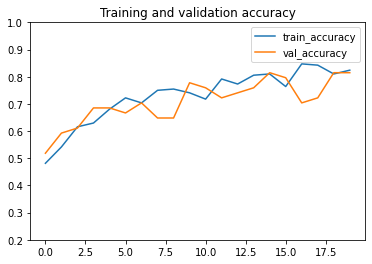

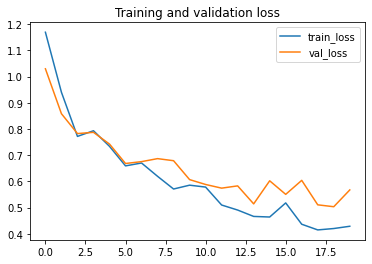

14/14 [==============================] - 1s 59ms/step - loss: 0.5367 - accuracy: 0.7222
{'loss': 0.5366659760475159, 'accuracy': 0.7222222089767456}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
54/54 [==============================] - 8s 103ms/step - loss: 1.7190 - accuracy: 0.4722 - val_loss: 0.8442 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
54/54 [==============================] - 4s 82ms/step - loss: 0.8374 - accuracy: 0.6204 - val_loss: 0.6775 - val_accuracy: 0.7222

Epoch 00002: val_accuracy improved from 0.62963 to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_1.h5
Epoch 3/20
54/54 [==============================] - 4s 80ms/step - loss: 0.6964 - accuracy: 0.6944 - val_loss: 0.7026 - val_accuracy: 0.5926

Epoch 00003: val_accuracy did not improve from 0.72222
Epoch 4/20
54/54 [==============================] - 4s 82ms/step - loss: 0.6186 - accuracy: 0.7500 - val_loss: 0.5686 - val_accuracy: 0.8148

Epoch 00004: val_accuracy improved from 0.72222 to 0.81481, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_1.h5
Epoch 5/20
54/54 [==============================] - 4s 81ms/step - loss: 0.4824 - accuracy: 0.7639 - val_loss: 0.5188 - val_accuracy: 0.7407

Epoch 00005: val_accuracy did not improve from 0.81481
Epoch 6/20
54/54 [==============================] - 4s 82ms/st

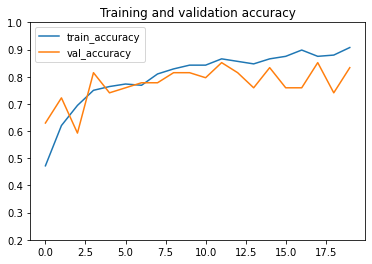

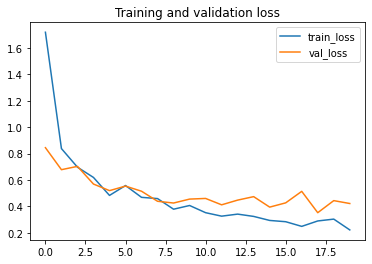

14/14 [==============================] - 1s 58ms/step - loss: 0.4363 - accuracy: 0.7963
{'loss': 0.43634551763534546, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
54/54 [==============================] - 9s 107ms/step - loss: 1.4075 - accuracy: 0.4907 - val_loss: 0.7953 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_2.h5
Epoch 2/20
54/54 [==============================] - 4s 81ms/step - loss: 0.8385 - accuracy: 0.6296 - val_loss: 0.7284 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.55556 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_2.h5
Epoch 3/20
54/54 [==============================] - 4s 81ms/step - loss: 0.7202 - accuracy: 0.6852 - val_loss: 0.6401 - val_accuracy: 0.7037

Epoch 00003: val_accuracy improve

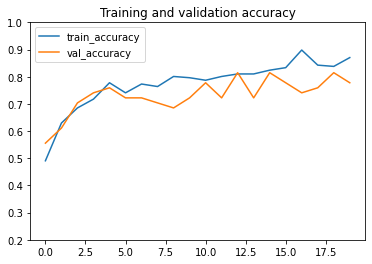

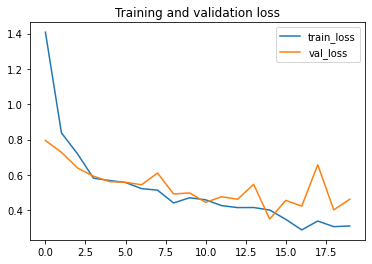

14/14 [==============================] - 1s 58ms/step - loss: 0.4979 - accuracy: 0.7963
{'loss': 0.4979289770126343, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
54/54 [==============================] - 8s 103ms/step - loss: 1.4582 - accuracy: 0.4676 - val_loss: 0.5780 - val_accuracy: 0.7778

Epoch 00001: val_accuracy improved from -inf to 0.77778, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_3.h5
Epoch 2/20
54/54 [==============================] - 4s 81ms/step - loss: 0.9915 - accuracy: 0.5556 - val_loss: 0.5613 - val_accuracy: 0.7222

Epoch 00002: val_accuracy did not improve from 0.77778
Epoch 3/20
54/54 [==============================] - 4s 81ms/step - loss: 0.6868 - accuracy: 0.6852 - val_loss: 0.5140 - val_accuracy: 0.7407

Epoch 00003: val_accuracy did not improve from 0.77778
Epoch 4/20
54/54 [==============================] - 4s

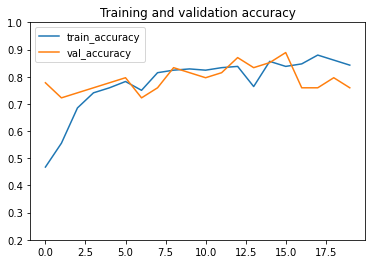

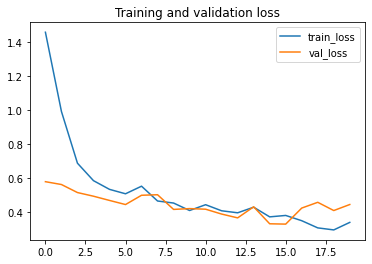

14/14 [==============================] - 1s 59ms/step - loss: 0.3444 - accuracy: 0.8148
{'loss': 0.34444043040275574, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
54/54 [==============================] - 8s 104ms/step - loss: 1.3349 - accuracy: 0.4676 - val_loss: 0.6891 - val_accuracy: 0.5926

Epoch 00001: val_accuracy improved from -inf to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_4.h5
Epoch 2/20
54/54 [==============================] - 4s 82ms/step - loss: 0.7940 - accuracy: 0.6389 - val_loss: 0.6233 - val_accuracy: 0.5926

Epoch 00002: val_accuracy did not improve from 0.59259
Epoch 3/20
54/54 [==============================] - 4s 82ms/step - loss: 0.6907 - accuracy: 0.7083 - val_loss: 0.7307 - val_accuracy: 0.7037

Epoch 00003: val_accuracy improved from 0.59259 to 0.70370, saving model to C:/Users/user/Desktop/Model/save

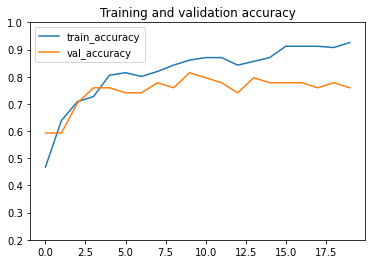

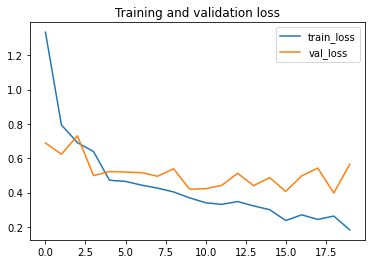

14/14 [==============================] - 1s 58ms/step - loss: 0.5034 - accuracy: 0.7963
{'loss': 0.5034134387969971, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
54/54 [==============================] - 8s 103ms/step - loss: 1.5690 - accuracy: 0.4583 - val_loss: 0.8123 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_5.h5
Epoch 2/20
54/54 [==============================] - 4s 82ms/step - loss: 0.9821 - accuracy: 0.5833 - val_loss: 0.6746 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.62963 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_2\model_5.h5
Epoch 3/20
54/54 [==============================] - 4s 82ms/step - loss: 0.6805 - accuracy: 0.6574 - val_loss: 0.6947 - val_accuracy: 0.6667

Epoch 00003: val_accuracy did not 

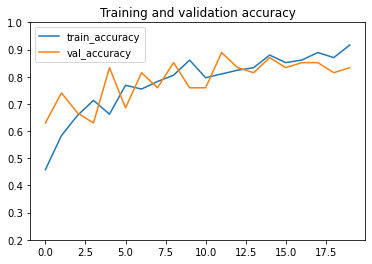

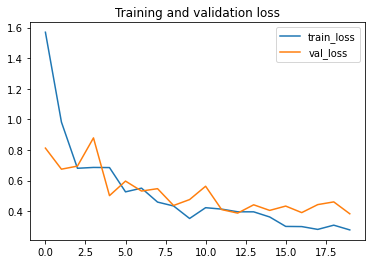

14/14 [==============================] - 1s 58ms/step - loss: 0.4204 - accuracy: 0.8148
{'loss': 0.4203512370586395, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
54/54 [==============================] - 9s 103ms/step - loss: 1.2256 - accuracy: 0.4259 - val_loss: 0.9775 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
54/54 [==============================] - 4s 82ms/step - loss: 0.8746 - accuracy: 0.6019 - val_loss: 0.9527 - val_accuracy: 0.4630

Epoch 00002: val_accuracy did not improve from 0.50000
Epoch 3/50
54/54 [==============================] - 4s 82ms/step - loss: 0.9219 - accuracy: 0.5833 - val_loss: 0.9453 - val_accuracy: 0.5000

Epoch 00003: val_accuracy did not improve from 0.50000
Epoch 4/50
54/54 [==============================] - 4s 82ms/step - loss: 0.7931 - accuracy: 0.5880 - val_loss: 0.8255 - val_accuracy: 0.6852

Epoch 00004: val_accuracy improved from 0.50000 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_1.h5
Epoch 5/50
54/54 [==============================] - 4s 81ms/step - loss: 0.7549 - accuracy: 0.6991 - val_loss: 0.7515 - val_accuracy: 0.6667

Epoch 00005: val_accuracy did not improve from 0.68519
Epoch 6/50
54/54 [==============================] - 4s 82ms/step - loss: 0.7088 - accuracy: 0.6898 - val_loss: 0.6930 - val_accuracy: 0.6

54/54 [==============================] - 4s 82ms/step - loss: 0.2380 - accuracy: 0.9213 - val_loss: 0.3596 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.85185
Epoch 43/50
54/54 [==============================] - 4s 82ms/step - loss: 0.2648 - accuracy: 0.8843 - val_loss: 0.5278 - val_accuracy: 0.7593

Epoch 00043: val_accuracy did not improve from 0.85185
Epoch 44/50
54/54 [==============================] - 4s 82ms/step - loss: 0.2308 - accuracy: 0.9120 - val_loss: 0.4339 - val_accuracy: 0.7963

Epoch 00044: val_accuracy did not improve from 0.85185
Epoch 45/50
54/54 [==============================] - 4s 82ms/step - loss: 0.2347 - accuracy: 0.9120 - val_loss: 0.4172 - val_accuracy: 0.8333

Epoch 00045: val_accuracy did not improve from 0.85185
Epoch 46/50
54/54 [==============================] - 4s 82ms/step - loss: 0.2089 - accuracy: 0.9444 - val_loss: 0.4766 - val_accuracy: 0.8148

Epoch 00046: val_accuracy did not improve from 0.85185
Epoch 47/50
54/54 [===

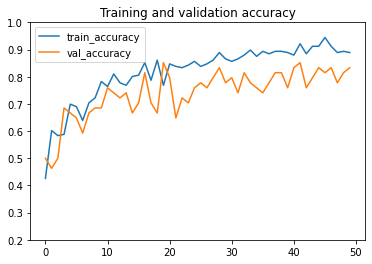

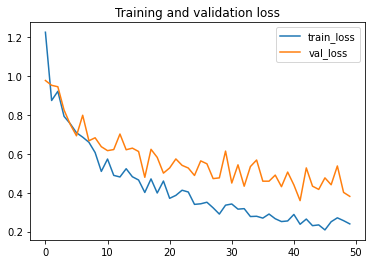

14/14 [==============================] - 1s 58ms/step - loss: 0.4851 - accuracy: 0.7963
{'loss': 0.48510435223579407, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
54/54 [==============================] - 8s 103ms/step - loss: 1.1659 - accuracy: 0.4259 - val_loss: 0.8600 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_2.h5
Epoch 2/50
54/54 [==============================] - 4s 79ms/step - loss: 0.8392 - accuracy: 0.5833 - val_loss: 0.8459 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.57407
Epoch 3/50
54/54 [==============================] - 4s 82ms/step - loss: 0.7450 - accuracy: 0.6759 - val_loss: 0.8565 - val_accuracy: 0.5556

Epoch 00003: val_accuracy did not improve from 0.57407
Epoch 4/50
54/54 [==============================] - 4

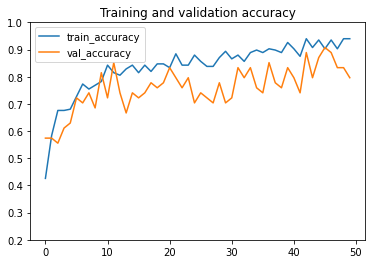

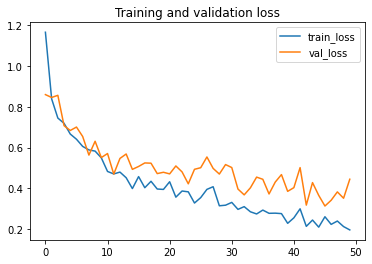

14/14 [==============================] - 1s 59ms/step - loss: 0.3628 - accuracy: 0.8333
{'loss': 0.36278393864631653, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
54/54 [==============================] - 8s 103ms/step - loss: 1.0039 - accuracy: 0.4954 - val_loss: 0.8057 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_3.h5
Epoch 2/50
54/54 [==============================] - 4s 82ms/step - loss: 0.8522 - accuracy: 0.5787 - val_loss: 0.6899 - val_accuracy: 0.7778

Epoch 00002: val_accuracy improved from 0.68519 to 0.77778, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_3.h5
Epoch 3/50
54/54 [==============================] - 4s 81ms/step - loss: 0.7611 - accuracy: 0.6574 - val_loss: 0.6015 - val_accuracy: 0.7407

Epoch 00003: val_accuracy did not

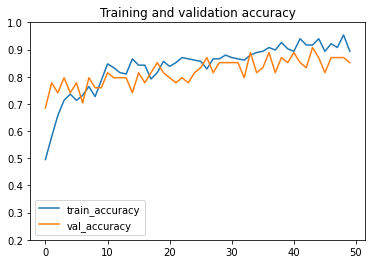

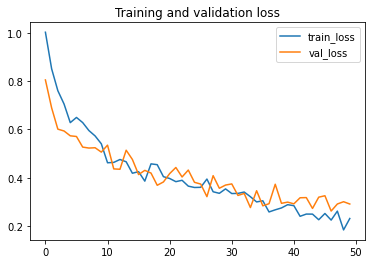

14/14 [==============================] - 1s 55ms/step - loss: 0.3430 - accuracy: 0.8148
{'loss': 0.343039870262146, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
54/54 [==============================] - 9s 101ms/step - loss: 1.1756 - accuracy: 0.4213 - val_loss: 0.8655 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_4.h5
Epoch 2/50
54/54 [==============================] - 4s 80ms/step - loss: 0.8528 - accuracy: 0.6435 - val_loss: 0.7107 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.62963 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_4.h5
Epoch 3/50
54/54 [==============================] - 4s 80ms/step - loss: 0.8329 - accuracy: 0.6019 - val_loss: 0.6596 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved 


Epoch 00037: val_accuracy did not improve from 0.81481
Epoch 38/50
54/54 [==============================] - 4s 80ms/step - loss: 0.1998 - accuracy: 0.9491 - val_loss: 0.4768 - val_accuracy: 0.7778

Epoch 00038: val_accuracy did not improve from 0.81481
Epoch 39/50
54/54 [==============================] - 4s 81ms/step - loss: 0.2497 - accuracy: 0.9213 - val_loss: 0.4620 - val_accuracy: 0.7778

Epoch 00039: val_accuracy did not improve from 0.81481
Epoch 40/50
54/54 [==============================] - 4s 81ms/step - loss: 0.2803 - accuracy: 0.8889 - val_loss: 0.4500 - val_accuracy: 0.7963

Epoch 00040: val_accuracy did not improve from 0.81481
Epoch 41/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1734 - accuracy: 0.9444 - val_loss: 0.3541 - val_accuracy: 0.8889

Epoch 00041: val_accuracy improved from 0.81481 to 0.88889, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_4.h5
Epoch 42/50
54/54 [==============================] - 4s 81ms/step - loss: 0.2

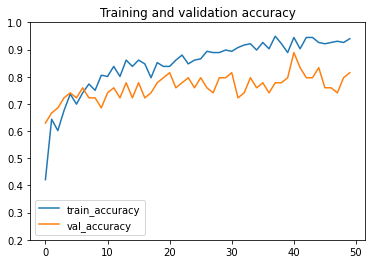

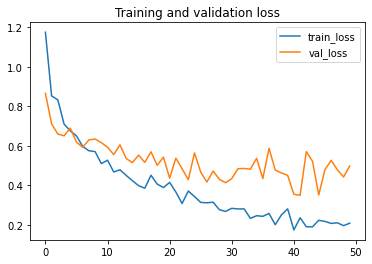

14/14 [==============================] - 1s 56ms/step - loss: 0.5222 - accuracy: 0.7222
{'loss': 0.5221648216247559, 'accuracy': 0.7222222089767456}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
54/54 [==============================] - 9s 102ms/step - loss: 1.1399 - accuracy: 0.4769 - val_loss: 0.9512 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_5.h5
Epoch 2/50
54/54 [==============================] - 4s 81ms/step - loss: 0.9195 - accuracy: 0.5509 - val_loss: 0.8059 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.53704 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_3\model_5.h5
Epoch 3/50
54/54 [==============================] - 4s 81ms/step - loss: 0.7908 - accuracy: 0.6111 - val_loss: 0.7734 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved

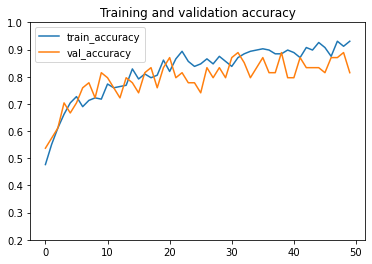

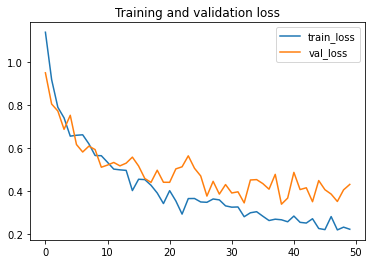

14/14 [==============================] - 1s 57ms/step - loss: 0.4054 - accuracy: 0.8519
{'loss': 0.4053882956504822, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
54/54 [==============================] - 9s 102ms/step - loss: 1.4932 - accuracy: 0.4306 - val_loss: 0.8368 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
54/54 [==============================] - 4s 81ms/step - loss: 0.7658 - accuracy: 0.6343 - val_loss: 0.7948 - val_accuracy: 0.6481

Epoch 00002: val_accuracy improved from 0.61111 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_1.h5
Epoch 3/50
54/54 [==============================] - 4s 80ms/step - loss: 0.7748 - accuracy: 0.6250 - val_loss: 0.8496 - val_accuracy: 0.5556

Epoch 00003: val_accuracy did not improve from 0.64815
Epoch 4/50
54/54 [==============================] - 4s 81ms/step - loss: 0.5795 - accuracy: 0.7407 - val_loss: 0.6320 - val_accuracy: 0.7407

Epoch 00004: val_accuracy improved from 0.64815 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_1.h5
Epoch 5/50
54/54 [==============================] - 4s 81ms/step - loss: 0.6173 - accuracy: 0.7546 - val_loss: 0.5471 - val_accuracy: 0.7037

Epoch 00005: val_accuracy did not improve from 0.74074
Epoch 6/50
54/54 [==============================] - 4s 81ms/st

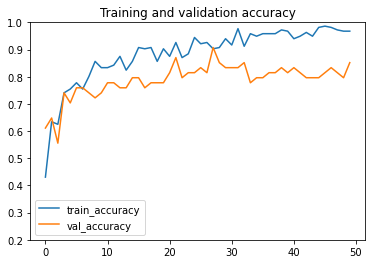

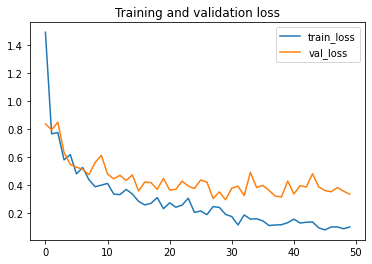

14/14 [==============================] - 1s 57ms/step - loss: 0.3925 - accuracy: 0.7963
{'loss': 0.3924565613269806, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
54/54 [==============================] - 8s 102ms/step - loss: 1.4432 - accuracy: 0.4722 - val_loss: 0.8670 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_2.h5
Epoch 2/50
54/54 [==============================] - 4s 80ms/step - loss: 0.8862 - accuracy: 0.6296 - val_loss: 0.7696 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.53704 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_2.h5
Epoch 3/50
54/54 [==============================] - 4s 80ms/step - loss: 0.7626 - accuracy: 0.6481 - val_loss: 0.5996 - val_accuracy: 0.7593

Epoch 00003: val_accuracy improved

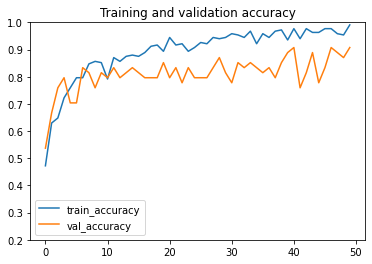

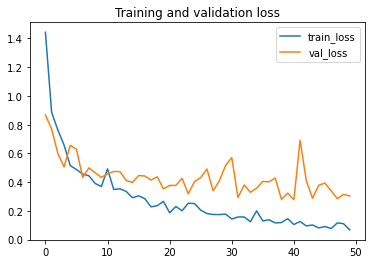

14/14 [==============================] - 1s 57ms/step - loss: 0.3669 - accuracy: 0.8148
{'loss': 0.3669380843639374, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
54/54 [==============================] - 8s 101ms/step - loss: 1.4477 - accuracy: 0.4815 - val_loss: 0.7368 - val_accuracy: 0.7222

Epoch 00001: val_accuracy improved from -inf to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_3.h5
Epoch 2/50
54/54 [==============================] - 4s 80ms/step - loss: 0.8556 - accuracy: 0.6250 - val_loss: 0.5137 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.72222 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_3.h5
Epoch 3/50
54/54 [==============================] - 4s 79ms/step - loss: 0.5911 - accuracy: 0.7593 - val_loss: 0.7037 - val_accuracy: 0.6852

Epoch 00003: val_accuracy did not 


Epoch 00037: val_accuracy did not improve from 0.92593
Epoch 38/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1437 - accuracy: 0.9630 - val_loss: 0.2723 - val_accuracy: 0.8519

Epoch 00038: val_accuracy did not improve from 0.92593
Epoch 39/50
54/54 [==============================] - 4s 80ms/step - loss: 0.1318 - accuracy: 0.9630 - val_loss: 0.1883 - val_accuracy: 0.9074

Epoch 00039: val_accuracy did not improve from 0.92593
Epoch 40/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1149 - accuracy: 0.9722 - val_loss: 0.2314 - val_accuracy: 0.9074

Epoch 00040: val_accuracy did not improve from 0.92593
Epoch 41/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1472 - accuracy: 0.9444 - val_loss: 0.2717 - val_accuracy: 0.8889

Epoch 00041: val_accuracy did not improve from 0.92593
Epoch 42/50
54/54 [==============================] - 4s 80ms/step - loss: 0.1363 - accuracy: 0.9537 - val_loss: 0.2323 - val_accuracy: 0.9074

Epoch 000

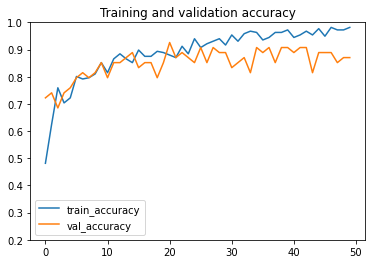

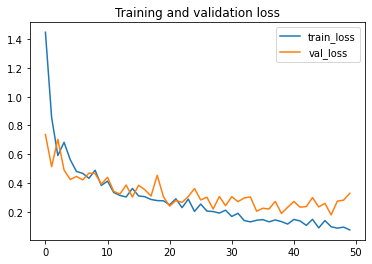

14/14 [==============================] - 1s 57ms/step - loss: 0.2881 - accuracy: 0.9074
{'loss': 0.28809377551078796, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
54/54 [==============================] - 8s 95ms/step - loss: 1.7842 - accuracy: 0.4769 - val_loss: 0.7860 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_4.h5
Epoch 2/50
54/54 [==============================] - 4s 80ms/step - loss: 0.9193 - accuracy: 0.6250 - val_loss: 0.6144 - val_accuracy: 0.7037

Epoch 00002: val_accuracy improved from 0.53704 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_4.h5
Epoch 3/50
54/54 [==============================] - 4s 81ms/step - loss: 0.7773 - accuracy: 0.6250 - val_loss: 0.6587 - val_accuracy: 0.6852

Epoch 00003: val_accuracy did not 

54/54 [==============================] - 4s 81ms/step - loss: 0.1163 - accuracy: 0.9537 - val_loss: 0.4491 - val_accuracy: 0.7593

Epoch 00039: val_accuracy did not improve from 0.85185
Epoch 40/50
54/54 [==============================] - 4s 81ms/step - loss: 0.0933 - accuracy: 0.9676 - val_loss: 0.4403 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.85185
Epoch 41/50
54/54 [==============================] - 4s 81ms/step - loss: 0.0866 - accuracy: 0.9676 - val_loss: 0.4818 - val_accuracy: 0.7963

Epoch 00041: val_accuracy did not improve from 0.85185
Epoch 42/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1083 - accuracy: 0.9676 - val_loss: 0.5417 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.85185
Epoch 43/50
54/54 [==============================] - 4s 81ms/step - loss: 0.0944 - accuracy: 0.9769 - val_loss: 0.4212 - val_accuracy: 0.8704

Epoch 00043: val_accuracy improved from 0.85185 to 0.87037, saving model to C

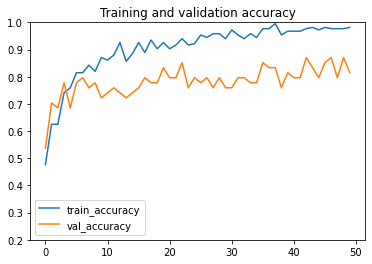

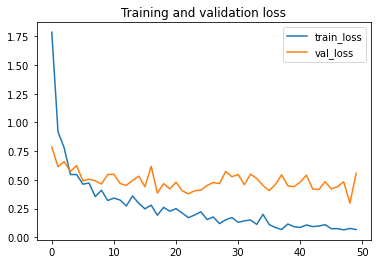

14/14 [==============================] - 1s 57ms/step - loss: 0.5324 - accuracy: 0.7593
{'loss': 0.5324386954307556, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
54/54 [==============================] - 8s 102ms/step - loss: 1.3490 - accuracy: 0.5185 - val_loss: 0.8424 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_5.h5
Epoch 2/50
54/54 [==============================] - 4s 80ms/step - loss: 0.8934 - accuracy: 0.6389 - val_loss: 0.8174 - val_accuracy: 0.6481

Epoch 00002: val_accuracy improved from 0.62963 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_4\model_5.h5
Epoch 3/50
54/54 [==============================] - 4s 81ms/step - loss: 0.7951 - accuracy: 0.6528 - val_loss: 0.5380 - val_accuracy: 0.7778

Epoch 00003: val_accuracy improved

54/54 [==============================] - 4s 80ms/step - loss: 0.1169 - accuracy: 0.9583 - val_loss: 0.4098 - val_accuracy: 0.8519

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1133 - accuracy: 0.9676 - val_loss: 0.3978 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/50
54/54 [==============================] - 4s 81ms/step - loss: 0.1067 - accuracy: 0.9676 - val_loss: 0.3952 - val_accuracy: 0.8333

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/50
54/54 [==============================] - 4s 80ms/step - loss: 0.0945 - accuracy: 0.9722 - val_loss: 0.5098 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/50
54/54 [==============================] - 4s 80ms/step - loss: 0.1198 - accuracy: 0.9630 - val_loss: 0.3142 - val_accuracy: 0.8889

Epoch 00043: val_accuracy did not improve from 0.88889
Epoch 44/50
54/54 [===

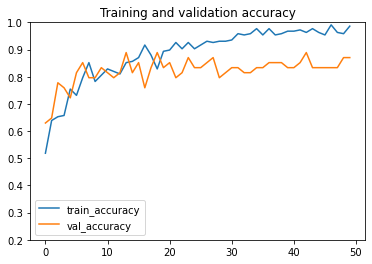

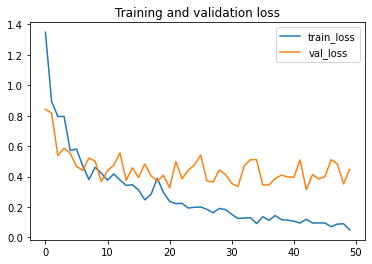

14/14 [==============================] - 1s 57ms/step - loss: 0.4363 - accuracy: 0.7593
{'loss': 0.43632999062538147, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
54/54 [==============================] - 8s 100ms/step - loss: 1.0834 - accuracy: 0.4630 - val_loss: 0.8342 - val_accuracy: 0.6667

Epoch 00001: val_accuracy improved from -inf to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
54/54 [==============================] - 4s 80ms/step - loss: 0.8887 - accuracy: 0.5602 - val_loss: 0.7204 - val_accuracy: 0.6852

Epoch 00002: val_accuracy improved from 0.66667 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_1.h5
Epoch 3/100
54/54 [==============================] - 4s 80ms/step - loss: 0.7723 - accuracy: 0.6481 - val_loss: 0.7122 - val_accuracy: 0.6852

Epoch 00003: val_accuracy did not improve from 0.68519
Epoch 4/100
54/54 [==============================] - 4s 80ms/step - loss: 0.7603 - accuracy: 0.6389 - val_loss: 0.6463 - val_accuracy: 0.7778

Epoch 00004: val_accuracy improved from 0.68519 to 0.77778, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_1.h5
Epoch 5/100
54/54 [==============================] - 4s 80ms/step - loss: 0.6583 - accuracy: 0.6944 - val_loss: 0.6572 - val_accuracy: 0.7593

Epoch 00005: val_accuracy did not improve from 0.77778
Epoch 6/100
54/54 [==============================] - 4s 80

54/54 [==============================] - 5s 88ms/step - loss: 0.1556 - accuracy: 0.9259 - val_loss: 0.3740 - val_accuracy: 0.8333

Epoch 00082: val_accuracy did not improve from 0.88889
Epoch 83/100
54/54 [==============================] - 5s 84ms/step - loss: 0.1145 - accuracy: 0.9769 - val_loss: 0.3308 - val_accuracy: 0.8333

Epoch 00083: val_accuracy did not improve from 0.88889
Epoch 84/100
54/54 [==============================] - 5s 83ms/step - loss: 0.1296 - accuracy: 0.9722 - val_loss: 0.2917 - val_accuracy: 0.9074

Epoch 00084: val_accuracy improved from 0.88889 to 0.90741, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_1.h5
Epoch 85/100
54/54 [==============================] - 5s 89ms/step - loss: 0.1287 - accuracy: 0.9769 - val_loss: 0.3309 - val_accuracy: 0.8704

Epoch 00085: val_accuracy did not improve from 0.90741
Epoch 86/100
54/54 [==============================] - 5s 84ms/step - loss: 0.1051 - accuracy: 0.9815 - val_loss: 0.3890 - val_accuracy: 0.7778

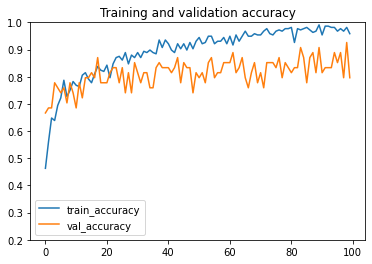

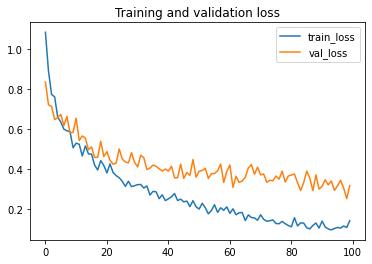

14/14 [==============================] - 1s 65ms/step - loss: 0.2702 - accuracy: 0.9259
{'loss': 0.2701917886734009, 'accuracy': 0.9259259104728699}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
54/54 [==============================] - 11s 144ms/step - loss: 1.3441 - accuracy: 0.4630 - val_loss: 1.0118 - val_accuracy: 0.4815

Epoch 00001: val_accuracy improved from -inf to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_2.h5
Epoch 2/100
54/54 [==============================] - 5s 92ms/step - loss: 1.0230 - accuracy: 0.5556 - val_loss: 0.9669 - val_accuracy: 0.5556

Epoch 00002: val_accuracy improved from 0.48148 to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_2.h5
Epoch 3/100
54/54 [==============================] - 6s 102ms/step - loss: 0.9205 - accuracy: 0.5463 - val_loss: 0.8928 - val_accuracy: 0.5185

Epoch 00003: val_accuracy did

54/54 [==============================] - 5s 92ms/step - loss: 0.1077 - accuracy: 0.9815 - val_loss: 0.3830 - val_accuracy: 0.8333

Epoch 00078: val_accuracy did not improve from 0.90741
Epoch 79/100
54/54 [==============================] - 5s 89ms/step - loss: 0.1060 - accuracy: 0.9769 - val_loss: 0.3742 - val_accuracy: 0.7778

Epoch 00079: val_accuracy did not improve from 0.90741
Epoch 80/100
54/54 [==============================] - 5s 89ms/step - loss: 0.1257 - accuracy: 0.9630 - val_loss: 0.4241 - val_accuracy: 0.7778

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
54/54 [==============================] - 5s 89ms/step - loss: 0.1187 - accuracy: 0.9815 - val_loss: 0.3410 - val_accuracy: 0.8519

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
54/54 [==============================] - 5s 93ms/step - loss: 0.0998 - accuracy: 0.9907 - val_loss: 0.4644 - val_accuracy: 0.7407

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
54/54

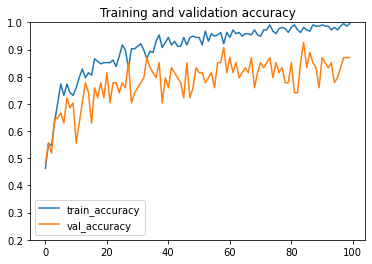

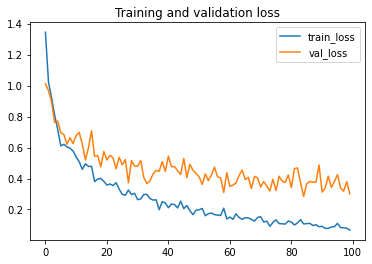

14/14 [==============================] - 1s 64ms/step - loss: 0.3852 - accuracy: 0.8333
{'loss': 0.38519540429115295, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
54/54 [==============================] - 10s 115ms/step - loss: 1.1281 - accuracy: 0.5185 - val_loss: 0.7729 - val_accuracy: 0.6481

Epoch 00001: val_accuracy improved from -inf to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_3.h5
Epoch 2/100
54/54 [==============================] - 5s 89ms/step - loss: 0.9297 - accuracy: 0.5833 - val_loss: 0.6063 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.64815 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_3.h5
Epoch 3/100
54/54 [==============================] - 5s 89ms/step - loss: 0.7642 - accuracy: 0.6343 - val_loss: 0.6843 - val_accuracy: 0.7222

Epoch 00003: val_accuracy did

Epoch 38/100
54/54 [==============================] - 5s 100ms/step - loss: 0.2205 - accuracy: 0.9120 - val_loss: 0.3420 - val_accuracy: 0.8704

Epoch 00038: val_accuracy did not improve from 0.90741
Epoch 39/100
54/54 [==============================] - 6s 102ms/step - loss: 0.2637 - accuracy: 0.8981 - val_loss: 0.2927 - val_accuracy: 0.8148

Epoch 00039: val_accuracy did not improve from 0.90741
Epoch 40/100
54/54 [==============================] - 5s 87ms/step - loss: 0.2368 - accuracy: 0.9306 - val_loss: 0.3308 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.90741
Epoch 41/100
54/54 [==============================] - 5s 90ms/step - loss: 0.2840 - accuracy: 0.8889 - val_loss: 0.3496 - val_accuracy: 0.8333

Epoch 00041: val_accuracy did not improve from 0.90741
Epoch 42/100
54/54 [==============================] - 5s 86ms/step - loss: 0.2258 - accuracy: 0.9259 - val_loss: 0.3965 - val_accuracy: 0.8333

Epoch 00042: val_accuracy did not improve from 0.90741
Epo

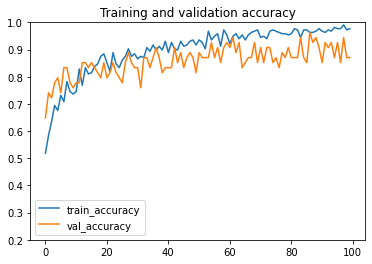

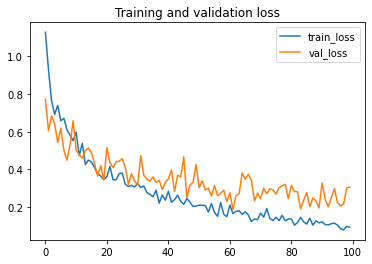

14/14 [==============================] - 1s 66ms/step - loss: 0.2693 - accuracy: 0.9259
{'loss': 0.26925128698349, 'accuracy': 0.9259259104728699}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
54/54 [==============================] - 11s 118ms/step - loss: 1.1678 - accuracy: 0.4815 - val_loss: 0.8131 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_4.h5
Epoch 2/100
54/54 [==============================] - 5s 92ms/step - loss: 0.9568 - accuracy: 0.5556 - val_loss: 0.7465 - val_accuracy: 0.7593

Epoch 00002: val_accuracy improved from 0.62963 to 0.75926, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_4.h5
Epoch 3/100
54/54 [==============================] - 5s 89ms/step - loss: 0.8645 - accuracy: 0.6065 - val_loss: 0.7061 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did no


Epoch 00079: val_accuracy did not improve from 0.87037
Epoch 80/100
54/54 [==============================] - 5s 89ms/step - loss: 0.1044 - accuracy: 0.9769 - val_loss: 0.4451 - val_accuracy: 0.7593

Epoch 00080: val_accuracy did not improve from 0.87037
Epoch 81/100
54/54 [==============================] - 5s 88ms/step - loss: 0.1105 - accuracy: 0.9769 - val_loss: 0.5356 - val_accuracy: 0.7222

Epoch 00081: val_accuracy did not improve from 0.87037
Epoch 82/100
54/54 [==============================] - 5s 88ms/step - loss: 0.1096 - accuracy: 0.9815 - val_loss: 0.4892 - val_accuracy: 0.7407

Epoch 00082: val_accuracy did not improve from 0.87037
Epoch 83/100
54/54 [==============================] - 5s 87ms/step - loss: 0.1272 - accuracy: 0.9630 - val_loss: 0.4240 - val_accuracy: 0.8148

Epoch 00083: val_accuracy did not improve from 0.87037
Epoch 84/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0889 - accuracy: 0.9907 - val_loss: 0.4437 - val_accuracy: 0.7963

Epoc

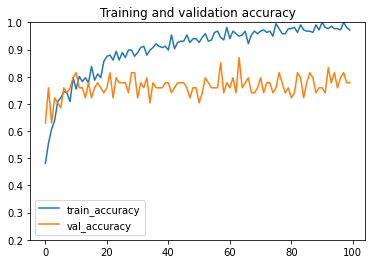

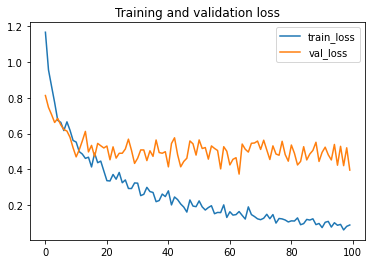

14/14 [==============================] - 1s 63ms/step - loss: 0.5633 - accuracy: 0.7593
{'loss': 0.5633243322372437, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
54/54 [==============================] - 10s 111ms/step - loss: 1.2030 - accuracy: 0.4074 - val_loss: 0.9362 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_5.h5
Epoch 2/100
54/54 [==============================] - 5s 87ms/step - loss: 0.8685 - accuracy: 0.5694 - val_loss: 0.8888 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.57407 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_5\model_5.h5
Epoch 3/100
54/54 [==============================] - 5s 87ms/step - loss: 0.8354 - accuracy: 0.5926 - val_loss: 0.8143 - val_accuracy: 0.6111

Epoch 00003: val_accuracy did 


Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/100
54/54 [==============================] - 5s 85ms/step - loss: 0.2784 - accuracy: 0.8750 - val_loss: 0.3576 - val_accuracy: 0.8519

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/100
54/54 [==============================] - 5s 93ms/step - loss: 0.2912 - accuracy: 0.8796 - val_loss: 0.4100 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/100
54/54 [==============================] - 5s 100ms/step - loss: 0.2604 - accuracy: 0.9028 - val_loss: 0.3923 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/100
54/54 [==============================] - 5s 96ms/step - loss: 0.2405 - accuracy: 0.9213 - val_loss: 0.4073 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/100
54/54 [==============================] - 5s 94ms/step - loss: 0.2492 - accuracy: 0.9028 - val_loss: 0.4211 - val_accuracy: 0.8148

Epo


Epoch 00079: val_accuracy did not improve from 0.90741
Epoch 80/100
54/54 [==============================] - 5s 89ms/step - loss: 0.1281 - accuracy: 0.9676 - val_loss: 0.4195 - val_accuracy: 0.8333

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
54/54 [==============================] - 5s 88ms/step - loss: 0.1359 - accuracy: 0.9630 - val_loss: 0.3722 - val_accuracy: 0.8519

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
54/54 [==============================] - 5s 88ms/step - loss: 0.1338 - accuracy: 0.9769 - val_loss: 0.3269 - val_accuracy: 0.8519

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
54/54 [==============================] - 5s 92ms/step - loss: 0.1393 - accuracy: 0.9676 - val_loss: 0.3442 - val_accuracy: 0.8333

Epoch 00083: val_accuracy did not improve from 0.90741
Epoch 84/100
54/54 [==============================] - 5s 90ms/step - loss: 0.1329 - accuracy: 0.9769 - val_loss: 0.3567 - val_accuracy: 0.8519

Epoc

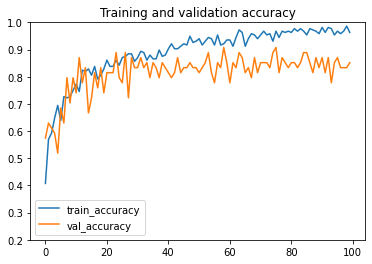

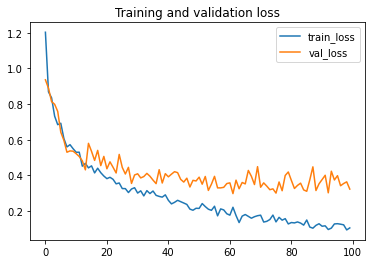

14/14 [==============================] - 1s 62ms/step - loss: 0.3478 - accuracy: 0.8519
{'loss': 0.34777283668518066, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
54/54 [==============================] - 10s 113ms/step - loss: 1.4803 - accuracy: 0.4815 - val_loss: 0.9805 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
54/54 [==============================] - 5s 91ms/step - loss: 0.9680 - accuracy: 0.5833 - val_loss: 0.8529 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.55556 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_1.h5
Epoch 3/100
54/54 [==============================] - 5s 93ms/step - loss: 0.7463 - accuracy: 0.6806 - val_loss: 0.7694 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.59259 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_1.h5
Epoch 4/100
54/54 [==============================] - 5s 93ms/step - loss: 0.6270 - accuracy: 0.7454 - val_loss: 0.6138 - val_accuracy: 0.6852

Epoch 00004: val_accuracy improved from 0.64815 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_1.h5
Epoch 5/100
54/54 [==============================] - 5s 93ms/step - loss: 0.5682 - accuracy: 0.7731 - val_loss: 0.5971 - val_accuracy: 0.6296

Epoch 00005: val_accuracy did not impr


Epoch 00079: val_accuracy did not improve from 0.92593
Epoch 80/100
54/54 [==============================] - 5s 93ms/step - loss: 0.0363 - accuracy: 0.9907 - val_loss: 0.3536 - val_accuracy: 0.8148

Epoch 00080: val_accuracy did not improve from 0.92593
Epoch 81/100
54/54 [==============================] - 5s 91ms/step - loss: 0.0664 - accuracy: 0.9676 - val_loss: 0.2692 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.92593
Epoch 82/100
54/54 [==============================] - 5s 91ms/step - loss: 0.0237 - accuracy: 0.9954 - val_loss: 0.3197 - val_accuracy: 0.9074

Epoch 00082: val_accuracy did not improve from 0.92593
Epoch 83/100
54/54 [==============================] - 5s 92ms/step - loss: 0.0132 - accuracy: 1.0000 - val_loss: 0.3747 - val_accuracy: 0.8704

Epoch 00083: val_accuracy did not improve from 0.92593
Epoch 84/100
54/54 [==============================] - 5s 93ms/step - loss: 0.0187 - accuracy: 1.0000 - val_loss: 0.2553 - val_accuracy: 0.8889

Epoc

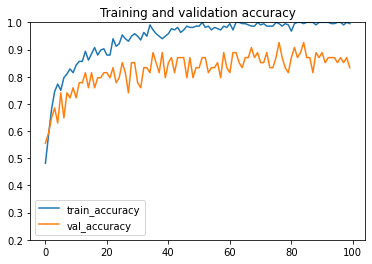

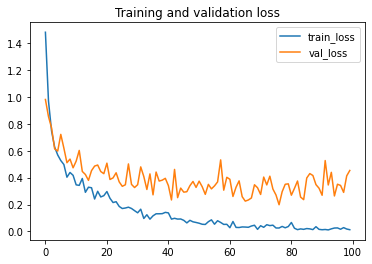

14/14 [==============================] - 1s 64ms/step - loss: 0.4549 - accuracy: 0.8519
{'loss': 0.45487138628959656, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
54/54 [==============================] - 10s 115ms/step - loss: 1.8018 - accuracy: 0.4306 - val_loss: 0.7779 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_2.h5
Epoch 2/100
54/54 [==============================] - 5s 89ms/step - loss: 1.0753 - accuracy: 0.6111 - val_loss: 0.7592 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.57407 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_2.h5
Epoch 3/100
54/54 [==============================] - 5s 90ms/step - loss: 0.8150 - accuracy: 0.6713 - val_loss: 0.5909 - val_accuracy: 0.6852

Epoch 00003: val_accuracy imp

54/54 [==============================] - 5s 93ms/step - loss: 0.0460 - accuracy: 0.9861 - val_loss: 0.4200 - val_accuracy: 0.8333

Epoch 00078: val_accuracy did not improve from 0.90741
Epoch 79/100
54/54 [==============================] - 5s 92ms/step - loss: 0.0191 - accuracy: 0.9954 - val_loss: 0.3953 - val_accuracy: 0.8704

Epoch 00079: val_accuracy did not improve from 0.90741
Epoch 80/100
54/54 [==============================] - 5s 90ms/step - loss: 0.0161 - accuracy: 1.0000 - val_loss: 0.3940 - val_accuracy: 0.8519

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
54/54 [==============================] - 5s 91ms/step - loss: 0.0147 - accuracy: 1.0000 - val_loss: 0.4128 - val_accuracy: 0.8333

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
54/54 [==============================] - 5s 91ms/step - loss: 0.0148 - accuracy: 1.0000 - val_loss: 0.3008 - val_accuracy: 0.8889

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
54/54

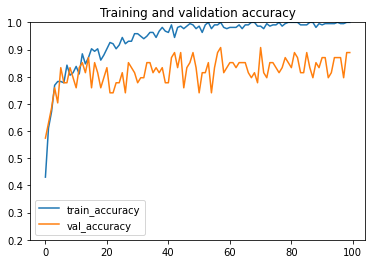

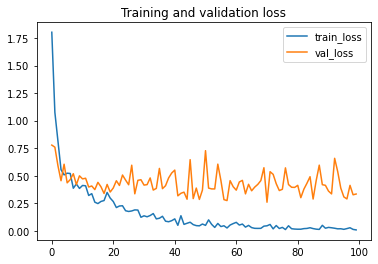

14/14 [==============================] - 1s 63ms/step - loss: 0.3076 - accuracy: 0.9074
{'loss': 0.30764421820640564, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
54/54 [==============================] - 10s 118ms/step - loss: 1.4367 - accuracy: 0.4537 - val_loss: 0.7252 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_3.h5
Epoch 2/100
54/54 [==============================] - 5s 90ms/step - loss: 0.9010 - accuracy: 0.6019 - val_loss: 0.6674 - val_accuracy: 0.6481

Epoch 00002: val_accuracy improved from 0.61111 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_3.h5
Epoch 3/100
54/54 [==============================] - 5s 91ms/step - loss: 0.9384 - accuracy: 0.5648 - val_loss: 0.4042 - val_accuracy: 0.8333

Epoch 00003: val_accuracy imp

54/54 [==============================] - 5s 92ms/step - loss: 0.1424 - accuracy: 0.9630 - val_loss: 0.2234 - val_accuracy: 0.8704

Epoch 00038: val_accuracy did not improve from 0.94444
Epoch 39/100
54/54 [==============================] - 5s 90ms/step - loss: 0.0975 - accuracy: 0.9722 - val_loss: 0.2017 - val_accuracy: 0.9074

Epoch 00039: val_accuracy did not improve from 0.94444
Epoch 40/100
54/54 [==============================] - 5s 90ms/step - loss: 0.1105 - accuracy: 0.9630 - val_loss: 0.2639 - val_accuracy: 0.8519

Epoch 00040: val_accuracy did not improve from 0.94444
Epoch 41/100
54/54 [==============================] - 5s 90ms/step - loss: 0.0992 - accuracy: 0.9722 - val_loss: 0.1388 - val_accuracy: 0.9444

Epoch 00041: val_accuracy did not improve from 0.94444
Epoch 42/100
54/54 [==============================] - 5s 91ms/step - loss: 0.1313 - accuracy: 0.9583 - val_loss: 0.1042 - val_accuracy: 0.9815

Epoch 00042: val_accuracy improved from 0.94444 to 0.98148, saving model 

54/54 [==============================] - 5s 89ms/step - loss: 0.0214 - accuracy: 1.0000 - val_loss: 0.1588 - val_accuracy: 0.9444

Epoch 00079: val_accuracy did not improve from 0.98148
Epoch 80/100
54/54 [==============================] - 5s 92ms/step - loss: 0.0280 - accuracy: 1.0000 - val_loss: 0.1456 - val_accuracy: 0.9444

Epoch 00080: val_accuracy did not improve from 0.98148
Epoch 81/100
54/54 [==============================] - 5s 90ms/step - loss: 0.0288 - accuracy: 0.9954 - val_loss: 0.1598 - val_accuracy: 0.9259

Epoch 00081: val_accuracy did not improve from 0.98148
Epoch 82/100
54/54 [==============================] - 5s 90ms/step - loss: 0.0185 - accuracy: 0.9954 - val_loss: 0.1756 - val_accuracy: 0.9074

Epoch 00082: val_accuracy did not improve from 0.98148
Epoch 83/100
54/54 [==============================] - 5s 90ms/step - loss: 0.0201 - accuracy: 0.9954 - val_loss: 0.1193 - val_accuracy: 0.9630

Epoch 00083: val_accuracy did not improve from 0.98148
Epoch 84/100
54/54

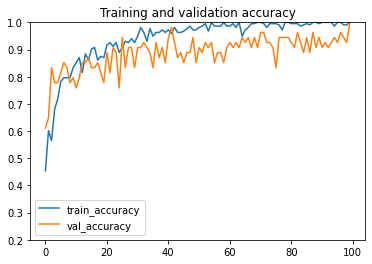

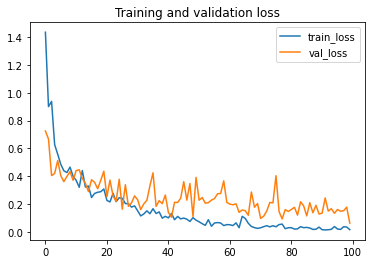

14/14 [==============================] - 1s 64ms/step - loss: 0.2059 - accuracy: 0.9259
{'loss': 0.20588873326778412, 'accuracy': 0.9259259104728699}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
54/54 [==============================] - 10s 115ms/step - loss: 1.3845 - accuracy: 0.4815 - val_loss: 0.6830 - val_accuracy: 0.7037

Epoch 00001: val_accuracy improved from -inf to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_4.h5
Epoch 2/100
54/54 [==============================] - 5s 90ms/step - loss: 0.7810 - accuracy: 0.6667 - val_loss: 0.6717 - val_accuracy: 0.7222

Epoch 00002: val_accuracy improved from 0.70370 to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_4.h5
Epoch 3/100
54/54 [==============================] - 5s 89ms/step - loss: 0.6827 - accuracy: 0.6991 - val_loss: 0.6271 - val_accuracy: 0.7037

Epoch 00003: val_accuracy did


Epoch 00038: val_accuracy did not improve from 0.81481
Epoch 39/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0850 - accuracy: 0.9907 - val_loss: 0.6383 - val_accuracy: 0.7593

Epoch 00039: val_accuracy did not improve from 0.81481
Epoch 40/100
54/54 [==============================] - 5s 88ms/step - loss: 0.0970 - accuracy: 0.9722 - val_loss: 0.5644 - val_accuracy: 0.8519

Epoch 00040: val_accuracy improved from 0.81481 to 0.85185, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_4.h5
Epoch 41/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0888 - accuracy: 0.9769 - val_loss: 0.5037 - val_accuracy: 0.8148los - ETA: 1s - loss: 0.0 - ETA: 0s - loss: 0.0903 - accura

Epoch 00041: val_accuracy did not improve from 0.85185
Epoch 42/100
54/54 [==============================] - 5s 86ms/step - loss: 0.1216 - accuracy: 0.9676 - val_loss: 0.4990 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.85185
Epoch 43/100
5

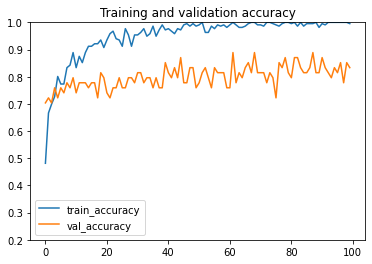

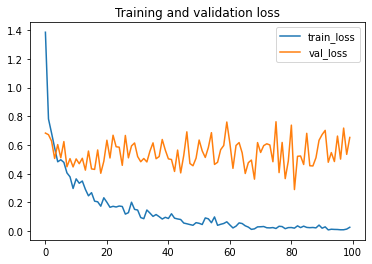

14/14 [==============================] - 1s 61ms/step - loss: 0.5169 - accuracy: 0.7963
{'loss': 0.5169047713279724, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
54/54 [==============================] - 10s 112ms/step - loss: 1.4640 - accuracy: 0.5278 - val_loss: 1.1741 - val_accuracy: 0.6481

Epoch 00001: val_accuracy improved from -inf to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_5.h5
Epoch 2/100
54/54 [==============================] - 5s 86ms/step - loss: 0.8623 - accuracy: 0.6250 - val_loss: 0.5839 - val_accuracy: 0.7222

Epoch 00002: val_accuracy improved from 0.64815 to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_6\model_5.h5
Epoch 3/100
54/54 [==============================] - 5s 86ms/step - loss: 0.6550 - accuracy: 0.7407 - val_loss: 0.5604 - val_accuracy: 0.7963

Epoch 00003: val_accuracy impr


Epoch 00038: val_accuracy did not improve from 0.90741
Epoch 39/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0646 - accuracy: 0.9815 - val_loss: 0.4341 - val_accuracy: 0.8333

Epoch 00039: val_accuracy did not improve from 0.90741
Epoch 40/100
54/54 [==============================] - 5s 86ms/step - loss: 0.1063 - accuracy: 0.9583 - val_loss: 0.6095 - val_accuracy: 0.7778

Epoch 00040: val_accuracy did not improve from 0.90741
Epoch 41/100
54/54 [==============================] - 5s 86ms/step - loss: 0.1041 - accuracy: 0.9676 - val_loss: 0.4969 - val_accuracy: 0.8333

Epoch 00041: val_accuracy did not improve from 0.90741
Epoch 42/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0958 - accuracy: 0.9630 - val_loss: 0.4917 - val_accuracy: 0.8148

Epoch 00042: val_accuracy did not improve from 0.90741
Epoch 43/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0890 - accuracy: 0.9769 - val_loss: 0.4157 - val_accuracy: 0.8519

Epoc

54/54 [==============================] - 5s 86ms/step - loss: 0.0320 - accuracy: 0.9907 - val_loss: 0.3720 - val_accuracy: 0.8889

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0213 - accuracy: 0.9954 - val_loss: 0.3107 - val_accuracy: 0.8889

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0186 - accuracy: 0.9907 - val_loss: 0.5552 - val_accuracy: 0.8333

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0215 - accuracy: 0.9954 - val_loss: 0.4436 - val_accuracy: 0.8704

Epoch 00083: val_accuracy did not improve from 0.90741
Epoch 84/100
54/54 [==============================] - 5s 86ms/step - loss: 0.0292 - accuracy: 0.9861 - val_loss: 0.3426 - val_accuracy: 0.8519

Epoch 00084: val_accuracy did not improve from 0.90741
Epoch 85/100
54/54

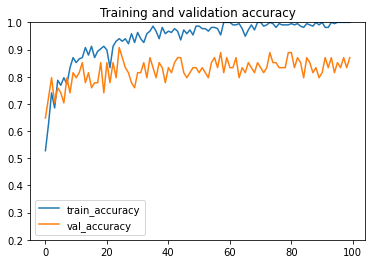

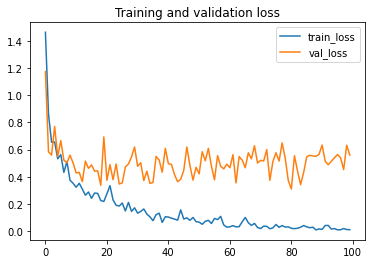

14/14 [==============================] - 1s 61ms/step - loss: 0.3743 - accuracy: 0.8519
{'loss': 0.374294251203537, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
27/27 [==============================] - 10s 227ms/step - loss: 1.3168 - accuracy: 0.4120 - val_loss: 0.9558 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
27/27 [==============================] - 4s 157ms/step - loss: 0.9265 - accuracy: 0.5278 - val_loss: 0.8737 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.57407 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_1.h5
Epoch 3/20
27/27 [==============================] - 4s 155ms/step - loss: 0.8064 - accuracy: 0.6157 - val_loss: 0.7664 - val_accuracy: 0.6667

Epoch 00003: val_accuracy improved from 0.61111 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_1.h5
Epoch 4/20
27/27 [==============================] - 4s 156ms/step - loss: 0.7475 - accuracy: 0.6481 - val_loss: 0.6958 - val_accuracy: 0.7037

Epoch 00004: val_accuracy improved from 0.66667 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_1.h5
Epoch 5/20
27/27 [==============================] - 4s 157ms/step - loss: 0.7030 - accuracy: 0.6759 - val_loss: 0.7393 - val_accuracy: 0.6111

Epoch 00005: val_accuracy did not impr

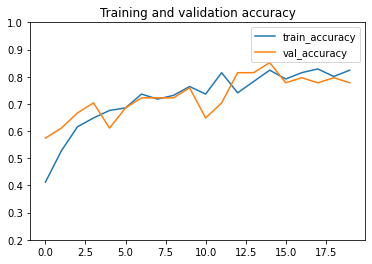

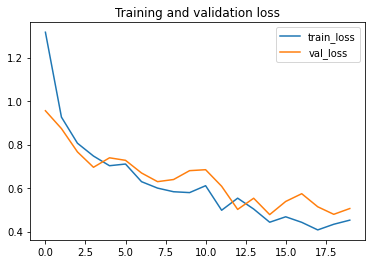

7/7 [==============================] - 1s 114ms/step - loss: 0.5413 - accuracy: 0.7037
{'loss': 0.541334867477417, 'accuracy': 0.7037037014961243}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
27/27 [==============================] - 9s 218ms/step - loss: 1.2990 - accuracy: 0.3796 - val_loss: 1.0468 - val_accuracy: 0.3889

Epoch 00001: val_accuracy improved from -inf to 0.38889, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_2.h5
Epoch 2/20
27/27 [==============================] - 5s 170ms/step - loss: 0.9917 - accuracy: 0.4954 - val_loss: 0.8447 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.38889 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_2.h5
Epoch 3/20
27/27 [==============================] - 5s 167ms/step - loss: 0.8483 - accuracy: 0.5833 - val_loss: 0.8084 - val_accuracy: 0.6111

Epoch 00003: val_accuracy did not 

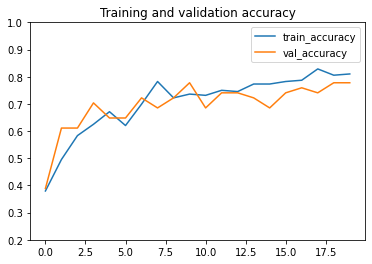

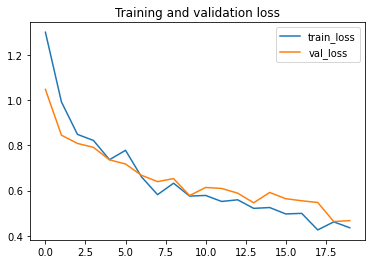

7/7 [==============================] - 1s 131ms/step - loss: 0.6836 - accuracy: 0.6296
{'loss': 0.6836208701133728, 'accuracy': 0.6296296119689941}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
27/27 [==============================] - 14s 365ms/step - loss: 1.1425 - accuracy: 0.4583 - val_loss: 0.7473 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_3.h5
Epoch 2/20
27/27 [==============================] - 5s 191ms/step - loss: 0.9211 - accuracy: 0.5787 - val_loss: 0.6425 - val_accuracy: 0.7222

Epoch 00002: val_accuracy improved from 0.68519 to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_3.h5
Epoch 3/20
27/27 [==============================] - 7s 232ms/step - loss: 0.8057 - accuracy: 0.6481 - val_loss: 0.6931 - val_accuracy: 0.7037

Epoch 00003: val_accuracy did no

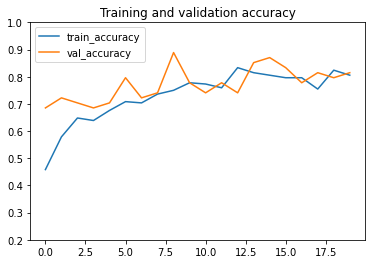

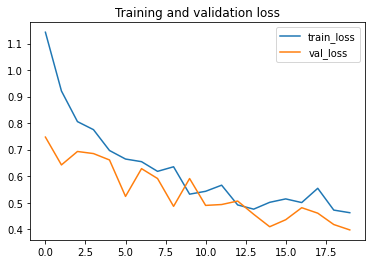

7/7 [==============================] - 1s 183ms/step - loss: 0.6057 - accuracy: 0.7407
{'loss': 0.6056663393974304, 'accuracy': 0.7407407164573669}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
27/27 [==============================] - 16s 266ms/step - loss: 1.0912 - accuracy: 0.4769 - val_loss: 0.8081 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_4.h5
Epoch 2/20
27/27 [==============================] - 5s 176ms/step - loss: 0.9225 - accuracy: 0.5139 - val_loss: 0.7848 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.68519
Epoch 3/20
27/27 [==============================] - 4s 155ms/step - loss: 0.8189 - accuracy: 0.6157 - val_loss: 0.7310 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did not improve from 0.68519
Epoch 4/20
27/27 [==============================] - 

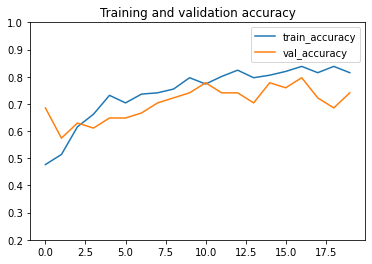

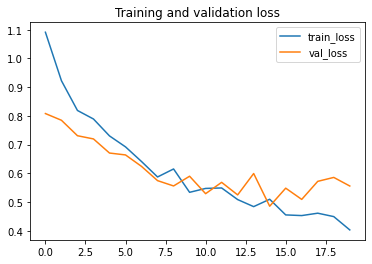

7/7 [==============================] - 1s 102ms/step - loss: 0.4954 - accuracy: 0.7593
{'loss': 0.4953650236129761, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
27/27 [==============================] - 9s 226ms/step - loss: 1.2160 - accuracy: 0.4167 - val_loss: 0.9680 - val_accuracy: 0.4815

Epoch 00001: val_accuracy improved from -inf to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_5.h5
Epoch 2/20
27/27 [==============================] - 4s 161ms/step - loss: 0.9143 - accuracy: 0.5880 - val_loss: 0.8725 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.48148 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_7\model_5.h5
Epoch 3/20
27/27 [==============================] - 5s 164ms/step - loss: 0.8722 - accuracy: 0.6250 - val_loss: 0.8149 - val_accuracy: 0.6111

Epoch 00003: val_accuracy did not

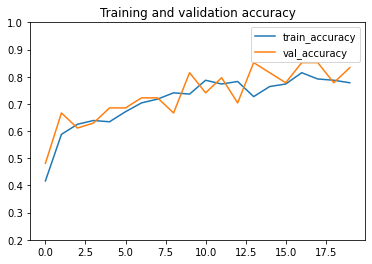

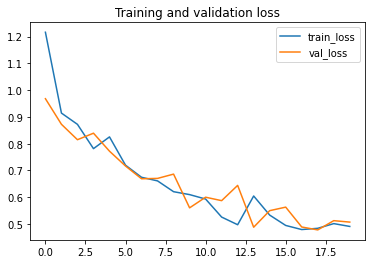

7/7 [==============================] - 1s 100ms/step - loss: 0.5707 - accuracy: 0.7778
{'loss': 0.5707469582557678, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
27/27 [==============================] - 9s 202ms/step - loss: 1.6059 - accuracy: 0.5000 - val_loss: 0.7623 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
27/27 [==============================] - 5s 170ms/step - loss: 0.8492 - accuracy: 0.5833 - val_loss: 0.6801 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.61111 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_1.h5
Epoch 3/20
27/27 [==============================] - 4s 159ms/step - loss: 0.6661 - accuracy: 0.6620 - val_loss: 0.5441 - val_accuracy: 0.7222

Epoch 00003: val_accuracy improved from 0.62963 to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_1.h5
Epoch 4/20
27/27 [==============================] - 5s 167ms/step - loss: 0.5688 - accuracy: 0.7315 - val_loss: 0.6909 - val_accuracy: 0.6667

Epoch 00004: val_accuracy did not improve from 0.72222
Epoch 5/20
27/27 [==============================] - 5s 192ms/step - loss: 0.5329 - accuracy: 0.7454 - val_loss: 0.5298 - val_accuracy: 0.7407

Epoch 00005: val_accuracy improved from 0.72222 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_mod

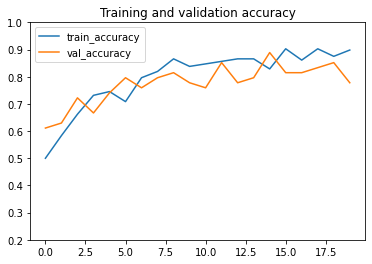

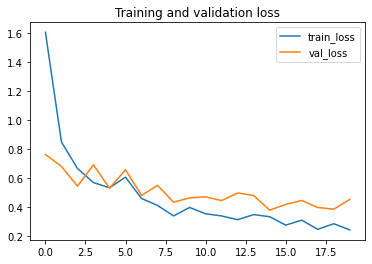

7/7 [==============================] - 1s 117ms/step - loss: 0.4173 - accuracy: 0.8148
{'loss': 0.4172576367855072, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
27/27 [==============================] - 9s 206ms/step - loss: 1.4184 - accuracy: 0.4537 - val_loss: 0.7724 - val_accuracy: 0.6481

Epoch 00001: val_accuracy improved from -inf to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_2.h5
Epoch 2/20
27/27 [==============================] - 4s 153ms/step - loss: 0.7822 - accuracy: 0.6713 - val_loss: 0.6323 - val_accuracy: 0.6481

Epoch 00002: val_accuracy did not improve from 0.64815
Epoch 3/20
27/27 [==============================] - 4s 131ms/step - loss: 0.7123 - accuracy: 0.6713 - val_loss: 0.6796 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did not improve from 0.64815
Epoch 4/20
27/27 [==============================] - 4

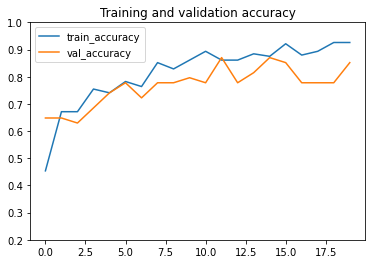

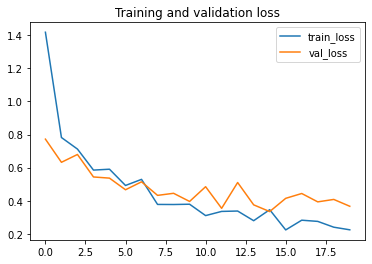

7/7 [==============================] - 1s 115ms/step - loss: 0.3963 - accuracy: 0.8148
{'loss': 0.3963462710380554, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
27/27 [==============================] - 8s 196ms/step - loss: 1.5846 - accuracy: 0.4537 - val_loss: 0.6358 - val_accuracy: 0.7407

Epoch 00001: val_accuracy improved from -inf to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_3.h5
Epoch 2/20
27/27 [==============================] - 4s 139ms/step - loss: 1.0687 - accuracy: 0.5231 - val_loss: 0.6407 - val_accuracy: 0.6667

Epoch 00002: val_accuracy did not improve from 0.74074
Epoch 3/20
27/27 [==============================] - 4s 154ms/step - loss: 0.7361 - accuracy: 0.6806 - val_loss: 0.4882 - val_accuracy: 0.7778

Epoch 00003: val_accuracy improved from 0.74074 to 0.77778, saving model to C:/Users/user/Desktop/Model/save

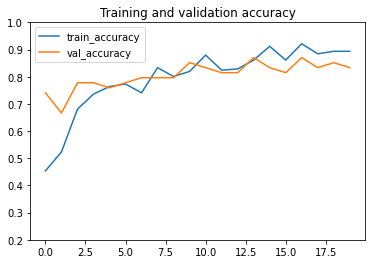

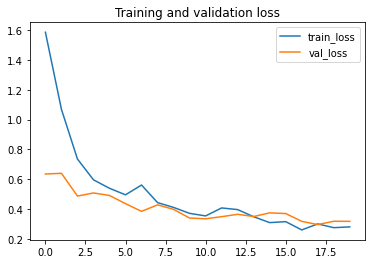

7/7 [==============================] - 1s 94ms/step - loss: 0.3064 - accuracy: 0.8333
{'loss': 0.30643773078918457, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
27/27 [==============================] - 9s 209ms/step - loss: 1.4405 - accuracy: 0.5185 - val_loss: 0.8949 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_4.h5
Epoch 2/20
27/27 [==============================] - 4s 155ms/step - loss: 0.7667 - accuracy: 0.6852 - val_loss: 0.8319 - val_accuracy: 0.6111

Epoch 00002: val_accuracy did not improve from 0.68519
Epoch 3/20
27/27 [==============================] - 4s 156ms/step - loss: 0.6293 - accuracy: 0.7685 - val_loss: 0.6003 - val_accuracy: 0.7407

Epoch 00003: val_accuracy improved from 0.68519 to 0.74074, saving model to C:/Users/user/Desktop/Model/save

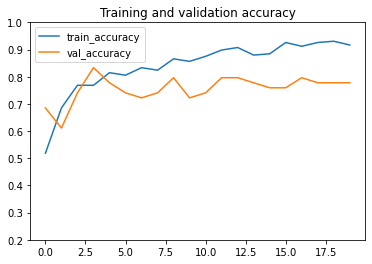

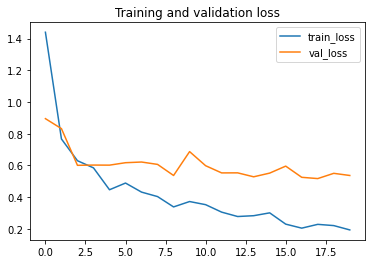

7/7 [==============================] - 1s 113ms/step - loss: 0.5473 - accuracy: 0.7407
{'loss': 0.5472779273986816, 'accuracy': 0.7407407164573669}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
27/27 [==============================] - 8s 196ms/step - loss: 2.0687 - accuracy: 0.4352 - val_loss: 0.9873 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_5.h5
Epoch 2/20
27/27 [==============================] - 4s 157ms/step - loss: 0.9245 - accuracy: 0.6389 - val_loss: 0.7315 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.57407 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_8\model_5.h5
Epoch 3/20
27/27 [==============================] - 4s 128ms/step - loss: 0.6844 - accuracy: 0.7037 - val_loss: 0.6441 - val_accuracy: 0.7593

Epoch 00003: val_accuracy improve

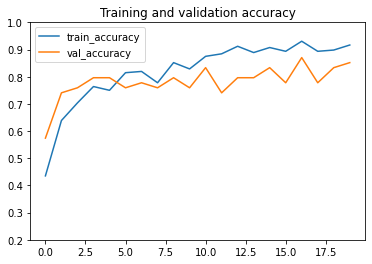

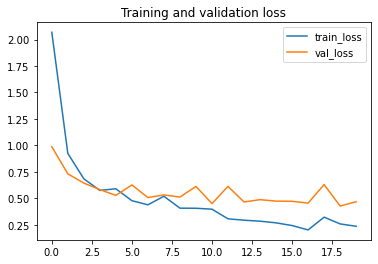

7/7 [==============================] - 1s 114ms/step - loss: 0.4718 - accuracy: 0.8148
{'loss': 0.4718035161495209, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
27/27 [==============================] - 9s 199ms/step - loss: 1.2472 - accuracy: 0.3657 - val_loss: 1.0184 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
27/27 [==============================] - 4s 147ms/step - loss: 0.9365 - accuracy: 0.5231 - val_loss: 0.8588 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.57407 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_1.h5
Epoch 3/50
27/27 [==============================] - 4s 155ms/step - loss: 0.9136 - accuracy: 0.5556 - val_loss: 0.7784 - val_accuracy: 0.6111

Epoch 00003: val_accuracy did not improve from 0.61111
Epoch 4/50
27/27 [==============================] - 4s 156ms/step - loss: 0.7869 - accuracy: 0.6204 - val_loss: 0.8384 - val_accuracy: 0.5556

Epoch 00004: val_accuracy did not improve from 0.61111
Epoch 5/50
27/27 [==============================] - 4s 155ms/step - loss: 0.7299 - accuracy: 0.6806 - val_loss: 0.7235 - val_accuracy: 0.7037

Epoch 00005: val_accuracy improved from 0.61111 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_1.h5
Epoch 6/50
27/27 [==============================] - 4s 155

27/27 [==============================] - 4s 156ms/step - loss: 0.2981 - accuracy: 0.8750 - val_loss: 0.4272 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/50
27/27 [==============================] - 4s 155ms/step - loss: 0.2878 - accuracy: 0.8657 - val_loss: 0.4093 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.83333
Epoch 43/50
27/27 [==============================] - 4s 155ms/step - loss: 0.2320 - accuracy: 0.9074 - val_loss: 0.4401 - val_accuracy: 0.8148

Epoch 00043: val_accuracy did not improve from 0.83333
Epoch 44/50
27/27 [==============================] - 4s 154ms/step - loss: 0.2669 - accuracy: 0.9074 - val_loss: 0.4933 - val_accuracy: 0.7593

Epoch 00044: val_accuracy did not improve from 0.83333
Epoch 45/50
27/27 [==============================] - 4s 154ms/step - loss: 0.2452 - accuracy: 0.9074 - val_loss: 0.4506 - val_accuracy: 0.7222

Epoch 00045: val_accuracy did not improve from 0.83333
Epoch 46/50
27/27

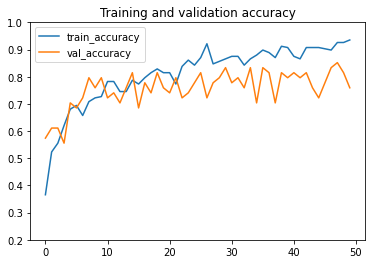

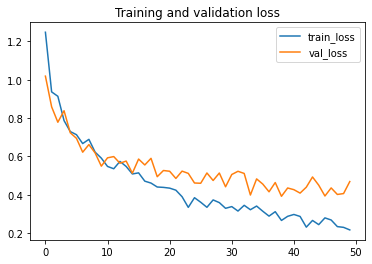

7/7 [==============================] - 1s 112ms/step - loss: 0.4138 - accuracy: 0.7778
{'loss': 0.4137732684612274, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
27/27 [==============================] - 8s 202ms/step - loss: 1.1387 - accuracy: 0.4306 - val_loss: 0.8743 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_2.h5
Epoch 2/50
27/27 [==============================] - 4s 145ms/step - loss: 0.9057 - accuracy: 0.5602 - val_loss: 0.7892 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.61111 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_2.h5
Epoch 3/50
27/27 [==============================] - 4s 132ms/step - loss: 0.8372 - accuracy: 0.6389 - val_loss: 0.7756 - val_accuracy: 0.6481

Epoch 00003: val_accuracy did not


Epoch 00038: val_accuracy did not improve from 0.85185
Epoch 39/50
27/27 [==============================] - 4s 156ms/step - loss: 0.3199 - accuracy: 0.8472 - val_loss: 0.4433 - val_accuracy: 0.7593

Epoch 00039: val_accuracy did not improve from 0.85185
Epoch 40/50
27/27 [==============================] - 4s 159ms/step - loss: 0.3169 - accuracy: 0.8750 - val_loss: 0.4289 - val_accuracy: 0.7778

Epoch 00040: val_accuracy did not improve from 0.85185
Epoch 41/50
27/27 [==============================] - 4s 155ms/step - loss: 0.3083 - accuracy: 0.9213 - val_loss: 0.4444 - val_accuracy: 0.7407

Epoch 00041: val_accuracy did not improve from 0.85185
Epoch 42/50
27/27 [==============================] - 4s 156ms/step - loss: 0.2989 - accuracy: 0.8889 - val_loss: 0.4768 - val_accuracy: 0.7593

Epoch 00042: val_accuracy did not improve from 0.85185
Epoch 43/50
27/27 [==============================] - 4s 154ms/step - loss: 0.2687 - accuracy: 0.9120 - val_loss: 0.4431 - val_accuracy: 0.8519

Epoc

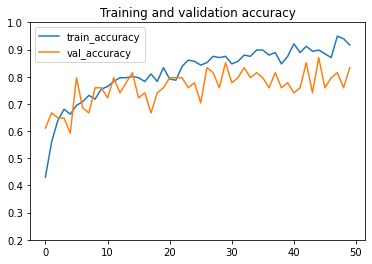

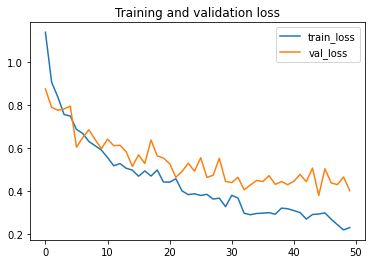

7/7 [==============================] - 1s 113ms/step - loss: 0.4343 - accuracy: 0.8519
{'loss': 0.43430212140083313, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
27/27 [==============================] - 8s 197ms/step - loss: 1.3235 - accuracy: 0.3843 - val_loss: 1.0012 - val_accuracy: 0.4815

Epoch 00001: val_accuracy improved from -inf to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_3.h5
Epoch 2/50
27/27 [==============================] - 4s 156ms/step - loss: 0.9950 - accuracy: 0.5324 - val_loss: 0.7516 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.48148 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_3.h5
Epoch 3/50
27/27 [==============================] - 4s 127ms/step - loss: 0.9665 - accuracy: 0.5139 - val_loss: 0.7930 - val_accuracy: 0.6111

Epoch 00003: val_accuracy did no


Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/50
27/27 [==============================] - 4s 156ms/step - loss: 0.3458 - accuracy: 0.8519 - val_loss: 0.3517 - val_accuracy: 0.8704

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/50
27/27 [==============================] - 4s 158ms/step - loss: 0.3121 - accuracy: 0.8796 - val_loss: 0.3804 - val_accuracy: 0.7963

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/50
27/27 [==============================] - 4s 157ms/step - loss: 0.3288 - accuracy: 0.8704 - val_loss: 0.3910 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/50
27/27 [==============================] - 4s 160ms/step - loss: 0.3214 - accuracy: 0.8935 - val_loss: 0.3336 - val_accuracy: 0.8333

Epoch 00042: val_accuracy did not improve from 0.87037
Epoch 43/50
27/27 [==============================] - 4s 156ms/step - loss: 0.2910 - accuracy: 0.8889 - val_loss: 0.3207 - val_accuracy: 0.8889

Epoc

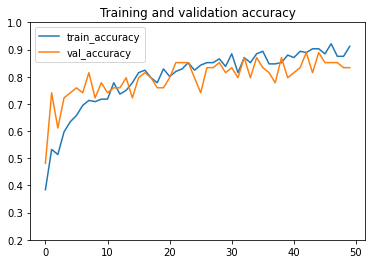

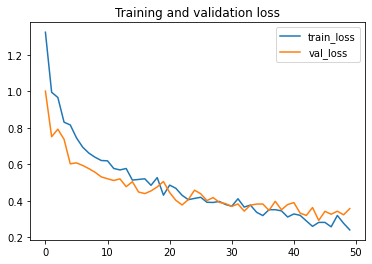

7/7 [==============================] - 1s 114ms/step - loss: 0.3162 - accuracy: 0.8519
{'loss': 0.3161695897579193, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
27/27 [==============================] - 8s 195ms/step - loss: 1.2312 - accuracy: 0.4028 - val_loss: 0.9110 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_4.h5
Epoch 2/50
27/27 [==============================] - 4s 156ms/step - loss: 0.9969 - accuracy: 0.5185 - val_loss: 0.9083 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.57407
Epoch 3/50
27/27 [==============================] - 4s 156ms/step - loss: 0.9233 - accuracy: 0.5556 - val_loss: 0.7345 - val_accuracy: 0.7222

Epoch 00003: val_accuracy improved from 0.57407 to 0.72222, saving model to C:/Users/user/Desktop/Model/save

27/27 [==============================] - 4s 155ms/step - loss: 0.2935 - accuracy: 0.8935 - val_loss: 0.4568 - val_accuracy: 0.7778

Epoch 00039: val_accuracy did not improve from 0.83333
Epoch 40/50
27/27 [==============================] - 4s 156ms/step - loss: 0.3444 - accuracy: 0.8611 - val_loss: 0.4227 - val_accuracy: 0.7593

Epoch 00040: val_accuracy did not improve from 0.83333
Epoch 41/50
27/27 [==============================] - 4s 155ms/step - loss: 0.2763 - accuracy: 0.9120 - val_loss: 0.4282 - val_accuracy: 0.7222

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/50
27/27 [==============================] - 4s 156ms/step - loss: 0.2791 - accuracy: 0.9028 - val_loss: 0.4508 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.83333
Epoch 43/50
27/27 [==============================] - 4s 157ms/step - loss: 0.2810 - accuracy: 0.8935 - val_loss: 0.4157 - val_accuracy: 0.8148

Epoch 00043: val_accuracy did not improve from 0.83333
Epoch 44/50
27/27

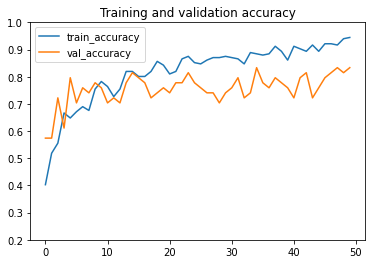

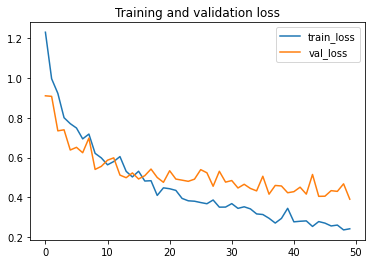

7/7 [==============================] - 1s 114ms/step - loss: 0.4990 - accuracy: 0.7222
{'loss': 0.4990459978580475, 'accuracy': 0.7222222089767456}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
27/27 [==============================] - 9s 199ms/step - loss: 1.2357 - accuracy: 0.4259 - val_loss: 1.0536 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_5.h5
Epoch 2/50
27/27 [==============================] - 4s 150ms/step - loss: 1.0121 - accuracy: 0.5139 - val_loss: 0.9007 - val_accuracy: 0.5185

Epoch 00002: val_accuracy improved from 0.50000 to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_5.h5
Epoch 3/50
27/27 [==============================] - 4s 146ms/step - loss: 0.8826 - accuracy: 0.5880 - val_loss: 0.8557 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improve

27/27 [==============================] - 9s 319ms/step - loss: 0.3325 - accuracy: 0.8750 - val_loss: 0.4816 - val_accuracy: 0.7963

Epoch 00038: val_accuracy did not improve from 0.85185
Epoch 39/50
27/27 [==============================] - 6s 194ms/step - loss: 0.3106 - accuracy: 0.8565 - val_loss: 0.4010 - val_accuracy: 0.8704

Epoch 00039: val_accuracy improved from 0.85185 to 0.87037, saving model to C:/Users/user/Desktop/Model/saved_models_9\model_5.h5
Epoch 40/50
27/27 [==============================] - 4s 164ms/step - loss: 0.2921 - accuracy: 0.8981 - val_loss: 0.3757 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/50
27/27 [==============================] - 5s 167ms/step - loss: 0.2896 - accuracy: 0.9028 - val_loss: 0.4458 - val_accuracy: 0.7963

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/50
27/27 [==============================] - 4s 160ms/step - loss: 0.2911 - accuracy: 0.8981 - val_loss: 0.5302 - val_accuracy: 0.814

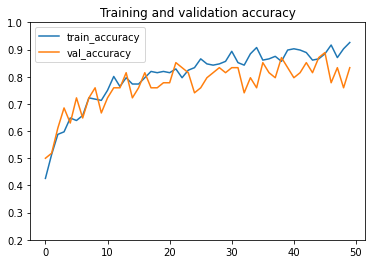

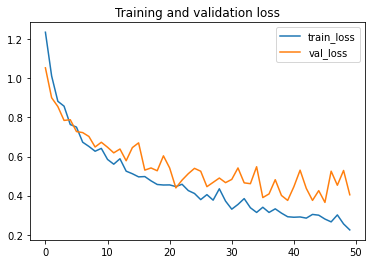

7/7 [==============================] - 1s 148ms/step - loss: 0.4131 - accuracy: 0.8333
{'loss': 0.4130522310733795, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
27/27 [==============================] - 9s 203ms/step - loss: 1.5832 - accuracy: 0.4398 - val_loss: 1.0059 - val_accuracy: 0.4444

Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
27/27 [==============================] - 4s 159ms/step - loss: 0.8603 - accuracy: 0.5926 - val_loss: 0.6980 - val_accuracy: 0.6852

Epoch 00002: val_accuracy improved from 0.44444 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_1.h5
Epoch 3/50
27/27 [==============================] - 5s 165ms/step - loss: 0.8063 - accuracy: 0.6250 - val_loss: 0.8131 - val_accuracy: 0.5741

Epoch 00003: val_accuracy did not improve from 0.68519
Epoch 4/50
27/27 [==============================] - 4s 161ms/step - loss: 0.6469 - accuracy: 0.7037 - val_loss: 0.5049 - val_accuracy: 0.8519

Epoch 00004: val_accuracy improved from 0.68519 to 0.85185, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_1.h5
Epoch 5/50
27/27 [==============================] - 4s 147ms/step - loss: 0.6078 - accuracy: 0.7176 - val_loss: 0.5142 - val_accuracy: 0.7963

Epoch 00005: val_accuracy did not improve from 0.85185
Epoch 6/50
27/27 [==============================] - 4s 1


Epoch 00041: val_accuracy did not improve from 0.90741
Epoch 42/50
27/27 [==============================] - 4s 155ms/step - loss: 0.1305 - accuracy: 0.9583 - val_loss: 0.3481 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.90741
Epoch 43/50
27/27 [==============================] - 4s 155ms/step - loss: 0.0870 - accuracy: 0.9769 - val_loss: 0.2511 - val_accuracy: 0.8889

Epoch 00043: val_accuracy did not improve from 0.90741
Epoch 44/50
27/27 [==============================] - 4s 156ms/step - loss: 0.0923 - accuracy: 0.9815 - val_loss: 0.2622 - val_accuracy: 0.8889

Epoch 00044: val_accuracy did not improve from 0.90741
Epoch 45/50
27/27 [==============================] - 4s 158ms/step - loss: 0.1112 - accuracy: 0.9722 - val_loss: 0.3103 - val_accuracy: 0.8704

Epoch 00045: val_accuracy did not improve from 0.90741
Epoch 46/50
27/27 [==============================] - 4s 157ms/step - loss: 0.0857 - accuracy: 0.9815 - val_loss: 0.2931 - val_accuracy: 0.8333

Epoc

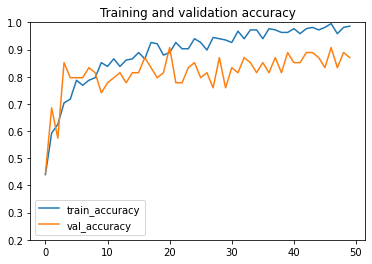

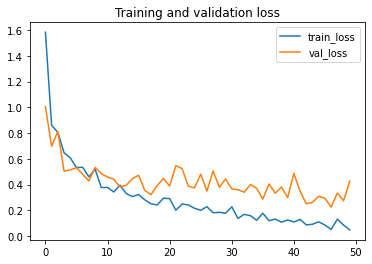

7/7 [==============================] - 1s 106ms/step - loss: 0.3547 - accuracy: 0.8148
{'loss': 0.3546693027019501, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
27/27 [==============================] - 11s 215ms/step - loss: 1.7489 - accuracy: 0.4167 - val_loss: 0.9450 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_2.h5
Epoch 2/50
27/27 [==============================] - 4s 128ms/step - loss: 1.0325 - accuracy: 0.5370 - val_loss: 0.9138 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.55556 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_2.h5
Epoch 3/50
27/27 [==============================] - 4s 157ms/step - loss: 0.7732 - accuracy: 0.6435 - val_loss: 0.6786 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did 

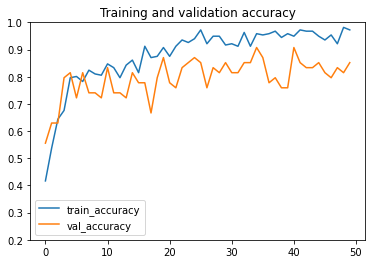

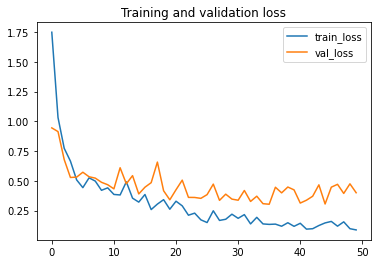

7/7 [==============================] - 1s 116ms/step - loss: 0.3678 - accuracy: 0.8333
{'loss': 0.36780494451522827, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
27/27 [==============================] - 9s 216ms/step - loss: 1.4052 - accuracy: 0.4722 - val_loss: 0.6618 - val_accuracy: 0.7222

Epoch 00001: val_accuracy improved from -inf to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_3.h5
Epoch 2/50
27/27 [==============================] - 4s 156ms/step - loss: 0.8280 - accuracy: 0.6250 - val_loss: 0.5613 - val_accuracy: 0.7222

Epoch 00002: val_accuracy did not improve from 0.72222
Epoch 3/50
27/27 [==============================] - 4s 161ms/step - loss: 0.6347 - accuracy: 0.7315 - val_loss: 0.5197 - val_accuracy: 0.6296

Epoch 00003: val_accuracy did not improve from 0.72222
Epoch 4/50
27/27 [==============================] -

27/27 [==============================] - 4s 157ms/step - loss: 0.1605 - accuracy: 0.9444 - val_loss: 0.2631 - val_accuracy: 0.8704

Epoch 00039: val_accuracy did not improve from 0.90741
Epoch 40/50
27/27 [==============================] - 4s 159ms/step - loss: 0.1644 - accuracy: 0.9213 - val_loss: 0.2478 - val_accuracy: 0.8704

Epoch 00040: val_accuracy did not improve from 0.90741
Epoch 41/50
27/27 [==============================] - 4s 158ms/step - loss: 0.1521 - accuracy: 0.9398 - val_loss: 0.2133 - val_accuracy: 0.9074

Epoch 00041: val_accuracy did not improve from 0.90741
Epoch 42/50
27/27 [==============================] - 4s 157ms/step - loss: 0.1351 - accuracy: 0.9630 - val_loss: 0.2355 - val_accuracy: 0.9074

Epoch 00042: val_accuracy did not improve from 0.90741
Epoch 43/50
27/27 [==============================] - 4s 158ms/step - loss: 0.1490 - accuracy: 0.9491 - val_loss: 0.2360 - val_accuracy: 0.8889

Epoch 00043: val_accuracy did not improve from 0.90741
Epoch 44/50
27/27

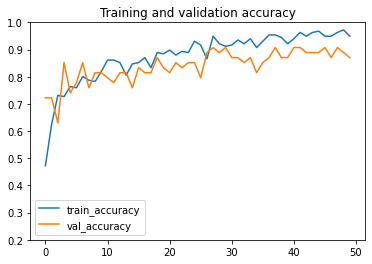

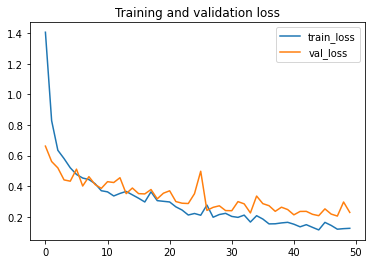

7/7 [==============================] - 1s 96ms/step - loss: 0.3366 - accuracy: 0.8333
{'loss': 0.3366372585296631, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
27/27 [==============================] - 8s 205ms/step - loss: 1.4886 - accuracy: 0.4815 - val_loss: 0.7935 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_4.h5
Epoch 2/50
27/27 [==============================] - 4s 130ms/step - loss: 0.8243 - accuracy: 0.6296 - val_loss: 0.5744 - val_accuracy: 0.7593

Epoch 00002: val_accuracy improved from 0.57407 to 0.75926, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_4.h5
Epoch 3/50
27/27 [==============================] - 4s 148ms/step - loss: 0.6278 - accuracy: 0.7315 - val_loss: 0.6042 - val_accuracy: 0.7037

Epoch 00003: val_accuracy did no


Epoch 00038: val_accuracy did not improve from 0.83333
Epoch 39/50
27/27 [==============================] - 4s 158ms/step - loss: 0.1171 - accuracy: 0.9537 - val_loss: 0.4614 - val_accuracy: 0.7778

Epoch 00039: val_accuracy did not improve from 0.83333
Epoch 40/50
27/27 [==============================] - 4s 157ms/step - loss: 0.0726 - accuracy: 0.9907 - val_loss: 0.5679 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.83333
Epoch 41/50
27/27 [==============================] - 4s 158ms/step - loss: 0.0963 - accuracy: 0.9676 - val_loss: 0.6210 - val_accuracy: 0.7407

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/50
27/27 [==============================] - 4s 158ms/step - loss: 0.0680 - accuracy: 0.9907 - val_loss: 0.5097 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.83333
Epoch 43/50
27/27 [==============================] - 4s 157ms/step - loss: 0.0857 - accuracy: 0.9815 - val_loss: 0.5502 - val_accuracy: 0.7407

Epoc

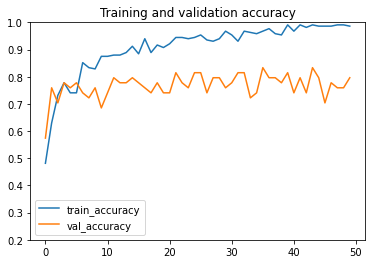

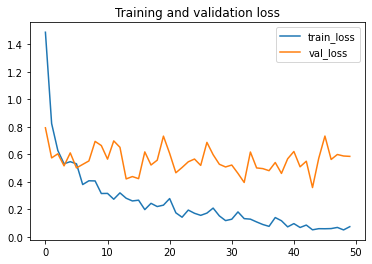

7/7 [==============================] - 1s 126ms/step - loss: 0.4703 - accuracy: 0.8519
{'loss': 0.4703279733657837, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
27/27 [==============================] - 9s 200ms/step - loss: 1.5268 - accuracy: 0.5278 - val_loss: 0.7568 - val_accuracy: 0.6667

Epoch 00001: val_accuracy improved from -inf to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_5.h5
Epoch 2/50
27/27 [==============================] - 4s 128ms/step - loss: 0.9256 - accuracy: 0.6435 - val_loss: 0.6765 - val_accuracy: 0.7963

Epoch 00002: val_accuracy improved from 0.66667 to 0.79630, saving model to C:/Users/user/Desktop/Model/saved_models_10\model_5.h5
Epoch 3/50
27/27 [==============================] - 4s 138ms/step - loss: 0.7709 - accuracy: 0.6435 - val_loss: 0.7035 - val_accuracy: 0.6667

Epoch 00003: val_accuracy did n

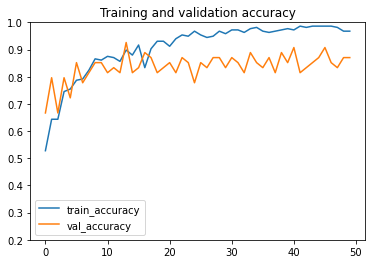

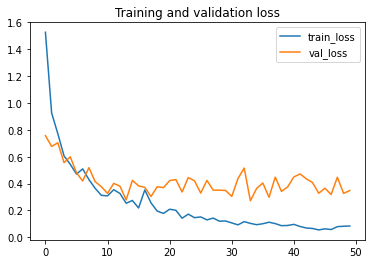

7/7 [==============================] - 1s 114ms/step - loss: 0.3865 - accuracy: 0.8148
{'loss': 0.38652193546295166, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
27/27 [==============================] - 9s 212ms/step - loss: 1.3236 - accuracy: 0.4120 - val_loss: 0.9572 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
27/27 [==============================] - 4s 153ms/step - loss: 0.9697 - accuracy: 0.5324 - val_loss: 0.8601 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.55556 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_1.h5
Epoch 3/100
27/27 [==============================] - 4s 161ms/step - loss: 0.8334 - accuracy: 0.6111 - val_loss: 0.8089 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved from 0.59259 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_1.h5
Epoch 4/100
27/27 [==============================] - 4s 148ms/step - loss: 0.8468 - accuracy: 0.5972 - val_loss: 0.7137 - val_accuracy: 0.7407

Epoch 00004: val_accuracy improved from 0.61111 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_1.h5
Epoch 5/100
27/27 [==============================] - 4s 130ms/step - loss: 0.6868 - accuracy: 0.6944 - val_loss: 0.6800 - val_accuracy: 0.7222

Epoch 00005: val_accuracy did n

27/27 [==============================] - 4s 159ms/step - loss: 0.2802 - accuracy: 0.9028 - val_loss: 0.4427 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
27/27 [==============================] - 4s 161ms/step - loss: 0.2589 - accuracy: 0.9120 - val_loss: 0.4588 - val_accuracy: 0.7778

Epoch 00042: val_accuracy did not improve from 0.87037
Epoch 43/100
27/27 [==============================] - 4s 161ms/step - loss: 0.2931 - accuracy: 0.8889 - val_loss: 0.4190 - val_accuracy: 0.8333

Epoch 00043: val_accuracy did not improve from 0.87037
Epoch 44/100
27/27 [==============================] - 4s 161ms/step - loss: 0.3293 - accuracy: 0.8889 - val_loss: 0.3940 - val_accuracy: 0.7963

Epoch 00044: val_accuracy did not improve from 0.87037
Epoch 45/100
27/27 [==============================] - 4s 160ms/step - loss: 0.2887 - accuracy: 0.8889 - val_loss: 0.3610 - val_accuracy: 0.8333

Epoch 00045: val_accuracy did not improve from 0.87037
Epoch 46/100



Epoch 00081: val_accuracy did not improve from 0.88889
Epoch 82/100
27/27 [==============================] - 4s 160ms/step - loss: 0.1684 - accuracy: 0.9583 - val_loss: 0.3207 - val_accuracy: 0.8519

Epoch 00082: val_accuracy did not improve from 0.88889
Epoch 83/100
27/27 [==============================] - 4s 160ms/step - loss: 0.1518 - accuracy: 0.9491 - val_loss: 0.3929 - val_accuracy: 0.7963

Epoch 00083: val_accuracy did not improve from 0.88889
Epoch 84/100
27/27 [==============================] - 4s 160ms/step - loss: 0.1490 - accuracy: 0.9537 - val_loss: 0.4097 - val_accuracy: 0.7963

Epoch 00084: val_accuracy did not improve from 0.88889
Epoch 85/100
27/27 [==============================] - 4s 159ms/step - loss: 0.1623 - accuracy: 0.9676 - val_loss: 0.3040 - val_accuracy: 0.8148

Epoch 00085: val_accuracy did not improve from 0.88889
Epoch 86/100
27/27 [==============================] - 4s 160ms/step - loss: 0.1523 - accuracy: 0.9537 - val_loss: 0.4166 - val_accuracy: 0.8333


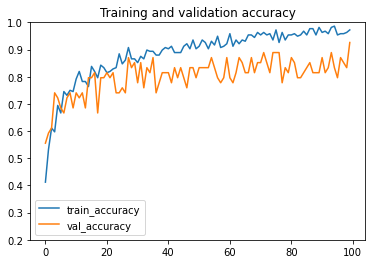

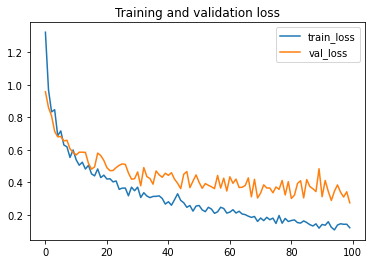

7/7 [==============================] - 1s 120ms/step - loss: 0.2962 - accuracy: 0.9074
{'loss': 0.2962222397327423, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
27/27 [==============================] - 9s 208ms/step - loss: 1.1365 - accuracy: 0.4213 - val_loss: 0.9395 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_2.h5
Epoch 2/100
27/27 [==============================] - 4s 158ms/step - loss: 0.9145 - accuracy: 0.5787 - val_loss: 0.8356 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.50000 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_2.h5
Epoch 3/100
27/27 [==============================] - 4s 158ms/step - loss: 0.7752 - accuracy: 0.6759 - val_loss: 0.7709 - val_accuracy: 0.6111

Epoch 00003: val_accuracy im

27/27 [==============================] - 4s 156ms/step - loss: 0.2669 - accuracy: 0.9213 - val_loss: 0.3868 - val_accuracy: 0.8519

Epoch 00037: val_accuracy did not improve from 0.88889
Epoch 38/100
27/27 [==============================] - 4s 156ms/step - loss: 0.2894 - accuracy: 0.8704 - val_loss: 0.3806 - val_accuracy: 0.8333

Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/100
27/27 [==============================] - 4s 156ms/step - loss: 0.2548 - accuracy: 0.9213 - val_loss: 0.4897 - val_accuracy: 0.7963

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/100
27/27 [==============================] - 4s 157ms/step - loss: 0.2618 - accuracy: 0.9028 - val_loss: 0.4130 - val_accuracy: 0.8519

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/100
27/27 [==============================] - 4s 161ms/step - loss: 0.3099 - accuracy: 0.8889 - val_loss: 0.2903 - val_accuracy: 0.8889

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/100


27/27 [==============================] - 4s 155ms/step - loss: 0.1204 - accuracy: 0.9769 - val_loss: 0.3450 - val_accuracy: 0.8148

Epoch 00078: val_accuracy did not improve from 0.88889
Epoch 79/100
27/27 [==============================] - 4s 157ms/step - loss: 0.1369 - accuracy: 0.9722 - val_loss: 0.2906 - val_accuracy: 0.8704

Epoch 00079: val_accuracy did not improve from 0.88889
Epoch 80/100
27/27 [==============================] - 4s 156ms/step - loss: 0.1650 - accuracy: 0.9630 - val_loss: 0.3542 - val_accuracy: 0.8148

Epoch 00080: val_accuracy did not improve from 0.88889
Epoch 81/100
27/27 [==============================] - 4s 157ms/step - loss: 0.1682 - accuracy: 0.9259 - val_loss: 0.3329 - val_accuracy: 0.8333

Epoch 00081: val_accuracy did not improve from 0.88889
Epoch 82/100
27/27 [==============================] - 4s 158ms/step - loss: 0.1555 - accuracy: 0.9352 - val_loss: 0.4166 - val_accuracy: 0.8333

Epoch 00082: val_accuracy did not improve from 0.88889
Epoch 83/100


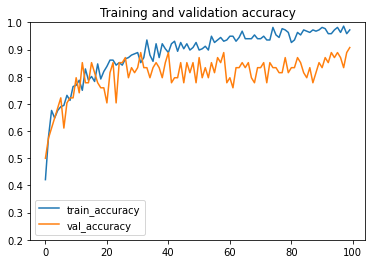

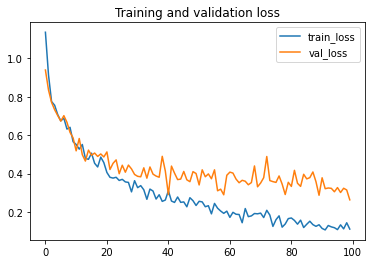

7/7 [==============================] - 1s 115ms/step - loss: 0.2813 - accuracy: 0.8889
{'loss': 0.281342089176178, 'accuracy': 0.8888888955116272}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
27/27 [==============================] - 8s 186ms/step - loss: 1.4236 - accuracy: 0.4352 - val_loss: 0.9859 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_3.h5
Epoch 2/100
27/27 [==============================] - 4s 151ms/step - loss: 0.9810 - accuracy: 0.5278 - val_loss: 0.8583 - val_accuracy: 0.6481

Epoch 00002: val_accuracy improved from 0.53704 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_3.h5
Epoch 3/100
27/27 [==============================] - 4s 157ms/step - loss: 0.9530 - accuracy: 0.5417 - val_loss: 0.7979 - val_accuracy: 0.7037

Epoch 00003: val_accuracy imp

27/27 [==============================] - 4s 154ms/step - loss: 0.3347 - accuracy: 0.8889 - val_loss: 0.3845 - val_accuracy: 0.8333

Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/100
27/27 [==============================] - 4s 153ms/step - loss: 0.3523 - accuracy: 0.8611 - val_loss: 0.3579 - val_accuracy: 0.8333

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
27/27 [==============================] - 4s 154ms/step - loss: 0.3074 - accuracy: 0.9120 - val_loss: 0.4027 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
27/27 [==============================] - 4s 152ms/step - loss: 0.3306 - accuracy: 0.8843 - val_loss: 0.4170 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
27/27 [==============================] - 4s 153ms/step - loss: 0.2866 - accuracy: 0.8935 - val_loss: 0.3490 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.87037
Epoch 43/100


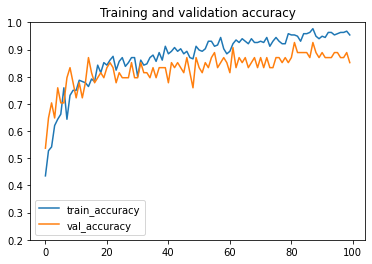

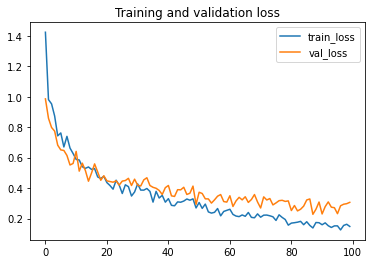

7/7 [==============================] - 1s 113ms/step - loss: 0.2650 - accuracy: 0.8704
{'loss': 0.26495787501335144, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
27/27 [==============================] - 9s 206ms/step - loss: 1.1468 - accuracy: 0.4907 - val_loss: 0.8438 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_4.h5
Epoch 2/100
27/27 [==============================] - 4s 145ms/step - loss: 0.9255 - accuracy: 0.5417 - val_loss: 0.7503 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.55556 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_4.h5
Epoch 3/100
27/27 [==============================] - 4s 161ms/step - loss: 0.8467 - accuracy: 0.5926 - val_loss: 0.6746 - val_accuracy: 0.6667

Epoch 00003: val_accuracy i

27/27 [==============================] - 4s 158ms/step - loss: 0.1489 - accuracy: 0.9537 - val_loss: 0.4967 - val_accuracy: 0.7778

Epoch 00078: val_accuracy did not improve from 0.81481
Epoch 79/100
27/27 [==============================] - 5s 172ms/step - loss: 0.1608 - accuracy: 0.9352 - val_loss: 0.5238 - val_accuracy: 0.7593

Epoch 00079: val_accuracy did not improve from 0.81481
Epoch 80/100
27/27 [==============================] - 5s 166ms/step - loss: 0.1415 - accuracy: 0.9630 - val_loss: 0.4298 - val_accuracy: 0.7963

Epoch 00080: val_accuracy did not improve from 0.81481
Epoch 81/100
27/27 [==============================] - 4s 158ms/step - loss: 0.1302 - accuracy: 0.9583 - val_loss: 0.4782 - val_accuracy: 0.7778

Epoch 00081: val_accuracy did not improve from 0.81481
Epoch 82/100
27/27 [==============================] - 4s 160ms/step - loss: 0.1137 - accuracy: 0.9769 - val_loss: 0.4717 - val_accuracy: 0.7963

Epoch 00082: val_accuracy did not improve from 0.81481
Epoch 83/100


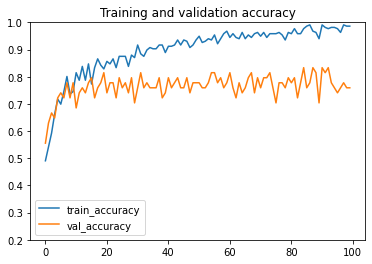

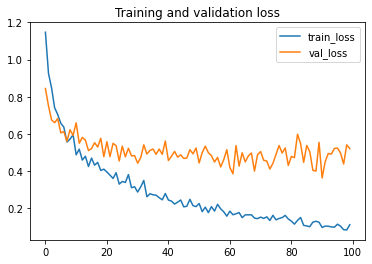

7/7 [==============================] - 1s 113ms/step - loss: 0.5410 - accuracy: 0.7593
{'loss': 0.5409644246101379, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
27/27 [==============================] - 9s 201ms/step - loss: 1.1283 - accuracy: 0.4722 - val_loss: 1.0303 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_5.h5
Epoch 2/100
27/27 [==============================] - 4s 143ms/step - loss: 0.9372 - accuracy: 0.5648 - val_loss: 0.9588 - val_accuracy: 0.4815

Epoch 00002: val_accuracy improved from 0.46296 to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_11\model_5.h5
Epoch 3/100
27/27 [==============================] - 4s 145ms/step - loss: 0.8250 - accuracy: 0.6250 - val_loss: 0.8587 - val_accuracy: 0.5741

Epoch 00003: val_accuracy im


Epoch 00035: val_accuracy did not improve from 0.88889
Epoch 36/100
27/27 [==============================] - 4s 157ms/step - loss: 0.2870 - accuracy: 0.9074 - val_loss: 0.3809 - val_accuracy: 0.8333

Epoch 00036: val_accuracy did not improve from 0.88889
Epoch 37/100
27/27 [==============================] - 4s 158ms/step - loss: 0.2699 - accuracy: 0.8796 - val_loss: 0.4169 - val_accuracy: 0.8333

Epoch 00037: val_accuracy did not improve from 0.88889
Epoch 38/100
27/27 [==============================] - 4s 158ms/step - loss: 0.2969 - accuracy: 0.8796 - val_loss: 0.4050 - val_accuracy: 0.7593

Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/100
27/27 [==============================] - 4s 156ms/step - loss: 0.3080 - accuracy: 0.8704 - val_loss: 0.4190 - val_accuracy: 0.8519

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/100
27/27 [==============================] - 4s 155ms/step - loss: 0.2629 - accuracy: 0.9120 - val_loss: 0.5151 - val_accuracy: 0.7593


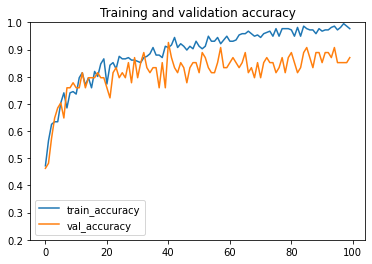

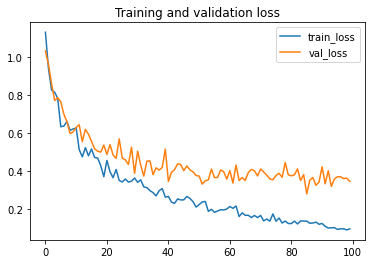

7/7 [==============================] - 1s 114ms/step - loss: 0.3885 - accuracy: 0.8519
{'loss': 0.3884616196155548, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
27/27 [==============================] - 8s 185ms/step - loss: 1.5001 - accuracy: 0.4120 - val_loss: 0.8444 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
27/27 [==============================] - 4s 148ms/step - loss: 1.0199 - accuracy: 0.5880 - val_loss: 0.7719 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.57407
Epoch 3/100
27/27 [==============================] - 4s 154ms/step - loss: 0.7998 - accuracy: 0.6343 - val_loss: 0.6722 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved from 0.57407 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_1.h5
Epoch 4/100
27/27 [==============================] - 4s 145ms/step - loss: 0.7076 - accuracy: 0.6991 - val_loss: 0.7168 - val_accuracy: 0.5741

Epoch 00004: val_accuracy did not improve from 0.61111
Epoch 5/100
27/27 [==============================] - 4s 158ms/step - loss: 0.6194 - accuracy: 0.7315 - val_loss: 0.5885 - val_accuracy: 0.7593

Epoch 00005: val_accuracy improved from 0.61111 to 0.75926, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_1.h5
Epoch 6/100
27/27 [==============================] -

Epoch 41/100
27/27 [==============================] - 5s 201ms/step - loss: 0.1102 - accuracy: 0.9815 - val_loss: 0.3758 - val_accuracy: 0.8704

Epoch 00041: val_accuracy did not improve from 0.90741
Epoch 42/100
27/27 [==============================] - 5s 166ms/step - loss: 0.1249 - accuracy: 0.9630 - val_loss: 0.3342 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.90741
Epoch 43/100
27/27 [==============================] - 4s 159ms/step - loss: 0.1306 - accuracy: 0.9398 - val_loss: 0.4069 - val_accuracy: 0.8704

Epoch 00043: val_accuracy did not improve from 0.90741
Epoch 44/100
27/27 [==============================] - 5s 167ms/step - loss: 0.1249 - accuracy: 0.9537 - val_loss: 0.3824 - val_accuracy: 0.8519

Epoch 00044: val_accuracy did not improve from 0.90741
Epoch 45/100
27/27 [==============================] - 4s 156ms/step - loss: 0.0829 - accuracy: 0.9861 - val_loss: 0.3586 - val_accuracy: 0.7963

Epoch 00045: val_accuracy did not improve from 0.90741


27/27 [==============================] - 5s 165ms/step - loss: 0.0533 - accuracy: 0.9907 - val_loss: 0.3653 - val_accuracy: 0.8519

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
27/27 [==============================] - 4s 162ms/step - loss: 0.0366 - accuracy: 0.9954 - val_loss: 0.4244 - val_accuracy: 0.8148

Epoch 00083: val_accuracy did not improve from 0.90741
Epoch 84/100
27/27 [==============================] - 4s 160ms/step - loss: 0.0237 - accuracy: 1.0000 - val_loss: 0.2911 - val_accuracy: 0.8519

Epoch 00084: val_accuracy did not improve from 0.90741
Epoch 85/100
27/27 [==============================] - 4s 161ms/step - loss: 0.0235 - accuracy: 1.0000 - val_loss: 0.3259 - val_accuracy: 0.8704

Epoch 00085: val_accuracy did not improve from 0.90741
Epoch 86/100
27/27 [==============================] - 4s 162ms/step - loss: 0.0241 - accuracy: 0.9954 - val_loss: 0.4159 - val_accuracy: 0.8519

Epoch 00086: val_accuracy did not improve from 0.90741
Epoch 87/100


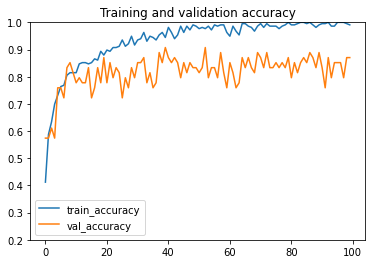

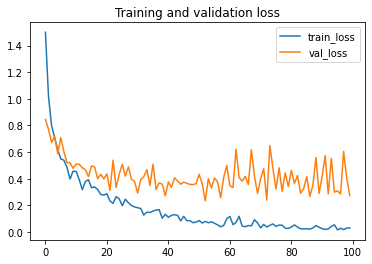

7/7 [==============================] - 1s 116ms/step - loss: 0.3677 - accuracy: 0.8704
{'loss': 0.36771562695503235, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
27/27 [==============================] - 8s 201ms/step - loss: 1.7684 - accuracy: 0.4537 - val_loss: 0.9873 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_2.h5
Epoch 2/100
27/27 [==============================] - 4s 134ms/step - loss: 0.9756 - accuracy: 0.5833 - val_loss: 0.6789 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.50000 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_2.h5
Epoch 3/100
27/27 [==============================] - 4s 143ms/step - loss: 0.6659 - accuracy: 0.6713 - val_loss: 0.5695 - val_accuracy: 0.6296

Epoch 00003: val_accuracy d


Epoch 00037: val_accuracy did not improve from 0.87037
Epoch 38/100
27/27 [==============================] - 4s 154ms/step - loss: 0.1786 - accuracy: 0.9398 - val_loss: 0.3460 - val_accuracy: 0.8148

Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/100
27/27 [==============================] - 4s 155ms/step - loss: 0.1266 - accuracy: 0.9722 - val_loss: 0.3559 - val_accuracy: 0.8519

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
27/27 [==============================] - 4s 154ms/step - loss: 0.1077 - accuracy: 0.9907 - val_loss: 0.3367 - val_accuracy: 0.8519

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
27/27 [==============================] - 4s 154ms/step - loss: 0.1045 - accuracy: 0.9722 - val_loss: 0.2958 - val_accuracy: 0.8704

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
27/27 [==============================] - 4s 155ms/step - loss: 0.1259 - accuracy: 0.9583 - val_loss: 0.3238 - val_accuracy: 0.8704


27/27 [==============================] - 4s 155ms/step - loss: 0.0363 - accuracy: 0.9954 - val_loss: 0.3225 - val_accuracy: 0.9074

Epoch 00078: val_accuracy did not improve from 0.90741
Epoch 79/100
27/27 [==============================] - 4s 156ms/step - loss: 0.0791 - accuracy: 0.9815 - val_loss: 0.3901 - val_accuracy: 0.8333

Epoch 00079: val_accuracy did not improve from 0.90741
Epoch 80/100
27/27 [==============================] - 4s 156ms/step - loss: 0.0487 - accuracy: 0.9861 - val_loss: 0.4089 - val_accuracy: 0.8519

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
27/27 [==============================] - 4s 155ms/step - loss: 0.0319 - accuracy: 0.9954 - val_loss: 0.4009 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
27/27 [==============================] - 4s 155ms/step - loss: 0.0281 - accuracy: 0.9954 - val_loss: 0.4012 - val_accuracy: 0.8704

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100


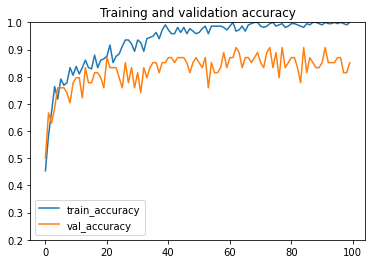

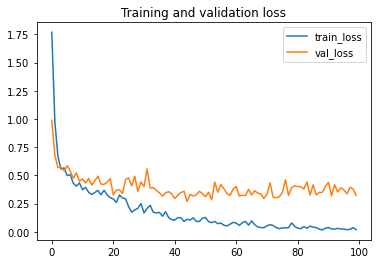

7/7 [==============================] - 1s 107ms/step - loss: 0.4292 - accuracy: 0.8333
{'loss': 0.42924806475639343, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
27/27 [==============================] - 8s 202ms/step - loss: 1.7042 - accuracy: 0.4676 - val_loss: 0.6179 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_3.h5
Epoch 2/100
27/27 [==============================] - 5s 177ms/step - loss: 0.8842 - accuracy: 0.6435 - val_loss: 0.6929 - val_accuracy: 0.6296

Epoch 00002: val_accuracy did not improve from 0.68519
Epoch 3/100
27/27 [==============================] - 5s 168ms/step - loss: 0.7318 - accuracy: 0.6991 - val_loss: 0.5654 - val_accuracy: 0.7222

Epoch 00003: val_accuracy improved from 0.68519 to 0.72222, saving model to C:/Users/user/Desktop/Model

27/27 [==============================] - 4s 159ms/step - loss: 0.1322 - accuracy: 0.9583 - val_loss: 0.1957 - val_accuracy: 0.8704

Epoch 00038: val_accuracy did not improve from 0.92593
Epoch 39/100
27/27 [==============================] - 4s 156ms/step - loss: 0.1251 - accuracy: 0.9491 - val_loss: 0.2803 - val_accuracy: 0.8889

Epoch 00039: val_accuracy did not improve from 0.92593
Epoch 40/100
27/27 [==============================] - 5s 165ms/step - loss: 0.1061 - accuracy: 0.9722 - val_loss: 0.2414 - val_accuracy: 0.8889

Epoch 00040: val_accuracy did not improve from 0.92593
Epoch 41/100
27/27 [==============================] - 5s 171ms/step - loss: 0.1462 - accuracy: 0.9491 - val_loss: 0.2433 - val_accuracy: 0.9259

Epoch 00041: val_accuracy did not improve from 0.92593
Epoch 42/100
27/27 [==============================] - 4s 159ms/step - loss: 0.1486 - accuracy: 0.9491 - val_loss: 0.3638 - val_accuracy: 0.8148

Epoch 00042: val_accuracy did not improve from 0.92593
Epoch 43/100



Epoch 00078: val_accuracy improved from 0.94444 to 0.96296, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_3.h5
Epoch 79/100
27/27 [==============================] - 4s 156ms/step - loss: 0.0254 - accuracy: 1.0000 - val_loss: 0.2381 - val_accuracy: 0.8704

Epoch 00079: val_accuracy did not improve from 0.96296
Epoch 80/100
27/27 [==============================] - 4s 149ms/step - loss: 0.0384 - accuracy: 0.9907 - val_loss: 0.2283 - val_accuracy: 0.9074

Epoch 00080: val_accuracy did not improve from 0.96296
Epoch 81/100
27/27 [==============================] - 5s 171ms/step - loss: 0.0500 - accuracy: 0.9722 - val_loss: 0.4227 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.96296
Epoch 82/100
27/27 [==============================] - 4s 154ms/step - loss: 0.0542 - accuracy: 0.9907 - val_loss: 0.1436 - val_accuracy: 0.9444

Epoch 00082: val_accuracy did not improve from 0.96296
Epoch 83/100
27/27 [==============================] - 5s 167ms/step 

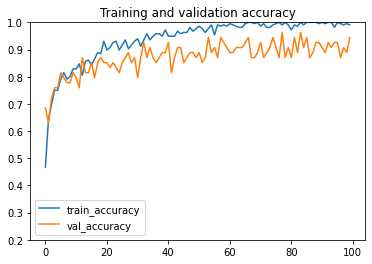

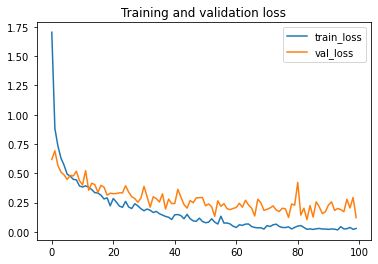

7/7 [==============================] - 1s 106ms/step - loss: 0.1655 - accuracy: 0.9444
{'loss': 0.16552717983722687, 'accuracy': 0.9444444179534912}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
27/27 [==============================] - 10s 230ms/step - loss: 1.7676 - accuracy: 0.4769 - val_loss: 0.6949 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_4.h5
Epoch 2/100
27/27 [==============================] - 5s 165ms/step - loss: 1.0305 - accuracy: 0.6157 - val_loss: 0.7216 - val_accuracy: 0.6296

Epoch 00002: val_accuracy did not improve from 0.68519
Epoch 3/100
27/27 [==============================] - 4s 154ms/step - loss: 0.6887 - accuracy: 0.6944 - val_loss: 0.4940 - val_accuracy: 0.8148

Epoch 00003: val_accuracy improved from 0.68519 to 0.81481, saving model to C:/Users/user/Desktop/Mode


Epoch 00079: val_accuracy did not improve from 0.85185
Epoch 80/100
27/27 [==============================] - 4s 161ms/step - loss: 0.0235 - accuracy: 0.9907 - val_loss: 0.5652 - val_accuracy: 0.8333

Epoch 00080: val_accuracy did not improve from 0.85185
Epoch 81/100
27/27 [==============================] - 4s 158ms/step - loss: 0.0358 - accuracy: 1.0000 - val_loss: 0.3845 - val_accuracy: 0.8704

Epoch 00081: val_accuracy improved from 0.85185 to 0.87037, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_4.h5
Epoch 82/100
27/27 [==============================] - 4s 159ms/step - loss: 0.0399 - accuracy: 0.9907 - val_loss: 0.6010 - val_accuracy: 0.7778

Epoch 00082: val_accuracy did not improve from 0.87037
Epoch 83/100
27/27 [==============================] - 4s 158ms/step - loss: 0.0183 - accuracy: 1.0000 - val_loss: 0.4893 - val_accuracy: 0.8148

Epoch 00083: val_accuracy did not improve from 0.87037
Epoch 84/100
27/27 [==============================] - 4s 162ms/step 

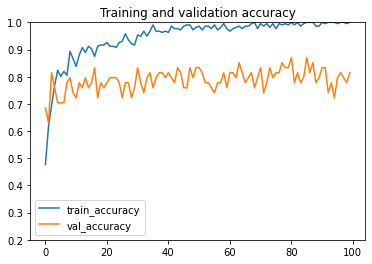

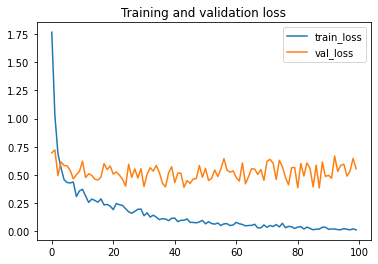

7/7 [==============================] - 1s 115ms/step - loss: 0.3264 - accuracy: 0.8519
{'loss': 0.3264366388320923, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
27/27 [==============================] - 8s 198ms/step - loss: 1.4034 - accuracy: 0.5000 - val_loss: 0.9829 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_5.h5
Epoch 2/100
27/27 [==============================] - 4s 160ms/step - loss: 0.8927 - accuracy: 0.6389 - val_loss: 0.6277 - val_accuracy: 0.7037

Epoch 00002: val_accuracy improved from 0.61111 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_12\model_5.h5
Epoch 3/100
27/27 [==============================] - 4s 148ms/step - loss: 0.6398 - accuracy: 0.7037 - val_loss: 0.4793 - val_accuracy: 0.8148

Epoch 00003: val_accuracy im


Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/100
27/27 [==============================] - 4s 156ms/step - loss: 0.0878 - accuracy: 0.9769 - val_loss: 0.3809 - val_accuracy: 0.8889

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/100
27/27 [==============================] - 4s 156ms/step - loss: 0.0777 - accuracy: 0.9769 - val_loss: 0.4276 - val_accuracy: 0.8704

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/100
27/27 [==============================] - 4s 155ms/step - loss: 0.0899 - accuracy: 0.9676 - val_loss: 0.3520 - val_accuracy: 0.8333

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/100
27/27 [==============================] - 4s 155ms/step - loss: 0.0676 - accuracy: 0.9907 - val_loss: 0.4041 - val_accuracy: 0.8148

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/100
27/27 [==============================] - 4s 158ms/step - loss: 0.1169 - accuracy: 0.9398 - val_loss: 0.4346 - val_accuracy: 0.8333


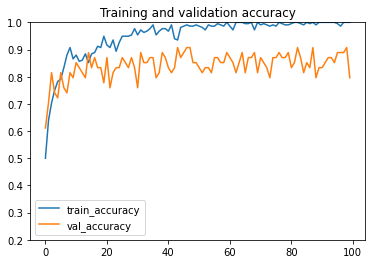

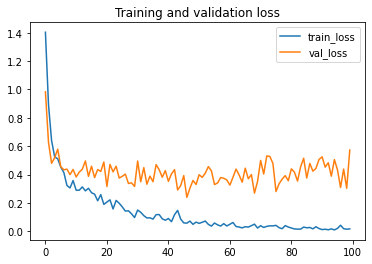

7/7 [==============================] - 1s 112ms/step - loss: 0.3369 - accuracy: 0.8704
{'loss': 0.33689096570014954, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
14/14 [==============================] - 10s 389ms/step - loss: 1.2562 - accuracy: 0.3565 - val_loss: 0.9772 - val_accuracy: 0.4074

Epoch 00001: val_accuracy improved from -inf to 0.40741, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
14/14 [==============================] - 4s 269ms/step - loss: 0.9750 - accuracy: 0.4907 - val_loss: 0.8530 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.40741 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_1.h5
Epoch 3/20
14/14 [==============================] - 4s 297ms/step - loss: 0.8795 - accuracy: 0.5741 - val_loss: 0.8419 - val_accuracy: 0.6667

Epoch 00003: val_accuracy did not improve from 0.66667
Epoch 4/20
14/14 [==============================] - 4s 304ms/step - loss: 0.8357 - accuracy: 0.5926 - val_loss: 0.8397 - val_accuracy: 0.6667

Epoch 00004: val_accuracy did not improve from 0.66667
Epoch 5/20
14/14 [==============================] - 4s 303ms/step - loss: 0.8023 - accuracy: 0.6343 - val_loss: 0.7952 - val_accuracy: 0.6481

Epoch 00005: val_accuracy did not improve from 0.66667
Epoch 6/20
14/14 [==============================] - 4s 308ms/step - loss: 0.7681 - accuracy: 0.6481 - val_loss: 0.7573 - val_accurac

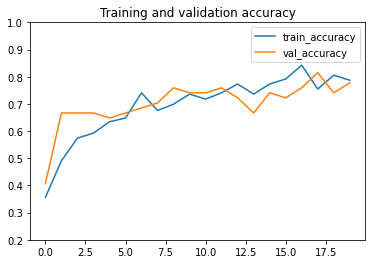

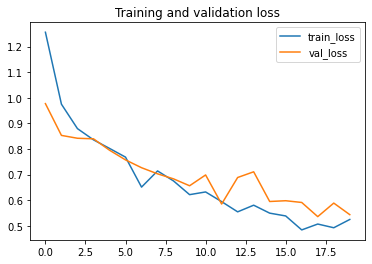

4/4 [==============================] - 1s 158ms/step - loss: 0.6174 - accuracy: 0.7407
{'loss': 0.617360532283783, 'accuracy': 0.7407407164573669}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
14/14 [==============================] - 9s 403ms/step - loss: 1.2545 - accuracy: 0.4444 - val_loss: 1.0277 - val_accuracy: 0.4259

Epoch 00001: val_accuracy improved from -inf to 0.42593, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_2.h5
Epoch 2/20
14/14 [==============================] - 4s 275ms/step - loss: 0.9298 - accuracy: 0.5602 - val_loss: 0.9016 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.42593 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_2.h5
Epoch 3/20
14/14 [==============================] - 4s 254ms/step - loss: 0.8864 - accuracy: 0.6157 - val_loss: 0.8902 - val_accuracy: 0.5556.9229 - accu

Epoch 00003: val_acc

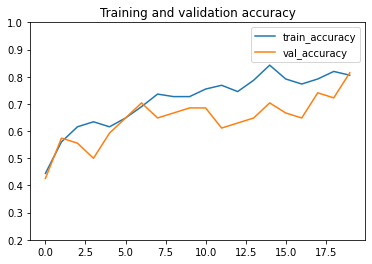

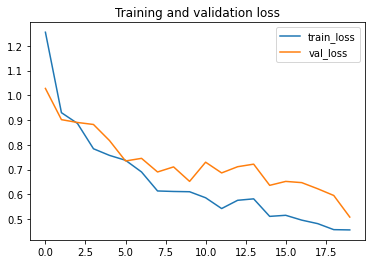

4/4 [==============================] - 1s 186ms/step - loss: 0.5872 - accuracy: 0.7593
{'loss': 0.5872409343719482, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
14/14 [==============================] - 9s 420ms/step - loss: 1.3706 - accuracy: 0.3380 - val_loss: 1.0659 - val_accuracy: 0.4259

Epoch 00001: val_accuracy improved from -inf to 0.42593, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_3.h5
Epoch 2/20
14/14 [==============================] - 4s 288ms/step - loss: 1.0981 - accuracy: 0.4815 - val_loss: 0.8763 - val_accuracy: 0.5556

Epoch 00002: val_accuracy improved from 0.42593 to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_3.h5
Epoch 3/20
14/14 [==============================] - 4s 264ms/step - loss: 1.0002 - accuracy: 0.5231 - val_loss: 0.7920 - val_accuracy: 0.6852

Epoch 00003: val_accuracy impro

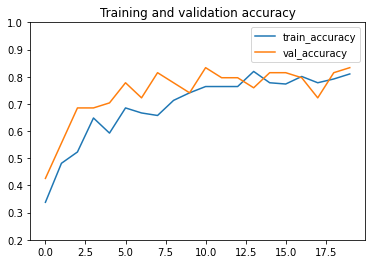

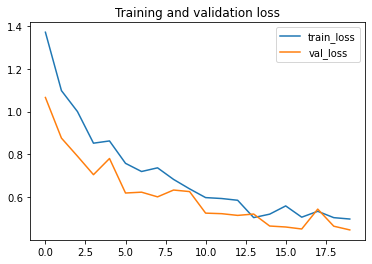

4/4 [==============================] - 1s 167ms/step - loss: 0.5281 - accuracy: 0.7963
{'loss': 0.5280835032463074, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
14/14 [==============================] - 8s 369ms/step - loss: 1.2676 - accuracy: 0.3981 - val_loss: 0.9866 - val_accuracy: 0.5926

Epoch 00001: val_accuracy improved from -inf to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_4.h5
Epoch 2/20
14/14 [==============================] - 4s 289ms/step - loss: 1.1254 - accuracy: 0.4537 - val_loss: 0.8433 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.59259 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_4.h5
Epoch 3/20
14/14 [==============================] - 4s 287ms/step - loss: 1.0156 - accuracy: 0.5231 - val_loss: 0.8726 - val_accuracy: 0.5926

Epoch 00003: val_accuracy did n

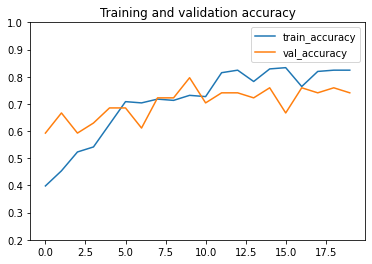

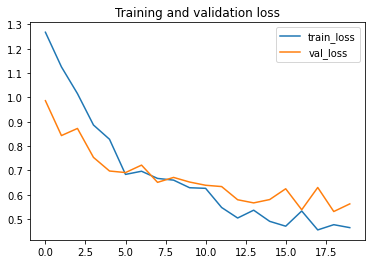

4/4 [==============================] - 1s 172ms/step - loss: 0.6648 - accuracy: 0.7593
{'loss': 0.6648348569869995, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
14/14 [==============================] - 8s 367ms/step - loss: 1.1863 - accuracy: 0.4491 - val_loss: 1.0185 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_5.h5
Epoch 2/20
14/14 [==============================] - 4s 285ms/step - loss: 0.9773 - accuracy: 0.5046 - val_loss: 0.8772 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.46296 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_13\model_5.h5
Epoch 3/20
14/14 [==============================] - 3s 243ms/step - loss: 0.8783 - accuracy: 0.6157 - val_loss: 0.8718 - val_accuracy: 0.6296

Epoch 00003: val_accuracy impro

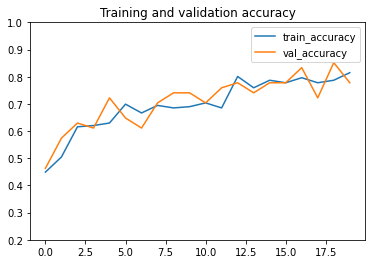

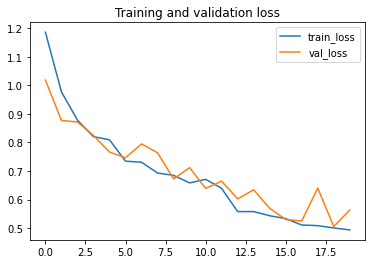

4/4 [==============================] - 1s 177ms/step - loss: 0.5887 - accuracy: 0.8148
{'loss': 0.588659405708313, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
14/14 [==============================] - 8s 375ms/step - loss: 1.5128 - accuracy: 0.4815 - val_loss: 0.8950 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
14/14 [==============================] - 3s 241ms/step - loss: 0.8310 - accuracy: 0.6389 - val_loss: 0.7334 - val_accuracy: 0.6111

Epoch 00002: val_accuracy did not improve from 0.61111
Epoch 3/20
14/14 [==============================] - 4s 294ms/step - loss: 0.7064 - accuracy: 0.7176 - val_loss: 0.6722 - val_accuracy: 0.7407

Epoch 00003: val_accuracy improved from 0.61111 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_1.h5
Epoch 4/20
14/14 [==============================] - 4s 255ms/step - loss: 0.6065 - accuracy: 0.7500 - val_loss: 0.7640 - val_accuracy: 0.6667

Epoch 00004: val_accuracy did not improve from 0.74074
Epoch 5/20
14/14 [==============================] - 3s 236ms/step - loss: 0.4950 - accuracy: 0.7824 - val_loss: 0.5570 - val_accuracy: 0.7963

Epoch 00005: val_accuracy improved from 0.74074 to 0.79630, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_1.h5
Epoch 6/20
14/14 [==============================] - 4s 2

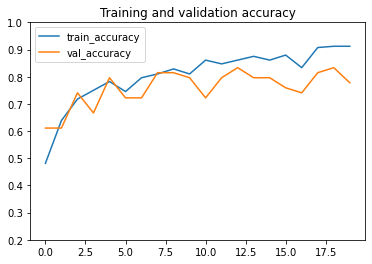

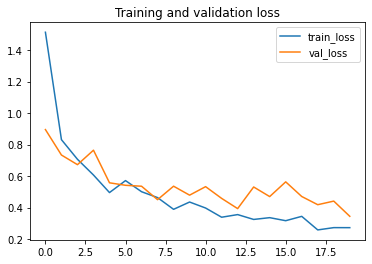

4/4 [==============================] - 1s 172ms/step - loss: 0.4697 - accuracy: 0.7963
{'loss': 0.469669908285141, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
14/14 [==============================] - 8s 360ms/step - loss: 1.5479 - accuracy: 0.4676 - val_loss: 1.0205 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_2.h5
Epoch 2/20
14/14 [==============================] - 4s 248ms/step - loss: 0.8801 - accuracy: 0.6019 - val_loss: 0.6733 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.53704 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_2.h5
Epoch 3/20
14/14 [==============================] - 4s 244ms/step - loss: 0.7333 - accuracy: 0.6759 - val_loss: 0.6300 - val_accuracy: 0.6667

Epoch 00003: val_accuracy did no

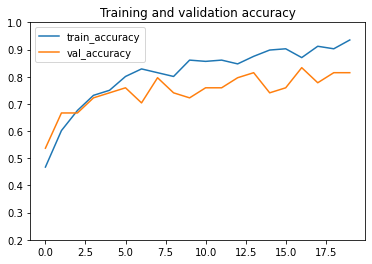

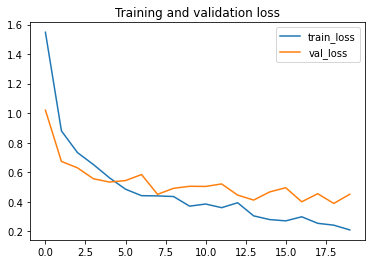

4/4 [==============================] - 1s 189ms/step - loss: 0.4583 - accuracy: 0.7963
{'loss': 0.4582653045654297, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
14/14 [==============================] - 7s 325ms/step - loss: 1.3362 - accuracy: 0.4815 - val_loss: 0.7512 - val_accuracy: 0.6667

Epoch 00001: val_accuracy improved from -inf to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_3.h5
Epoch 2/20
14/14 [==============================] - 4s 248ms/step - loss: 0.8581 - accuracy: 0.6065 - val_loss: 0.5153 - val_accuracy: 0.7963

Epoch 00002: val_accuracy improved from 0.66667 to 0.79630, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_3.h5
Epoch 3/20
14/14 [==============================] - 4s 262ms/step - loss: 0.6712 - accuracy: 0.6991 - val_loss: 0.4958 - val_accuracy: 0.8148

Epoch 00003: val_accuracy impro

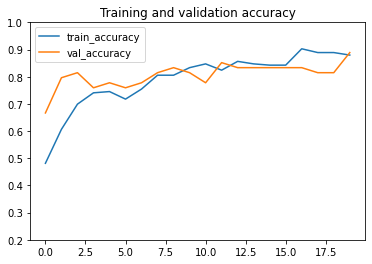

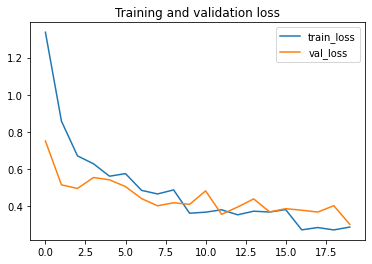

4/4 [==============================] - 1s 172ms/step - loss: 0.3154 - accuracy: 0.8519
{'loss': 0.3153829276561737, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
14/14 [==============================] - 8s 396ms/step - loss: 1.6305 - accuracy: 0.4630 - val_loss: 0.8016 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_4.h5
Epoch 2/20
14/14 [==============================] - 3s 242ms/step - loss: 0.9666 - accuracy: 0.5741 - val_loss: 0.6409 - val_accuracy: 0.7037

Epoch 00002: val_accuracy improved from 0.68519 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_4.h5
Epoch 3/20
14/14 [==============================] - 4s 305ms/step - loss: 0.7750 - accuracy: 0.6481 - val_loss: 0.6269 - val_accuracy: 0.7963

Epoch 00003: val_accuracy impro

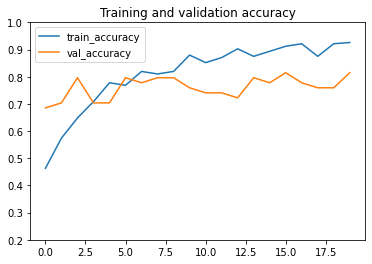

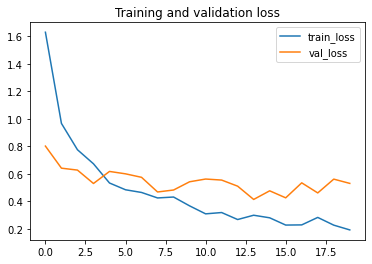

4/4 [==============================] - 1s 171ms/step - loss: 0.5533 - accuracy: 0.7593
{'loss': 0.5532792806625366, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
14/14 [==============================] - 7s 330ms/step - loss: 1.9747 - accuracy: 0.4167 - val_loss: 0.8250 - val_accuracy: 0.6296

Epoch 00001: val_accuracy improved from -inf to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_5.h5
Epoch 2/20
14/14 [==============================] - 4s 295ms/step - loss: 0.9460 - accuracy: 0.5972 - val_loss: 0.7946 - val_accuracy: 0.6852

Epoch 00002: val_accuracy improved from 0.62963 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_14\model_5.h5
Epoch 3/20
14/14 [==============================] - 3s 232ms/step - loss: 0.8152 - accuracy: 0.6111 - val_loss: 0.6688 - val_accuracy: 0.7222

Epoch 00003: val_accuracy impro

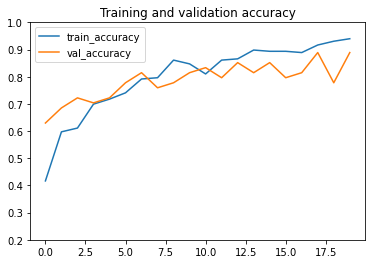

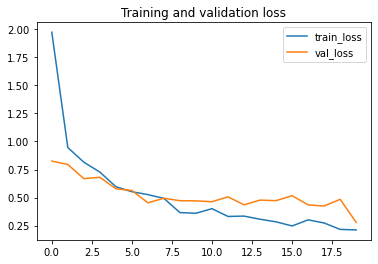

4/4 [==============================] - 1s 208ms/step - loss: 0.3948 - accuracy: 0.8704
{'loss': 0.3948105573654175, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
14/14 [==============================] - 8s 376ms/step - loss: 1.2666 - accuracy: 0.3750 - val_loss: 0.9465 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
14/14 [==============================] - 3s 232ms/step - loss: 0.9368 - accuracy: 0.5694 - val_loss: 0.8515 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.53704 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_1.h5
Epoch 3/50
14/14 [==============================] - 3s 242ms/step - loss: 0.9087 - accuracy: 0.5648 - val_loss: 0.8610 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved from 0.57407 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_1.h5
Epoch 4/50
14/14 [==============================] - 4s 258ms/step - loss: 0.7965 - accuracy: 0.6435 - val_loss: 0.8547 - val_accuracy: 0.5370

Epoch 00004: val_accuracy did not improve from 0.61111
Epoch 5/50
14/14 [==============================] - 4s 286ms/step - loss: 0.7944 - accuracy: 0.6435 - val_loss: 0.7663 - val_accuracy: 0.6111

Epoch 00005: val_accuracy did not improve from 0.61111
Epoch 6/50
14/14 [==============================] - 4s 2

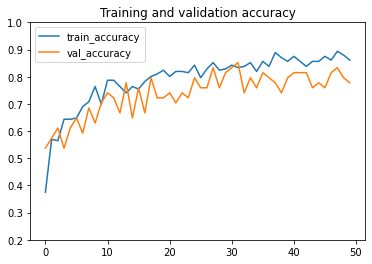

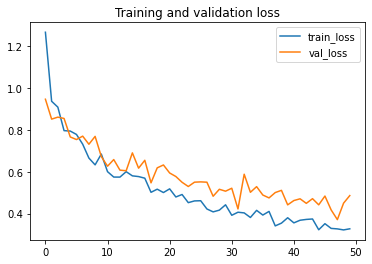

4/4 [==============================] - 1s 147ms/step - loss: 0.4422 - accuracy: 0.8704
{'loss': 0.4422306716442108, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
14/14 [==============================] - 8s 368ms/step - loss: 1.3798 - accuracy: 0.4120 - val_loss: 0.9054 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_2.h5
Epoch 2/50
14/14 [==============================] - 4s 252ms/step - loss: 1.1132 - accuracy: 0.4537 - val_loss: 0.8186 - val_accuracy: 0.6481

Epoch 00002: val_accuracy improved from 0.55556 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_2.h5
Epoch 3/50
14/14 [==============================] - 5s 316ms/step - loss: 0.9905 - accuracy: 0.5324 - val_loss: 0.8420 - val_accuracy: 0.5926

Epoch 00003: val_accuracy did n

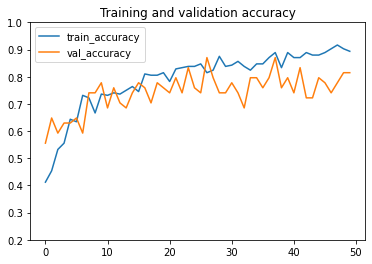

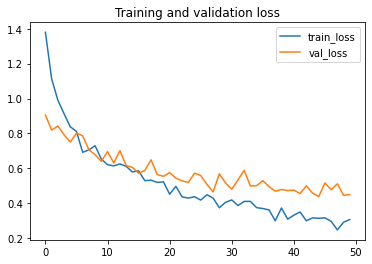

4/4 [==============================] - 1s 172ms/step - loss: 0.5197 - accuracy: 0.7778
{'loss': 0.5196788311004639, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
14/14 [==============================] - 8s 358ms/step - loss: 1.1020 - accuracy: 0.5139 - val_loss: 0.9551 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_3.h5
Epoch 2/50
14/14 [==============================] - 4s 285ms/step - loss: 0.9350 - accuracy: 0.5741 - val_loss: 0.7189 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.57407
Epoch 3/50
14/14 [==============================] - 4s 286ms/step - loss: 0.8367 - accuracy: 0.6667 - val_loss: 0.6979 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved from 0.57407 to 0.68519, saving model to C:/Users/user/Desktop/Model/sav

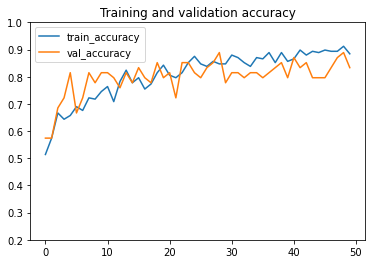

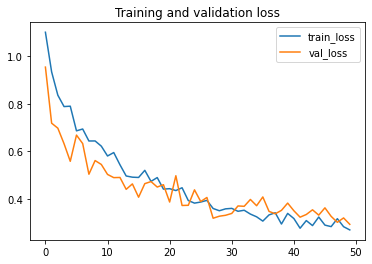

4/4 [==============================] - 1s 175ms/step - loss: 0.4035 - accuracy: 0.8148
{'loss': 0.4035112261772156, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
14/14 [==============================] - 8s 386ms/step - loss: 1.3066 - accuracy: 0.3889 - val_loss: 0.9083 - val_accuracy: 0.5926

Epoch 00001: val_accuracy improved from -inf to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_4.h5
Epoch 2/50
14/14 [==============================] - 4s 292ms/step - loss: 1.0073 - accuracy: 0.5000 - val_loss: 0.8333 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.59259 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_4.h5
Epoch 3/50
14/14 [==============================] - 4s 285ms/step - loss: 0.9029 - accuracy: 0.5648 - val_loss: 0.7614 - val_accuracy: 0.7037

Epoch 00003: val_accuracy impro

14/14 [==============================] - 4s 291ms/step - loss: 0.3353 - accuracy: 0.8750 - val_loss: 0.4652 - val_accuracy: 0.7963

Epoch 00039: val_accuracy did not improve from 0.81481
Epoch 40/50
14/14 [==============================] - 4s 264ms/step - loss: 0.3308 - accuracy: 0.8750 - val_loss: 0.4639 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.81481
Epoch 41/50
14/14 [==============================] - 4s 251ms/step - loss: 0.3175 - accuracy: 0.9028 - val_loss: 0.4998 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.81481
Epoch 42/50
14/14 [==============================] - 4s 284ms/step - loss: 0.3472 - accuracy: 0.8657 - val_loss: 0.4838 - val_accuracy: 0.7778

Epoch 00042: val_accuracy did not improve from 0.81481
Epoch 43/50
14/14 [==============================] - 4s 242ms/step - loss: 0.3015 - accuracy: 0.8981 - val_loss: 0.5054 - val_accuracy: 0.7593

Epoch 00043: val_accuracy did not improve from 0.81481
Epoch 44/50
14/14

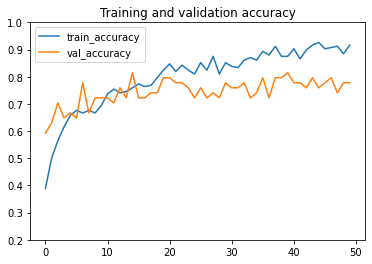

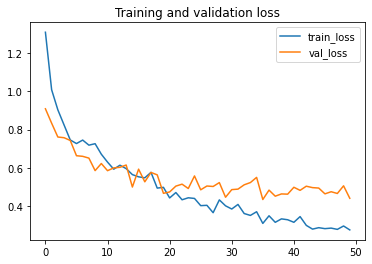

4/4 [==============================] - 1s 175ms/step - loss: 0.5580 - accuracy: 0.7407
{'loss': 0.5579564571380615, 'accuracy': 0.7407407164573669}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
14/14 [==============================] - 7s 302ms/step - loss: 1.4145 - accuracy: 0.2963 - val_loss: 1.0836 - val_accuracy: 0.4074

Epoch 00001: val_accuracy improved from -inf to 0.40741, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_5.h5
Epoch 2/50
14/14 [==============================] - 3s 230ms/step - loss: 0.9983 - accuracy: 0.5139 - val_loss: 0.9693 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.40741 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_15\model_5.h5
Epoch 3/50
14/14 [==============================] - 3s 233ms/step - loss: 0.9796 - accuracy: 0.5278 - val_loss: 0.8433 - val_accuracy: 0.6481

Epoch 00003: val_accuracy impro

14/14 [==============================] - 4s 277ms/step - loss: 0.4058 - accuracy: 0.8148 - val_loss: 0.4437 - val_accuracy: 0.8333

Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/50
14/14 [==============================] - 4s 282ms/step - loss: 0.3289 - accuracy: 0.8843 - val_loss: 0.4516 - val_accuracy: 0.8333

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/50
14/14 [==============================] - 4s 281ms/step - loss: 0.3378 - accuracy: 0.8519 - val_loss: 0.4569 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/50
14/14 [==============================] - 4s 285ms/step - loss: 0.3229 - accuracy: 0.8704 - val_loss: 0.4059 - val_accuracy: 0.8704

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/50
14/14 [==============================] - 4s 282ms/step - loss: 0.3087 - accuracy: 0.8750 - val_loss: 0.5023 - val_accuracy: 0.8148

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/50
14/14

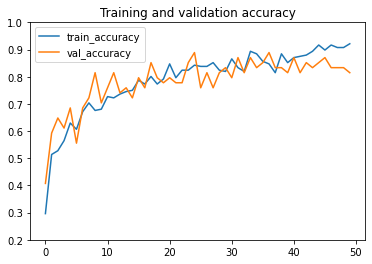

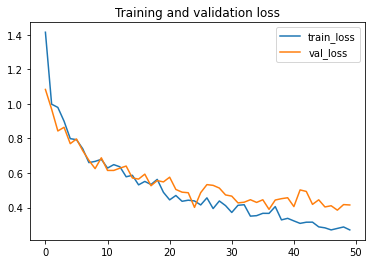

4/4 [==============================] - 1s 161ms/step - loss: 0.4610 - accuracy: 0.7963
{'loss': 0.46095970273017883, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
14/14 [==============================] - 7s 317ms/step - loss: 1.1527 - accuracy: 0.4815 - val_loss: 0.8429 - val_accuracy: 0.7037

Epoch 00001: val_accuracy improved from -inf to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
14/14 [==============================] - 4s 271ms/step - loss: 0.9989 - accuracy: 0.5556 - val_loss: 0.8024 - val_accuracy: 0.6481

Epoch 00002: val_accuracy did not improve from 0.70370
Epoch 3/50
14/14 [==============================] - 3s 229ms/step - loss: 0.7828 - accuracy: 0.6667 - val_loss: 0.7795 - val_accuracy: 0.5926

Epoch 00003: val_accuracy did not improve from 0.70370
Epoch 4/50
14/14 [==============================] - 4s 267ms/step - loss: 0.6452 - accuracy: 0.7130 - val_loss: 0.6293 - val_accuracy: 0.6667

Epoch 00004: val_accuracy did not improve from 0.70370
Epoch 5/50
14/14 [==============================] - 4s 257ms/step - loss: 0.6465 - accuracy: 0.7269 - val_loss: 0.7734 - val_accuracy: 0.6296

Epoch 00005: val_accuracy did not improve from 0.70370
Epoch 6/50
14/14 [==============================] - 4s 278ms/step - loss: 0.6346 - accuracy: 0.7269 - val_loss: 0.5923 - val_accuracy: 0.6852

Epoch 00006: val_accuracy did not improve from 0.70370
Epoch 7/50

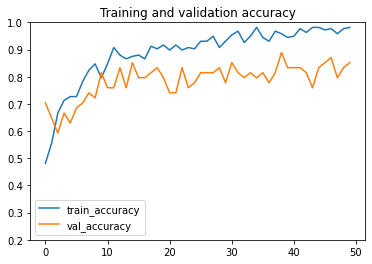

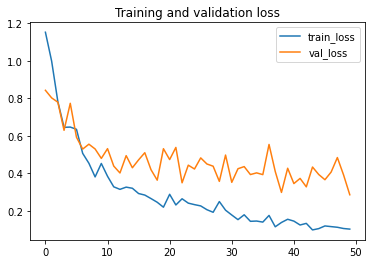

4/4 [==============================] - 1s 171ms/step - loss: 0.3697 - accuracy: 0.8148
{'loss': 0.36972057819366455, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
14/14 [==============================] - 8s 382ms/step - loss: 1.3081 - accuracy: 0.5370 - val_loss: 1.2280 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_2.h5
Epoch 2/50
14/14 [==============================] - 3s 230ms/step - loss: 0.9426 - accuracy: 0.6111 - val_loss: 0.6773 - val_accuracy: 0.7593

Epoch 00002: val_accuracy improved from 0.50000 to 0.75926, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_2.h5
Epoch 3/50
14/14 [==============================] - 4s 241ms/step - loss: 0.8298 - accuracy: 0.6065 - val_loss: 0.5799 - val_accuracy: 0.7222

Epoch 00003: val_accuracy did 

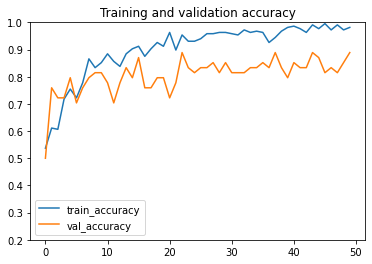

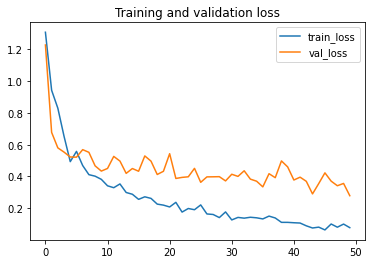

4/4 [==============================] - 1s 173ms/step - loss: 0.3749 - accuracy: 0.8519
{'loss': 0.3749137222766876, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
14/14 [==============================] - 8s 380ms/step - loss: 1.8227 - accuracy: 0.3750 - val_loss: 0.8570 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_3.h5
Epoch 2/50
14/14 [==============================] - 4s 273ms/step - loss: 1.0042 - accuracy: 0.5463 - val_loss: 0.6238 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.61111 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_3.h5
Epoch 3/50
14/14 [==============================] - 4s 268ms/step - loss: 0.8452 - accuracy: 0.6343 - val_loss: 0.5724 - val_accuracy: 0.7407

Epoch 00003: val_accuracy did n

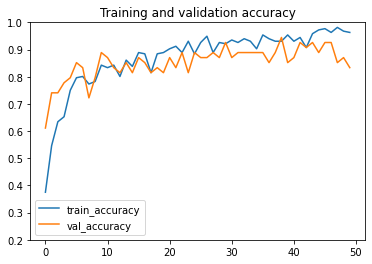

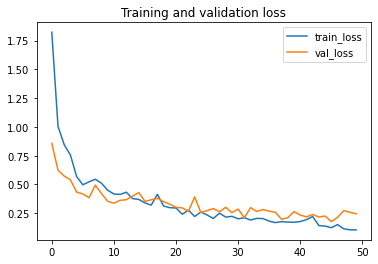

4/4 [==============================] - 1s 142ms/step - loss: 0.2455 - accuracy: 0.8704
{'loss': 0.24550727009773254, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
14/14 [==============================] - 7s 355ms/step - loss: 1.7721 - accuracy: 0.4306 - val_loss: 0.9185 - val_accuracy: 0.6667

Epoch 00001: val_accuracy improved from -inf to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_4.h5
Epoch 2/50
14/14 [==============================] - 4s 280ms/step - loss: 1.0231 - accuracy: 0.5972 - val_loss: 0.7193 - val_accuracy: 0.6667

Epoch 00002: val_accuracy did not improve from 0.66667
Epoch 3/50
14/14 [==============================] - 4s 278ms/step - loss: 0.7724 - accuracy: 0.6481 - val_loss: 0.7468 - val_accuracy: 0.7407

Epoch 00003: val_accuracy improved from 0.66667 to 0.74074, saving model to C:/Users/user/Desktop/Model/sa

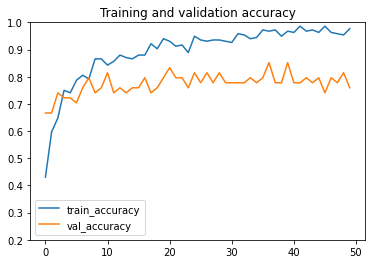

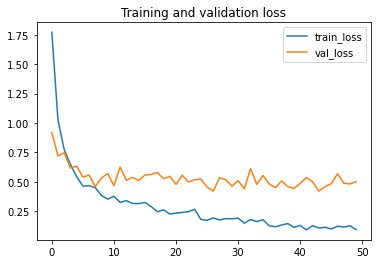

4/4 [==============================] - 1s 142ms/step - loss: 0.5141 - accuracy: 0.7407
{'loss': 0.5141252875328064, 'accuracy': 0.7407407164573669}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
14/14 [==============================] - 7s 302ms/step - loss: 1.4899 - accuracy: 0.4398 - val_loss: 0.9544 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_5.h5
Epoch 2/50
14/14 [==============================] - 4s 250ms/step - loss: 0.8778 - accuracy: 0.6204 - val_loss: 0.7222 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.55556 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_5.h5
Epoch 3/50
14/14 [==============================] - 4s 279ms/step - loss: 0.7115 - accuracy: 0.6991 - val_loss: 0.6933 - val_accuracy: 0.6481

Epoch 00003: val_accuracy did n


Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/50
14/14 [==============================] - 4s 280ms/step - loss: 0.0936 - accuracy: 0.9815 - val_loss: 0.4416 - val_accuracy: 0.8333

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/50
14/14 [==============================] - 4s 273ms/step - loss: 0.1230 - accuracy: 0.9491 - val_loss: 0.3331 - val_accuracy: 0.8704

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/50
14/14 [==============================] - 4s 274ms/step - loss: 0.1117 - accuracy: 0.9815 - val_loss: 0.4712 - val_accuracy: 0.8519

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/50
14/14 [==============================] - 4s 285ms/step - loss: 0.1110 - accuracy: 0.9722 - val_loss: 0.2929 - val_accuracy: 0.9074

Epoch 00042: val_accuracy improved from 0.88889 to 0.90741, saving model to C:/Users/user/Desktop/Model/saved_models_16\model_5.h5
Epoch 43/50
14/14 [==============================] - 4s 281ms/step - los

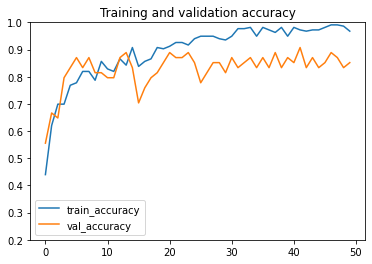

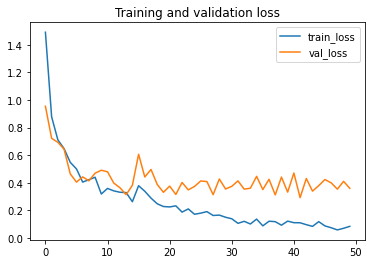

4/4 [==============================] - 1s 171ms/step - loss: 0.3655 - accuracy: 0.8333
{'loss': 0.36551201343536377, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
14/14 [==============================] - 8s 373ms/step - loss: 1.3247 - accuracy: 0.3472 - val_loss: 0.9458 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
14/14 [==============================] - 4s 255ms/step - loss: 0.9571 - accuracy: 0.5417 - val_loss: 0.8545 - val_accuracy: 0.5556

Epoch 00002: val_accuracy did not improve from 0.61111
Epoch 3/100
14/14 [==============================] - 4s 259ms/step - loss: 0.9011 - accuracy: 0.5694 - val_loss: 0.7864 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.61111 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_1.h5
Epoch 4/100
14/14 [==============================] - 3s 232ms/step - loss: 0.8202 - accuracy: 0.6204 - val_loss: 0.7829 - val_accuracy: 0.6111

Epoch 00004: val_accuracy did not improve from 0.64815
Epoch 5/100
14/14 [==============================] - 3s 231ms/step - loss: 0.7723 - accuracy: 0.6296 - val_loss: 0.7393 - val_accuracy: 0.7037

Epoch 00005: val_accuracy improved from 0.64815 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_1.h5
Epoch 6/100
14/14 [==============================] -

14/14 [==============================] - 3s 230ms/step - loss: 0.3486 - accuracy: 0.8704 - val_loss: 0.4560 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/100
14/14 [==============================] - 4s 255ms/step - loss: 0.3322 - accuracy: 0.8750 - val_loss: 0.5005 - val_accuracy: 0.8148

Epoch 00042: val_accuracy did not improve from 0.83333
Epoch 43/100
14/14 [==============================] - 4s 281ms/step - loss: 0.3155 - accuracy: 0.8935 - val_loss: 0.5047 - val_accuracy: 0.7222

Epoch 00043: val_accuracy did not improve from 0.83333
Epoch 44/100
14/14 [==============================] - 4s 282ms/step - loss: 0.3278 - accuracy: 0.8750 - val_loss: 0.4369 - val_accuracy: 0.8148

Epoch 00044: val_accuracy did not improve from 0.83333
Epoch 45/100
14/14 [==============================] - 4s 279ms/step - loss: 0.2810 - accuracy: 0.9167 - val_loss: 0.4319 - val_accuracy: 0.7593

Epoch 00045: val_accuracy did not improve from 0.83333
Epoch 46/100



Epoch 00081: val_accuracy did not improve from 0.88889
Epoch 82/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1941 - accuracy: 0.9398 - val_loss: 0.3832 - val_accuracy: 0.8704

Epoch 00082: val_accuracy did not improve from 0.88889
Epoch 83/100
14/14 [==============================] - 4s 268ms/step - loss: 0.1838 - accuracy: 0.9491 - val_loss: 0.3682 - val_accuracy: 0.8519

Epoch 00083: val_accuracy did not improve from 0.88889
Epoch 84/100
14/14 [==============================] - 3s 230ms/step - loss: 0.2043 - accuracy: 0.9444 - val_loss: 0.4599 - val_accuracy: 0.7778

Epoch 00084: val_accuracy did not improve from 0.88889
Epoch 85/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1849 - accuracy: 0.9398 - val_loss: 0.4051 - val_accuracy: 0.8519

Epoch 00085: val_accuracy did not improve from 0.88889
Epoch 86/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1869 - accuracy: 0.9444 - val_loss: 0.3192 - val_accuracy: 0.8704


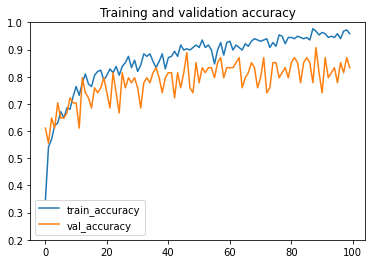

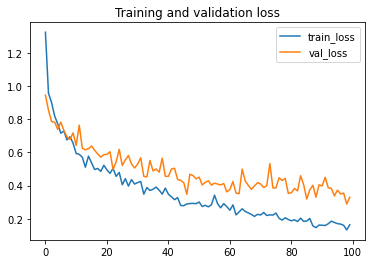

4/4 [==============================] - 1s 169ms/step - loss: 0.3674 - accuracy: 0.7778
{'loss': 0.36742207407951355, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
14/14 [==============================] - 7s 355ms/step - loss: 1.4084 - accuracy: 0.4213 - val_loss: 1.0901 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_2.h5
Epoch 2/100
14/14 [==============================] - 4s 280ms/step - loss: 0.9708 - accuracy: 0.5278 - val_loss: 0.8872 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.46296 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_2.h5
Epoch 3/100
14/14 [==============================] - 3s 231ms/step - loss: 0.9813 - accuracy: 0.5370 - val_loss: 0.8296 - val_accuracy: 0.6296

Epoch 00003: val_accuracy i

14/14 [==============================] - 4s 277ms/step - loss: 0.3215 - accuracy: 0.8981 - val_loss: 0.4851 - val_accuracy: 0.7963

Epoch 00037: val_accuracy did not improve from 0.83333
Epoch 38/100
14/14 [==============================] - 4s 281ms/step - loss: 0.3070 - accuracy: 0.9028 - val_loss: 0.4357 - val_accuracy: 0.8704

Epoch 00038: val_accuracy improved from 0.83333 to 0.87037, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_2.h5
Epoch 39/100
14/14 [==============================] - 4s 279ms/step - loss: 0.3636 - accuracy: 0.8657 - val_loss: 0.5489 - val_accuracy: 0.7778

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
14/14 [==============================] - 4s 280ms/step - loss: 0.3370 - accuracy: 0.8657 - val_loss: 0.4633 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
14/14 [==============================] - 3s 236ms/step - loss: 0.3146 - accuracy: 0.9213 - val_loss: 0.4073 - val_accuracy: 


Epoch 00077: val_accuracy did not improve from 0.87037
Epoch 78/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1748 - accuracy: 0.9398 - val_loss: 0.4022 - val_accuracy: 0.8148

Epoch 00078: val_accuracy did not improve from 0.87037
Epoch 79/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1974 - accuracy: 0.9444 - val_loss: 0.4025 - val_accuracy: 0.8148

Epoch 00079: val_accuracy did not improve from 0.87037
Epoch 80/100
14/14 [==============================] - 4s 281ms/step - loss: 0.1585 - accuracy: 0.9676 - val_loss: 0.4304 - val_accuracy: 0.7963

Epoch 00080: val_accuracy did not improve from 0.87037
Epoch 81/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1938 - accuracy: 0.9306 - val_loss: 0.4313 - val_accuracy: 0.7778

Epoch 00081: val_accuracy did not improve from 0.87037
Epoch 82/100
14/14 [==============================] - 3s 237ms/step - loss: 0.1829 - accuracy: 0.9398 - val_loss: 0.3890 - val_accuracy: 0.7963


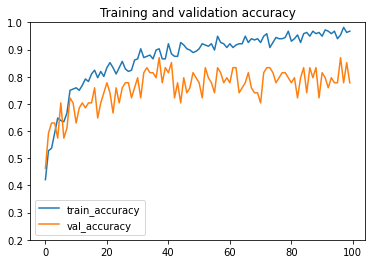

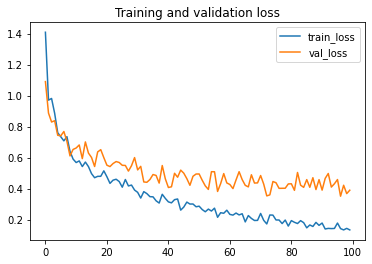

4/4 [==============================] - 1s 172ms/step - loss: 0.4374 - accuracy: 0.8519
{'loss': 0.4373844861984253, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
14/14 [==============================] - 7s 351ms/step - loss: 1.4407 - accuracy: 0.4074 - val_loss: 0.9214 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_3.h5
Epoch 2/100
14/14 [==============================] - 4s 255ms/step - loss: 0.9841 - accuracy: 0.5694 - val_loss: 0.6999 - val_accuracy: 0.7222

Epoch 00002: val_accuracy improved from 0.55556 to 0.72222, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_3.h5
Epoch 3/100
14/14 [==============================] - 4s 262ms/step - loss: 0.9167 - accuracy: 0.5926 - val_loss: 0.7390 - val_accuracy: 0.6852

Epoch 00003: val_accuracy di


Epoch 00037: val_accuracy did not improve from 0.90741
Epoch 38/100
14/14 [==============================] - 4s 279ms/step - loss: 0.3154 - accuracy: 0.8796 - val_loss: 0.3096 - val_accuracy: 0.8704

Epoch 00038: val_accuracy did not improve from 0.90741
Epoch 39/100
14/14 [==============================] - 4s 278ms/step - loss: 0.3226 - accuracy: 0.8935 - val_loss: 0.3741 - val_accuracy: 0.8148

Epoch 00039: val_accuracy did not improve from 0.90741
Epoch 40/100
14/14 [==============================] - 4s 287ms/step - loss: 0.3064 - accuracy: 0.8843 - val_loss: 0.3834 - val_accuracy: 0.7963

Epoch 00040: val_accuracy did not improve from 0.90741
Epoch 41/100
14/14 [==============================] - 4s 279ms/step - loss: 0.3312 - accuracy: 0.8657 - val_loss: 0.3052 - val_accuracy: 0.8519

Epoch 00041: val_accuracy did not improve from 0.90741
Epoch 42/100
14/14 [==============================] - 4s 275ms/step - loss: 0.2925 - accuracy: 0.8704 - val_loss: 0.4348 - val_accuracy: 0.7963


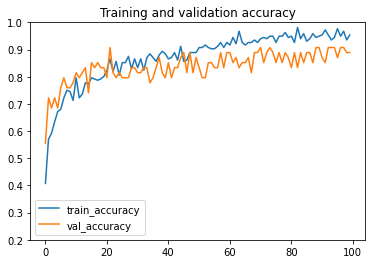

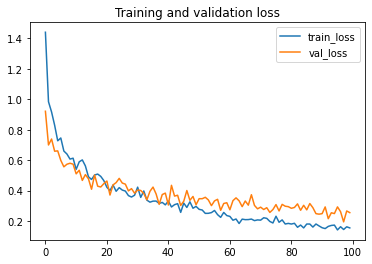

4/4 [==============================] - 1s 148ms/step - loss: 0.4739 - accuracy: 0.7963
{'loss': 0.47385749220848083, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
14/14 [==============================] - 7s 304ms/step - loss: 1.1317 - accuracy: 0.4306 - val_loss: 1.0055 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_4.h5
Epoch 2/100
14/14 [==============================] - 4s 261ms/step - loss: 0.9785 - accuracy: 0.5139 - val_loss: 0.8634 - val_accuracy: 0.5556

Epoch 00002: val_accuracy did not improve from 0.61111
Epoch 3/100
14/14 [==============================] - 4s 279ms/step - loss: 0.8676 - accuracy: 0.6157 - val_loss: 0.7657 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved from 0.61111 to 0.68519, saving model to C:/Users/user/Desktop/Model


Epoch 00078: val_accuracy did not improve from 0.83333
Epoch 79/100
14/14 [==============================] - 4s 274ms/step - loss: 0.2049 - accuracy: 0.9398 - val_loss: 0.4620 - val_accuracy: 0.7593

Epoch 00079: val_accuracy did not improve from 0.83333
Epoch 80/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1688 - accuracy: 0.9630 - val_loss: 0.5373 - val_accuracy: 0.7222

Epoch 00080: val_accuracy did not improve from 0.83333
Epoch 81/100
14/14 [==============================] - 4s 278ms/step - loss: 0.2216 - accuracy: 0.9491 - val_loss: 0.4694 - val_accuracy: 0.7222

Epoch 00081: val_accuracy did not improve from 0.83333
Epoch 82/100
14/14 [==============================] - 4s 278ms/step - loss: 0.1736 - accuracy: 0.9352 - val_loss: 0.5130 - val_accuracy: 0.7963

Epoch 00082: val_accuracy did not improve from 0.83333
Epoch 83/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1774 - accuracy: 0.9398 - val_loss: 0.5048 - val_accuracy: 0.7593


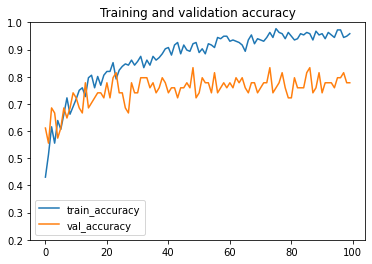

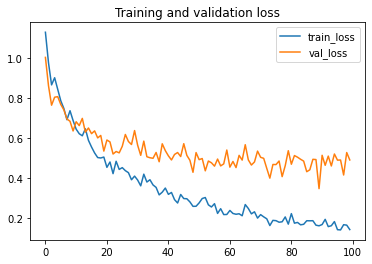

4/4 [==============================] - 1s 175ms/step - loss: 0.4804 - accuracy: 0.7778
{'loss': 0.4804084300994873, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
14/14 [==============================] - 8s 322ms/step - loss: 1.0915 - accuracy: 0.4583 - val_loss: 0.9486 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_5.h5
Epoch 2/100
14/14 [==============================] - 3s 238ms/step - loss: 0.9042 - accuracy: 0.5370 - val_loss: 0.8893 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.55556 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_17\model_5.h5
Epoch 3/100
14/14 [==============================] - 3s 236ms/step - loss: 0.8743 - accuracy: 0.5741 - val_loss: 0.8399 - val_accuracy: 0.5741

Epoch 00003: val_accuracy di

14/14 [==============================] - 4s 279ms/step - loss: 0.1928 - accuracy: 0.9259 - val_loss: 0.3401 - val_accuracy: 0.8889

Epoch 00077: val_accuracy did not improve from 0.88889
Epoch 78/100
14/14 [==============================] - 4s 277ms/step - loss: 0.1989 - accuracy: 0.9352 - val_loss: 0.3779 - val_accuracy: 0.8519

Epoch 00078: val_accuracy did not improve from 0.88889
Epoch 79/100
14/14 [==============================] - 4s 281ms/step - loss: 0.1736 - accuracy: 0.9630 - val_loss: 0.4342 - val_accuracy: 0.8148

Epoch 00079: val_accuracy did not improve from 0.88889
Epoch 80/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1705 - accuracy: 0.9583 - val_loss: 0.3955 - val_accuracy: 0.8148

Epoch 00080: val_accuracy did not improve from 0.88889
Epoch 81/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1672 - accuracy: 0.9583 - val_loss: 0.3548 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.88889
Epoch 82/100


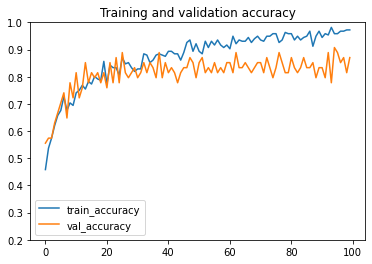

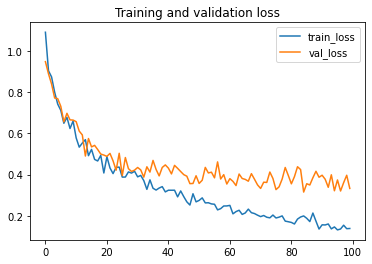

4/4 [==============================] - 1s 172ms/step - loss: 0.3458 - accuracy: 0.8333
{'loss': 0.3458227813243866, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
14/14 [==============================] - 7s 305ms/step - loss: 1.3773 - accuracy: 0.4861 - val_loss: 1.0073 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
14/14 [==============================] - 4s 253ms/step - loss: 0.9001 - accuracy: 0.6019 - val_loss: 0.7595 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.51852 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_1.h5
Epoch 3/100
14/14 [==============================] - 4s 277ms/step - loss: 0.7279 - accuracy: 0.6713 - val_loss: 0.7221 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved from 0.61111 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_1.h5
Epoch 4/100
14/14 [==============================] - 4s 279ms/step - loss: 0.6548 - accuracy: 0.7037 - val_loss: 0.5990 - val_accuracy: 0.6667

Epoch 00004: val_accuracy did not improve from 0.68519
Epoch 5/100
14/14 [==============================] - 4s 279ms/step - loss: 0.4788 - accuracy: 0.7639 - val_loss: 0.5787 - val_accuracy: 0.7778

Epoch 00005: val_accuracy improved from 0.68519 to 0.77778, saving model to C:/Users/user/Desktop/Model/sav

14/14 [==============================] - 4s 288ms/step - loss: 0.0904 - accuracy: 0.9769 - val_loss: 0.2971 - val_accuracy: 0.8519

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/100
14/14 [==============================] - 4s 277ms/step - loss: 0.0641 - accuracy: 0.9861 - val_loss: 0.4685 - val_accuracy: 0.8333

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/100
14/14 [==============================] - 4s 280ms/step - loss: 0.0754 - accuracy: 0.9815 - val_loss: 0.3161 - val_accuracy: 0.8333

Epoch 00043: val_accuracy did not improve from 0.88889
Epoch 44/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1194 - accuracy: 0.9630 - val_loss: 0.3769 - val_accuracy: 0.8519

Epoch 00044: val_accuracy did not improve from 0.88889
Epoch 45/100
14/14 [==============================] - 4s 280ms/step - loss: 0.0862 - accuracy: 0.9676 - val_loss: 0.3404 - val_accuracy: 0.8889

Epoch 00045: val_accuracy did not improve from 0.88889
Epoch 46/100



Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
14/14 [==============================] - 4s 290ms/step - loss: 0.0267 - accuracy: 1.0000 - val_loss: 0.2911 - val_accuracy: 0.8519

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
14/14 [==============================] - 4s 279ms/step - loss: 0.0335 - accuracy: 0.9954 - val_loss: 0.3419 - val_accuracy: 0.8333

Epoch 00083: val_accuracy did not improve from 0.90741
Epoch 84/100
14/14 [==============================] - 4s 280ms/step - loss: 0.0338 - accuracy: 0.9954 - val_loss: 0.3740 - val_accuracy: 0.8704

Epoch 00084: val_accuracy did not improve from 0.90741
Epoch 85/100
14/14 [==============================] - 4s 271ms/step - loss: 0.0295 - accuracy: 0.9954 - val_loss: 0.2725 - val_accuracy: 0.8519

Epoch 00085: val_accuracy did not improve from 0.90741
Epoch 86/100
14/14 [==============================] - 4s 279ms/step - loss: 0.0267 - accuracy: 1.0000 - val_loss: 0.2784 - val_accuracy: 0.8333


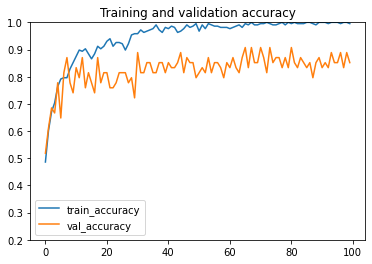

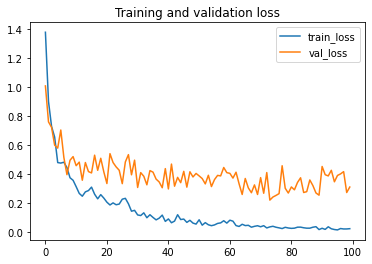

4/4 [==============================] - 1s 171ms/step - loss: 0.4085 - accuracy: 0.8704
{'loss': 0.40845969319343567, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
14/14 [==============================] - 8s 361ms/step - loss: 1.5013 - accuracy: 0.4259 - val_loss: 0.9613 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_2.h5
Epoch 2/100
14/14 [==============================] - 4s 274ms/step - loss: 0.9897 - accuracy: 0.5324 - val_loss: 0.6159 - val_accuracy: 0.7407

Epoch 00002: val_accuracy improved from 0.46296 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_2.h5
Epoch 3/100
14/14 [==============================] - 4s 279ms/step - loss: 0.6914 - accuracy: 0.6806 - val_loss: 0.6193 - val_accuracy: 0.7222

Epoch 00003: val_accuracy d


Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1390 - accuracy: 0.9491 - val_loss: 0.5110 - val_accuracy: 0.7407

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
14/14 [==============================] - 4s 279ms/step - loss: 0.1167 - accuracy: 0.9676 - val_loss: 0.4178 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
14/14 [==============================] - 4s 278ms/step - loss: 0.1361 - accuracy: 0.9491 - val_loss: 0.3730 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1343 - accuracy: 0.9722 - val_loss: 0.3745 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.87037
Epoch 43/100
14/14 [==============================] - 4s 270ms/step - loss: 0.1012 - accuracy: 0.9861 - val_loss: 0.5264 - val_accuracy: 0.7593



Epoch 00078: val_accuracy did not improve from 0.92593
Epoch 79/100
14/14 [==============================] - 4s 258ms/step - loss: 0.0335 - accuracy: 0.9954 - val_loss: 0.2554 - val_accuracy: 0.9074

Epoch 00079: val_accuracy did not improve from 0.92593
Epoch 80/100
14/14 [==============================] - 4s 268ms/step - loss: 0.0474 - accuracy: 0.9907 - val_loss: 0.4330 - val_accuracy: 0.8519

Epoch 00080: val_accuracy did not improve from 0.92593
Epoch 81/100
14/14 [==============================] - 4s 287ms/step - loss: 0.0581 - accuracy: 0.9861 - val_loss: 0.2577 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.92593
Epoch 82/100
14/14 [==============================] - 4s 252ms/step - loss: 0.0377 - accuracy: 0.9954 - val_loss: 0.2852 - val_accuracy: 0.9074

Epoch 00082: val_accuracy did not improve from 0.92593
Epoch 83/100
14/14 [==============================] - 4s 277ms/step - loss: 0.0391 - accuracy: 0.9954 - val_loss: 0.4243 - val_accuracy: 0.8333


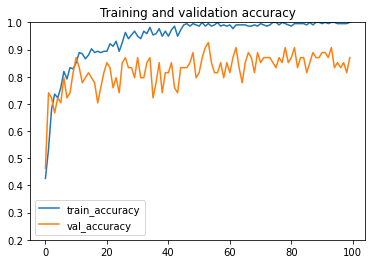

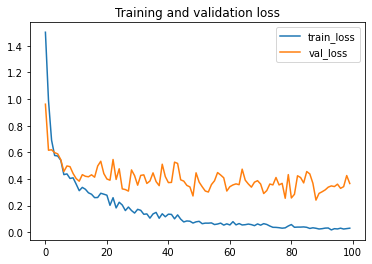

4/4 [==============================] - 1s 151ms/step - loss: 0.4100 - accuracy: 0.8333
{'loss': 0.41000667214393616, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
14/14 [==============================] - 7s 301ms/step - loss: 1.2220 - accuracy: 0.5000 - val_loss: 0.6509 - val_accuracy: 0.7407

Epoch 00001: val_accuracy improved from -inf to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_3.h5
Epoch 2/100
14/14 [==============================] - 3s 231ms/step - loss: 0.8466 - accuracy: 0.6667 - val_loss: 0.6225 - val_accuracy: 0.7222

Epoch 00002: val_accuracy did not improve from 0.74074
Epoch 3/100
14/14 [==============================] - 3s 231ms/step - loss: 0.6577 - accuracy: 0.6944 - val_loss: 0.4714 - val_accuracy: 0.7037

Epoch 00003: val_accuracy did not improve from 0.74074
Epoch 4/100
14/14 [=============================

14/14 [==============================] - 4s 284ms/step - loss: 0.0325 - accuracy: 0.9954 - val_loss: 0.1657 - val_accuracy: 0.9259

Epoch 00079: val_accuracy did not improve from 0.98148
Epoch 80/100
14/14 [==============================] - 4s 293ms/step - loss: 0.0303 - accuracy: 0.9954 - val_loss: 0.2176 - val_accuracy: 0.8889

Epoch 00080: val_accuracy did not improve from 0.98148
Epoch 81/100
14/14 [==============================] - 4s 277ms/step - loss: 0.0353 - accuracy: 1.0000 - val_loss: 0.1434 - val_accuracy: 0.9259

Epoch 00081: val_accuracy did not improve from 0.98148
Epoch 82/100
14/14 [==============================] - 4s 276ms/step - loss: 0.0351 - accuracy: 0.9907 - val_loss: 0.1529 - val_accuracy: 0.9259

Epoch 00082: val_accuracy did not improve from 0.98148
Epoch 83/100
14/14 [==============================] - 4s 282ms/step - loss: 0.0292 - accuracy: 0.9954 - val_loss: 0.1580 - val_accuracy: 0.9444

Epoch 00083: val_accuracy did not improve from 0.98148
Epoch 84/100


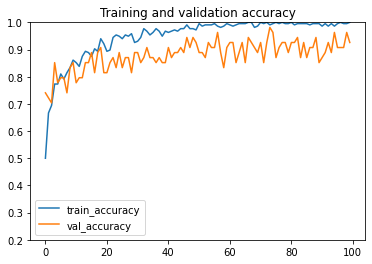

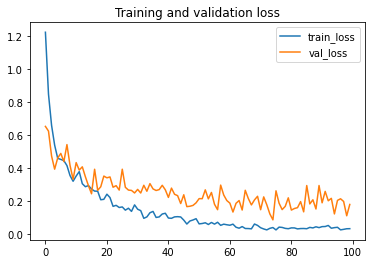

4/4 [==============================] - 1s 147ms/step - loss: 0.1327 - accuracy: 0.9815
{'loss': 0.13269560039043427, 'accuracy': 0.9814814925193787}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
14/14 [==============================] - 7s 310ms/step - loss: 1.6671 - accuracy: 0.4352 - val_loss: 0.8259 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_4.h5
Epoch 2/100
14/14 [==============================] - 3s 238ms/step - loss: 1.0188 - accuracy: 0.5648 - val_loss: 0.7604 - val_accuracy: 0.7037

Epoch 00002: val_accuracy improved from 0.53704 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_4.h5
Epoch 3/100
14/14 [==============================] - 4s 271ms/step - loss: 0.7510 - accuracy: 0.6667 - val_loss: 0.6958 - val_accuracy: 0.6481

Epoch 00003: val_accuracy d


Epoch 00037: val_accuracy did not improve from 0.87037
Epoch 38/100
14/14 [==============================] - 4s 283ms/step - loss: 0.1350 - accuracy: 0.9583 - val_loss: 0.3614 - val_accuracy: 0.8333

Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/100
14/14 [==============================] - 4s 298ms/step - loss: 0.1628 - accuracy: 0.9259 - val_loss: 0.5263 - val_accuracy: 0.8148

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
14/14 [==============================] - 4s 282ms/step - loss: 0.1752 - accuracy: 0.9352 - val_loss: 0.3806 - val_accuracy: 0.7778

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
14/14 [==============================] - 4s 280ms/step - loss: 0.1584 - accuracy: 0.9444 - val_loss: 0.4888 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
14/14 [==============================] - 4s 282ms/step - loss: 0.1121 - accuracy: 0.9722 - val_loss: 0.5977 - val_accuracy: 0.7593



Epoch 00078: val_accuracy did not improve from 0.87037
Epoch 79/100
14/14 [==============================] - 4s 294ms/step - loss: 0.0470 - accuracy: 0.9954 - val_loss: 0.4796 - val_accuracy: 0.7778

Epoch 00079: val_accuracy did not improve from 0.87037
Epoch 80/100
14/14 [==============================] - 4s 267ms/step - loss: 0.0396 - accuracy: 1.0000 - val_loss: 0.4797 - val_accuracy: 0.8148

Epoch 00080: val_accuracy did not improve from 0.87037
Epoch 81/100
14/14 [==============================] - 4s 280ms/step - loss: 0.0310 - accuracy: 0.9954 - val_loss: 0.4942 - val_accuracy: 0.8333

Epoch 00081: val_accuracy did not improve from 0.87037
Epoch 82/100
14/14 [==============================] - 4s 271ms/step - loss: 0.0412 - accuracy: 0.9907 - val_loss: 0.5068 - val_accuracy: 0.7778

Epoch 00082: val_accuracy did not improve from 0.87037
Epoch 83/100
14/14 [==============================] - 4s 263ms/step - loss: 0.0329 - accuracy: 0.9954 - val_loss: 0.4361 - val_accuracy: 0.8148


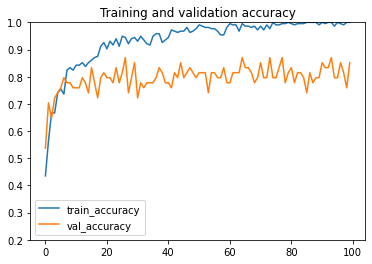

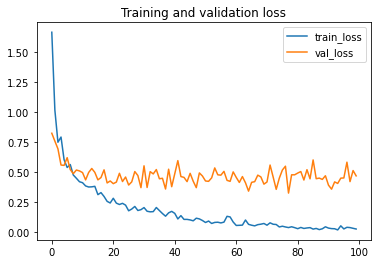

4/4 [==============================] - 1s 170ms/step - loss: 0.4994 - accuracy: 0.7778
{'loss': 0.4993768632411957, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
14/14 [==============================] - 8s 377ms/step - loss: 1.7080 - accuracy: 0.4074 - val_loss: 1.0182 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_5.h5
Epoch 2/100
14/14 [==============================] - 3s 233ms/step - loss: 0.9849 - accuracy: 0.5787 - val_loss: 1.0224 - val_accuracy: 0.5370

Epoch 00002: val_accuracy improved from 0.50000 to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_18\model_5.h5
Epoch 3/100
14/14 [==============================] - 4s 273ms/step - loss: 0.8450 - accuracy: 0.6481 - val_loss: 0.7120 - val_accuracy: 0.6667

Epoch 00003: val_accuracy im

14/14 [==============================] - 4s 279ms/step - loss: 0.1400 - accuracy: 0.9722 - val_loss: 0.4159 - val_accuracy: 0.8333

Epoch 00038: val_accuracy did not improve from 0.88889
Epoch 39/100
14/14 [==============================] - 3s 239ms/step - loss: 0.1424 - accuracy: 0.9583 - val_loss: 0.3898 - val_accuracy: 0.8889

Epoch 00039: val_accuracy did not improve from 0.88889
Epoch 40/100
14/14 [==============================] - 4s 272ms/step - loss: 0.1718 - accuracy: 0.9213 - val_loss: 0.4421 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/100
14/14 [==============================] - 4s 278ms/step - loss: 0.1568 - accuracy: 0.9398 - val_loss: 0.4695 - val_accuracy: 0.7963

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/100
14/14 [==============================] - 4s 256ms/step - loss: 0.1059 - accuracy: 0.9722 - val_loss: 0.4566 - val_accuracy: 0.7778

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/100



Epoch 00078: val_accuracy did not improve from 0.90741
Epoch 79/100
14/14 [==============================] - 4s 278ms/step - loss: 0.0600 - accuracy: 0.9769 - val_loss: 0.4810 - val_accuracy: 0.8519

Epoch 00079: val_accuracy did not improve from 0.90741
Epoch 80/100
14/14 [==============================] - 4s 277ms/step - loss: 0.0566 - accuracy: 0.9907 - val_loss: 0.3689 - val_accuracy: 0.8889

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
14/14 [==============================] - 4s 280ms/step - loss: 0.0420 - accuracy: 0.9907 - val_loss: 0.4149 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
14/14 [==============================] - 4s 278ms/step - loss: 0.0659 - accuracy: 0.9769 - val_loss: 0.4305 - val_accuracy: 0.9074

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
14/14 [==============================] - 4s 278ms/step - loss: 0.0379 - accuracy: 0.9907 - val_loss: 0.4013 - val_accuracy: 0.8704


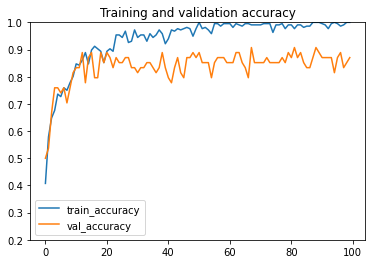

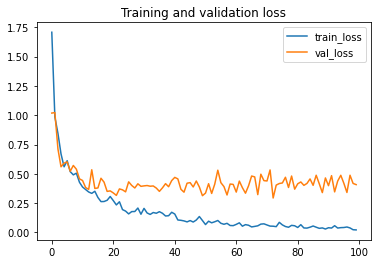

4/4 [==============================] - 1s 171ms/step - loss: 0.4320 - accuracy: 0.8704
{'loss': 0.4320110082626343, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
7/7 [==============================] - 9s 956ms/step - loss: 1.2950 - accuracy: 0.3935 - val_loss: 1.0021 - val_accuracy: 0.5741

Epoch 00001: val_accuracy improved from -inf to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
7/7 [==============================] - 3s 466ms/step - loss: 1.0978 - accuracy: 0.4907 - val_loss: 0.8749 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.57407
Epoch 3/20
7/7 [==============================] - 3s 460ms/step - loss: 0.9415 - accuracy: 0.5694 - val_loss: 0.8707 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.57407 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_1.h5
Epoch 4/20
7/7 [==============================] - 3s 459ms/step - loss: 0.8370 - accuracy: 0.6111 - val_loss: 0.8949 - val_accuracy: 0.6667

Epoch 00004: val_accuracy improved from 0.64815 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_1.h5
Epoch 5/20
7/7 [==============================] - 3s 464ms/step - loss: 0.7112 - accuracy: 0.6944 - val_loss: 0.7153 - val_accuracy: 0.7037

Epoch 00005: val_accuracy improved from 0.66667 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_models_19

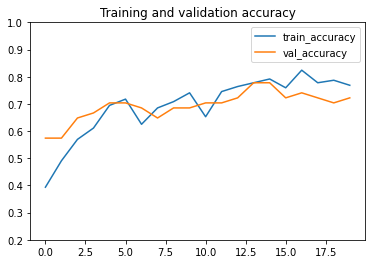

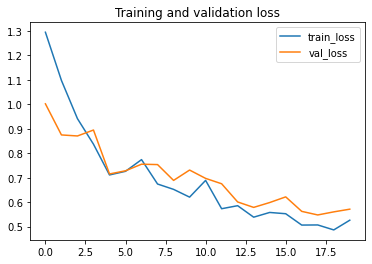

2/2 [==============================] - 1s 196ms/step - loss: 0.6365 - accuracy: 0.7593
{'loss': 0.6364567279815674, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
7/7 [==============================] - 7s 667ms/step - loss: 1.1536 - accuracy: 0.4537 - val_loss: 0.9799 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_2.h5
Epoch 2/20
7/7 [==============================] - 4s 496ms/step - loss: 0.9142 - accuracy: 0.5741 - val_loss: 0.8329 - val_accuracy: 0.5556

Epoch 00002: val_accuracy improved from 0.50000 to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_2.h5
Epoch 3/20
7/7 [==============================] - 3s 468ms/step - loss: 0.8774 - accuracy: 0.5370 - val_loss: 0.7715 - val_accuracy: 0.5741

Epoch 00003: val_accuracy improved fr

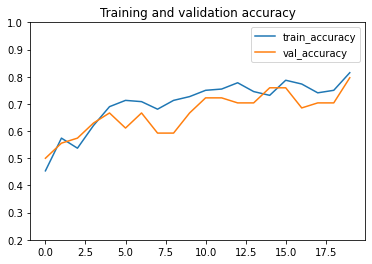

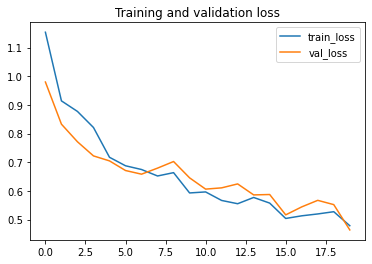

2/2 [==============================] - 1s 198ms/step - loss: 0.5800 - accuracy: 0.6667
{'loss': 0.5799711346626282, 'accuracy': 0.6666666865348816}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
7/7 [==============================] - 8s 770ms/step - loss: 1.4214 - accuracy: 0.3380 - val_loss: 0.8784 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_3.h5
Epoch 2/20
7/7 [==============================] - 4s 554ms/step - loss: 1.0878 - accuracy: 0.5185 - val_loss: 0.8716 - val_accuracy: 0.5926

Epoch 00002: val_accuracy did not improve from 0.61111
Epoch 3/20
7/7 [==============================] - 4s 514ms/step - loss: 0.9981 - accuracy: 0.5324 - val_loss: 0.8492 - val_accuracy: 0.5000

Epoch 00003: val_accuracy did not improve from 0.61111
Epoch 4/20
7/7 [==============================] - 3s 470ms

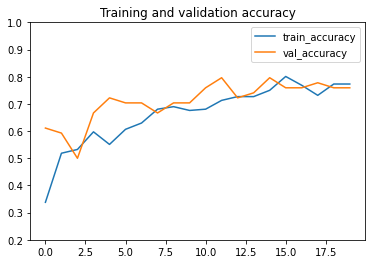

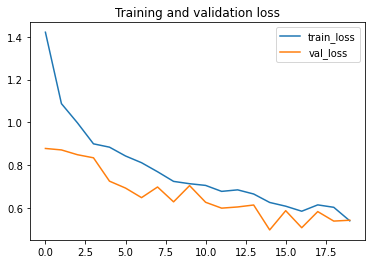

2/2 [==============================] - 1s 196ms/step - loss: 0.5686 - accuracy: 0.7593
{'loss': 0.5686335563659668, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
7/7 [==============================] - 8s 785ms/step - loss: 1.2211 - accuracy: 0.4167 - val_loss: 1.0367 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_4.h5
Epoch 2/20
7/7 [==============================] - 4s 544ms/step - loss: 1.0252 - accuracy: 0.5278 - val_loss: 0.8837 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.50000 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_4.h5
Epoch 3/20
7/7 [==============================] - 4s 530ms/step - loss: 0.9735 - accuracy: 0.5370 - val_loss: 0.8406 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved fr

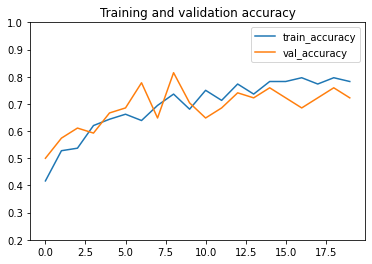

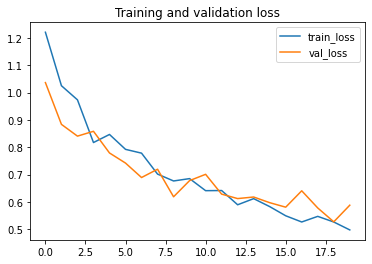

2/2 [==============================] - 1s 198ms/step - loss: 0.5788 - accuracy: 0.7778
{'loss': 0.5788232088088989, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
7/7 [==============================] - 8s 796ms/step - loss: 1.1898 - accuracy: 0.4259 - val_loss: 1.0710 - val_accuracy: 0.3519

Epoch 00001: val_accuracy improved from -inf to 0.35185, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_5.h5
Epoch 2/20
7/7 [==============================] - 3s 465ms/step - loss: 0.9692 - accuracy: 0.5324 - val_loss: 0.9751 - val_accuracy: 0.5000

Epoch 00002: val_accuracy improved from 0.35185 to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_19\model_5.h5
Epoch 3/20
7/7 [==============================] - 4s 510ms/step - loss: 0.9385 - accuracy: 0.5602 - val_loss: 0.9308 - val_accuracy: 0.5741

Epoch 00003: val_accuracy improved fr

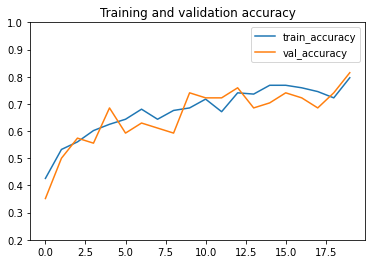

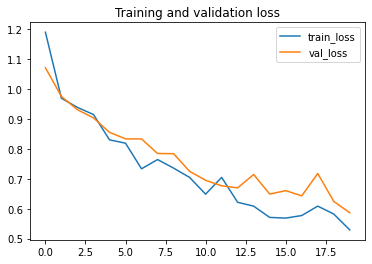

2/2 [==============================] - 1s 199ms/step - loss: 0.6248 - accuracy: 0.7593
{'loss': 0.6248221397399902, 'accuracy': 0.7592592835426331}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/20
7/7 [==============================] - 7s 703ms/step - loss: 1.7594 - accuracy: 0.3796 - val_loss: 0.9802 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/20
7/7 [==============================] - 4s 551ms/step - loss: 1.0425 - accuracy: 0.5324 - val_loss: 0.8184 - val_accuracy: 0.5370

Epoch 00002: val_accuracy did not improve from 0.55556
Epoch 3/20
7/7 [==============================] - 4s 531ms/step - loss: 0.8445 - accuracy: 0.6250 - val_loss: 0.8493 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.55556 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_1.h5
Epoch 4/20
7/7 [==============================] - 3s 466ms/step - loss: 0.7591 - accuracy: 0.6620 - val_loss: 0.6842 - val_accuracy: 0.6852

Epoch 00004: val_accuracy improved from 0.64815 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_1.h5
Epoch 5/20
7/7 [==============================] - 3s 456ms/step - loss: 0.6531 - accuracy: 0.6944 - val_loss: 0.6016 - val_accuracy: 0.7593

Epoch 00005: val_accuracy improved from 0.68519 to 0.75926, saving model to C:/Users/user/Desktop/Model/saved_models_20

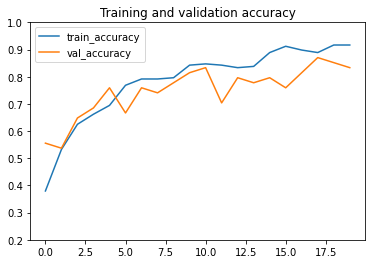

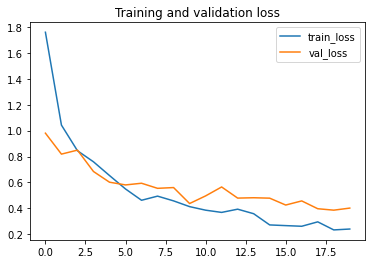

2/2 [==============================] - 1s 236ms/step - loss: 0.3650 - accuracy: 0.8148
{'loss': 0.365036278963089, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/20
7/7 [==============================] - 7s 655ms/step - loss: 1.7616 - accuracy: 0.3519 - val_loss: 0.9787 - val_accuracy: 0.4444

Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_2.h5
Epoch 2/20
7/7 [==============================] - 4s 529ms/step - loss: 1.0458 - accuracy: 0.5602 - val_loss: 0.8294 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.44444 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_2.h5
Epoch 3/20
7/7 [==============================] - 4s 539ms/step - loss: 0.9220 - accuracy: 0.6019 - val_loss: 0.8250 - val_accuracy: 0.5741

Epoch 00003: val_accuracy did not impr

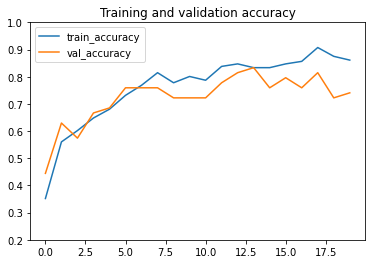

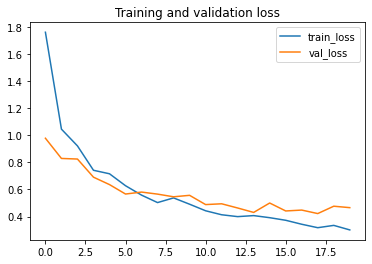

2/2 [==============================] - 1s 198ms/step - loss: 0.4825 - accuracy: 0.7778
{'loss': 0.48252636194229126, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/20
7/7 [==============================] - 8s 756ms/step - loss: 2.0794 - accuracy: 0.3750 - val_loss: 0.7753 - val_accuracy: 0.5926

Epoch 00001: val_accuracy improved from -inf to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_3.h5
Epoch 2/20
7/7 [==============================] - 4s 557ms/step - loss: 1.1844 - accuracy: 0.4815 - val_loss: 0.6824 - val_accuracy: 0.6481

Epoch 00002: val_accuracy improved from 0.59259 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_3.h5
Epoch 3/20
7/7 [==============================] - 4s 576ms/step - loss: 0.8895 - accuracy: 0.5787 - val_loss: 0.6586 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved f

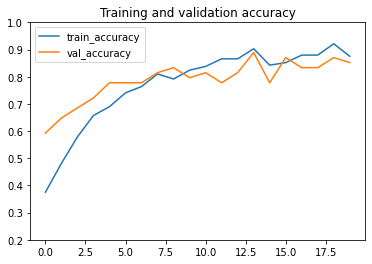

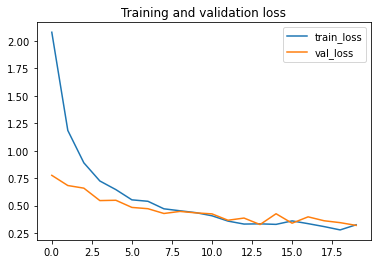

2/2 [==============================] - 1s 197ms/step - loss: 0.3853 - accuracy: 0.8148
{'loss': 0.38533931970596313, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/20
7/7 [==============================] - 7s 636ms/step - loss: 1.4771 - accuracy: 0.4815 - val_loss: 0.6729 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_4.h5
Epoch 2/20
7/7 [==============================] - 3s 463ms/step - loss: 0.8562 - accuracy: 0.6204 - val_loss: 0.8078 - val_accuracy: 0.5556

Epoch 00002: val_accuracy did not improve from 0.68519
Epoch 3/20
7/7 [==============================] - 4s 551ms/step - loss: 0.7460 - accuracy: 0.7083 - val_loss: 0.7786 - val_accuracy: 0.7037

Epoch 00003: val_accuracy improved from 0.68519 to 0.70370, saving model to C:/Users/user/Desktop/Model/saved_mo

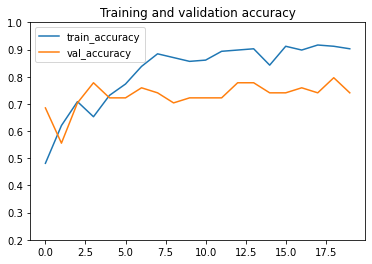

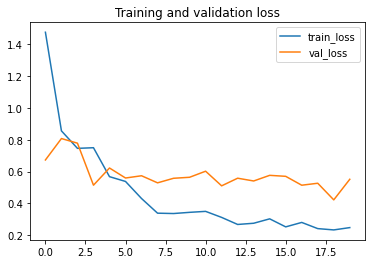

2/2 [==============================] - 1s 244ms/step - loss: 0.5333 - accuracy: 0.7222
{'loss': 0.5333152413368225, 'accuracy': 0.7222222089767456}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/20
7/7 [==============================] - 7s 648ms/step - loss: 3.0698 - accuracy: 0.3241 - val_loss: 1.1521 - val_accuracy: 0.4444

Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_5.h5
Epoch 2/20
7/7 [==============================] - 3s 468ms/step - loss: 1.4453 - accuracy: 0.4352 - val_loss: 1.0168 - val_accuracy: 0.4630

Epoch 00002: val_accuracy improved from 0.44444 to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_20\model_5.h5
Epoch 3/20
7/7 [==============================] - 3s 464ms/step - loss: 1.0463 - accuracy: 0.5370 - val_loss: 0.8626 - val_accuracy: 0.5926

Epoch 00003: val_accuracy improved fr

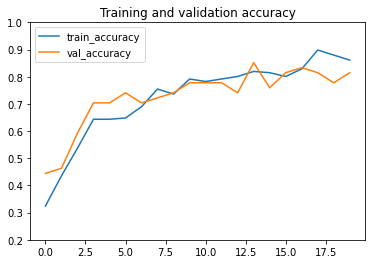

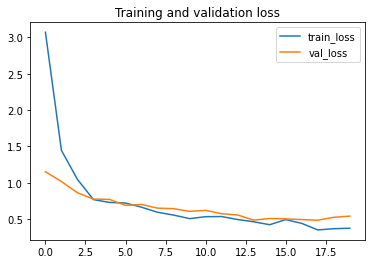

2/2 [==============================] - 1s 245ms/step - loss: 0.4909 - accuracy: 0.8519
{'loss': 0.4909265339374542, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
7/7 [==============================] - 7s 654ms/step - loss: 1.3358 - accuracy: 0.4398 - val_loss: 0.9665 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
7/7 [==============================] - 3s 459ms/step - loss: 0.9638 - accuracy: 0.5370 - val_loss: 0.8795 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.51852 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_1.h5
Epoch 3/50
7/7 [==============================] - 4s 502ms/step - loss: 0.9531 - accuracy: 0.5787 - val_loss: 0.8183 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.57407 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_1.h5
Epoch 4/50
7/7 [==============================] - 4s 522ms/step - loss: 0.7743 - accuracy: 0.6528 - val_loss: 0.8022 - val_accuracy: 0.6111

Epoch 00004: val_accuracy did not improve from 0.64815
Epoch 5/50
7/7 [==============================] - 3s 464ms/step - loss: 0.7819 - accuracy: 0.6343 - val_loss: 0.7952 - val_accuracy: 0.6111

Epoch 00005: val_accuracy did not improve from 0.64815
Epoch 6/50
7/7 [==============================] - 3s 461ms/step 

7/7 [==============================] - 4s 487ms/step - loss: 0.4104 - accuracy: 0.8241 - val_loss: 0.4212 - val_accuracy: 0.8333

Epoch 00041: val_accuracy did not improve from 0.85185
Epoch 42/50
7/7 [==============================] - 4s 562ms/step - loss: 0.3345 - accuracy: 0.8796 - val_loss: 0.3772 - val_accuracy: 0.8519

Epoch 00042: val_accuracy did not improve from 0.85185
Epoch 43/50
7/7 [==============================] - 4s 550ms/step - loss: 0.3358 - accuracy: 0.8704 - val_loss: 0.4488 - val_accuracy: 0.8333

Epoch 00043: val_accuracy did not improve from 0.85185
Epoch 44/50
7/7 [==============================] - 4s 490ms/step - loss: 0.3611 - accuracy: 0.8519 - val_loss: 0.4155 - val_accuracy: 0.7963

Epoch 00044: val_accuracy did not improve from 0.85185
Epoch 45/50
7/7 [==============================] - 4s 516ms/step - loss: 0.2911 - accuracy: 0.8935 - val_loss: 0.3910 - val_accuracy: 0.8333

Epoch 00045: val_accuracy did not improve from 0.85185
Epoch 46/50
7/7 [==========

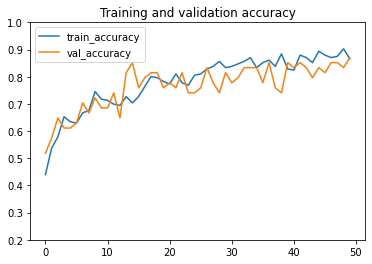

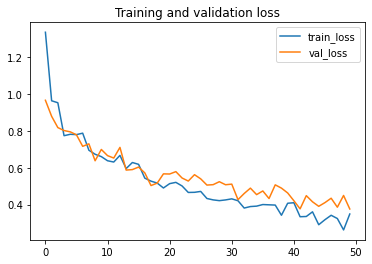

2/2 [==============================] - 1s 233ms/step - loss: 0.4420 - accuracy: 0.8148
{'loss': 0.44199007749557495, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
7/7 [==============================] - 9s 819ms/step - loss: 1.3856 - accuracy: 0.3843 - val_loss: 1.0059 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_2.h5
Epoch 2/50
7/7 [==============================] - 4s 563ms/step - loss: 1.0933 - accuracy: 0.5139 - val_loss: 0.9779 - val_accuracy: 0.5370

Epoch 00002: val_accuracy improved from 0.51852 to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_2.h5
Epoch 3/50
7/7 [==============================] - 4s 519ms/step - loss: 0.9392 - accuracy: 0.5556 - val_loss: 0.9312 - val_accuracy: 0.5926

Epoch 00003: val_accuracy improved f

7/7 [==============================] - 4s 553ms/step - loss: 0.3297 - accuracy: 0.8704 - val_loss: 0.5187 - val_accuracy: 0.7037

Epoch 00038: val_accuracy did not improve from 0.83333
Epoch 39/50
7/7 [==============================] - 3s 458ms/step - loss: 0.3422 - accuracy: 0.8796 - val_loss: 0.4729 - val_accuracy: 0.7407

Epoch 00039: val_accuracy did not improve from 0.83333
Epoch 40/50
7/7 [==============================] - 4s 539ms/step - loss: 0.3442 - accuracy: 0.8889 - val_loss: 0.4782 - val_accuracy: 0.7778

Epoch 00040: val_accuracy did not improve from 0.83333
Epoch 41/50
7/7 [==============================] - 3s 468ms/step - loss: 0.3194 - accuracy: 0.8843 - val_loss: 0.4728 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/50
7/7 [==============================] - 4s 543ms/step - loss: 0.2926 - accuracy: 0.8889 - val_loss: 0.4279 - val_accuracy: 0.8333

Epoch 00042: val_accuracy did not improve from 0.83333
Epoch 43/50
7/7 [==========

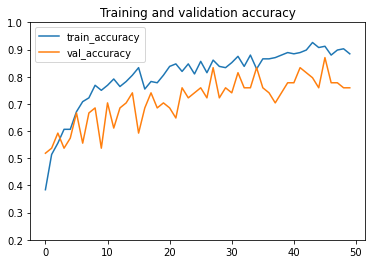

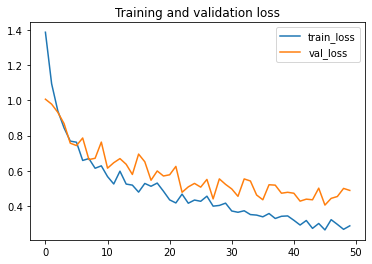

2/2 [==============================] - 1s 197ms/step - loss: 0.4990 - accuracy: 0.8148
{'loss': 0.499009370803833, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
7/7 [==============================] - 7s 647ms/step - loss: 1.3966 - accuracy: 0.3704 - val_loss: 1.0381 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_3.h5
Epoch 2/50
7/7 [==============================] - 3s 465ms/step - loss: 1.0701 - accuracy: 0.4954 - val_loss: 0.9239 - val_accuracy: 0.5556

Epoch 00002: val_accuracy improved from 0.46296 to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_3.h5
Epoch 3/50
7/7 [==============================] - 4s 558ms/step - loss: 1.0351 - accuracy: 0.4954 - val_loss: 0.8808 - val_accuracy: 0.5370

Epoch 00003: val_accuracy did not impr

7/7 [==============================] - 4s 574ms/step - loss: 0.4302 - accuracy: 0.7963 - val_loss: 0.4811 - val_accuracy: 0.7593

Epoch 00038: val_accuracy did not improve from 0.85185
Epoch 39/50
7/7 [==============================] - 4s 573ms/step - loss: 0.3883 - accuracy: 0.8287 - val_loss: 0.4243 - val_accuracy: 0.8148

Epoch 00039: val_accuracy did not improve from 0.85185
Epoch 40/50
7/7 [==============================] - 4s 584ms/step - loss: 0.4346 - accuracy: 0.8287 - val_loss: 0.4361 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.85185
Epoch 41/50
7/7 [==============================] - 4s 571ms/step - loss: 0.4229 - accuracy: 0.8565 - val_loss: 0.4303 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.85185
Epoch 42/50
7/7 [==============================] - 4s 600ms/step - loss: 0.3941 - accuracy: 0.8565 - val_loss: 0.3551 - val_accuracy: 0.8333

Epoch 00042: val_accuracy did not improve from 0.85185
Epoch 43/50
7/7 [==========

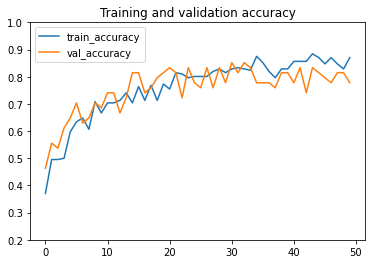

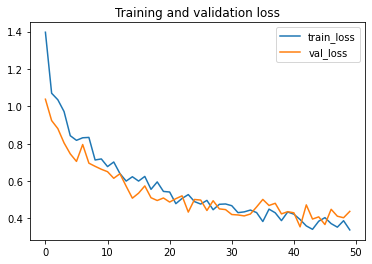

2/2 [==============================] - 1s 240ms/step - loss: 0.4287 - accuracy: 0.8148
{'loss': 0.42870786786079407, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
7/7 [==============================] - 8s 778ms/step - loss: 1.4067 - accuracy: 0.3565 - val_loss: 1.1219 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_4.h5
Epoch 2/50
7/7 [==============================] - 3s 480ms/step - loss: 1.1438 - accuracy: 0.4630 - val_loss: 0.9279 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.46296 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_4.h5
Epoch 3/50
7/7 [==============================] - 4s 477ms/step - loss: 0.9861 - accuracy: 0.5093 - val_loss: 0.8729 - val_accuracy: 0.5926

Epoch 00003: val_accuracy did not im

7/7 [==============================] - 4s 483ms/step - loss: 0.3014 - accuracy: 0.9028 - val_loss: 0.5679 - val_accuracy: 0.7222

Epoch 00038: val_accuracy did not improve from 0.79630
Epoch 39/50
7/7 [==============================] - 3s 455ms/step - loss: 0.3275 - accuracy: 0.8981 - val_loss: 0.5431 - val_accuracy: 0.7778

Epoch 00039: val_accuracy did not improve from 0.79630
Epoch 40/50
7/7 [==============================] - 4s 569ms/step - loss: 0.3258 - accuracy: 0.8565 - val_loss: 0.5056 - val_accuracy: 0.7963

Epoch 00040: val_accuracy did not improve from 0.79630
Epoch 41/50
7/7 [==============================] - 4s 575ms/step - loss: 0.2656 - accuracy: 0.9259 - val_loss: 0.5277 - val_accuracy: 0.7963

Epoch 00041: val_accuracy did not improve from 0.79630
Epoch 42/50
7/7 [==============================] - 4s 597ms/step - loss: 0.3023 - accuracy: 0.8935 - val_loss: 0.5404 - val_accuracy: 0.7222

Epoch 00042: val_accuracy did not improve from 0.79630
Epoch 43/50
7/7 [==========

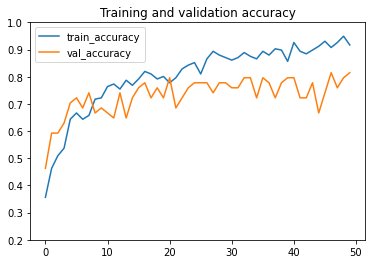

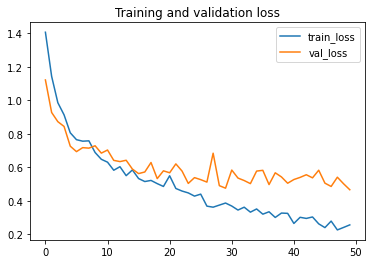

2/2 [==============================] - 1s 198ms/step - loss: 0.5616 - accuracy: 0.7963
{'loss': 0.5615884065628052, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
7/7 [==============================] - 8s 643ms/step - loss: 1.3723 - accuracy: 0.3519 - val_loss: 0.9981 - val_accuracy: 0.5000

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_5.h5
Epoch 2/50
7/7 [==============================] - 3s 485ms/step - loss: 1.0439 - accuracy: 0.4769 - val_loss: 0.8856 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.50000 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_21\model_5.h5
Epoch 3/50
7/7 [==============================] - 4s 503ms/step - loss: 0.9521 - accuracy: 0.5417 - val_loss: 0.8537 - val_accuracy: 0.5556

Epoch 00003: val_accuracy did not imp

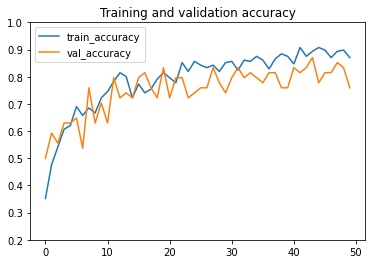

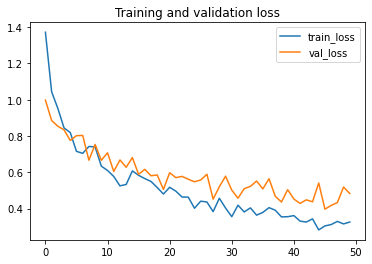

2/2 [==============================] - 1s 243ms/step - loss: 0.4874 - accuracy: 0.8148
{'loss': 0.48741576075553894, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/50
7/7 [==============================] - 7s 665ms/step - loss: 2.7526 - accuracy: 0.3935 - val_loss: 1.2045 - val_accuracy: 0.3519

Epoch 00001: val_accuracy improved from -inf to 0.35185, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
7/7 [==============================] - 4s 604ms/step - loss: 1.3139 - accuracy: 0.5046 - val_loss: 0.8714 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.35185 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_1.h5
Epoch 3/50
7/7 [==============================] - 4s 578ms/step - loss: 0.9755 - accuracy: 0.5417 - val_loss: 0.7389 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved from 0.61111 to 0.64815, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_1.h5
Epoch 4/50
7/7 [==============================] - 4s 559ms/step - loss: 0.9323 - accuracy: 0.5972 - val_loss: 0.7742 - val_accuracy: 0.5926

Epoch 00004: val_accuracy did not improve from 0.64815
Epoch 5/50
7/7 [==============================] - 4s 565ms/step - loss: 0.7437 - accuracy: 0.6898 - val_loss: 0.6510 - val_accuracy: 0.6667

Epoch 00005: val_accuracy improved from 0.64815 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_22


Epoch 00040: val_accuracy did not improve from 0.88889
Epoch 41/50
7/7 [==============================] - 4s 550ms/step - loss: 0.1488 - accuracy: 0.9815 - val_loss: 0.4287 - val_accuracy: 0.7963

Epoch 00041: val_accuracy did not improve from 0.88889
Epoch 42/50
7/7 [==============================] - 4s 516ms/step - loss: 0.1714 - accuracy: 0.9352 - val_loss: 0.3243 - val_accuracy: 0.8333

Epoch 00042: val_accuracy did not improve from 0.88889
Epoch 43/50
7/7 [==============================] - 4s 592ms/step - loss: 0.1454 - accuracy: 0.9583 - val_loss: 0.4096 - val_accuracy: 0.7963

Epoch 00043: val_accuracy did not improve from 0.88889
Epoch 44/50
7/7 [==============================] - 4s 568ms/step - loss: 0.1196 - accuracy: 0.9907 - val_loss: 0.3789 - val_accuracy: 0.8148

Epoch 00044: val_accuracy did not improve from 0.88889
Epoch 45/50
7/7 [==============================] - 4s 559ms/step - loss: 0.1402 - accuracy: 0.9630 - val_loss: 0.4496 - val_accuracy: 0.8519

Epoch 00045: v

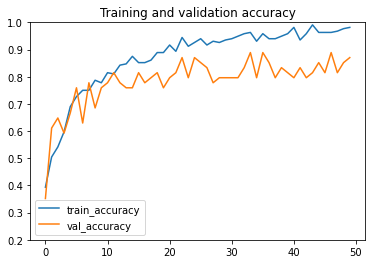

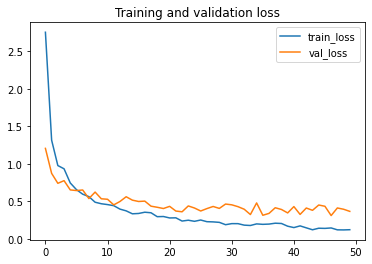

2/2 [==============================] - 1s 212ms/step - loss: 0.3383 - accuracy: 0.7963
{'loss': 0.33832117915153503, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/50
7/7 [==============================] - 7s 651ms/step - loss: 1.7274 - accuracy: 0.4491 - val_loss: 0.8748 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_2.h5
Epoch 2/50
7/7 [==============================] - 4s 483ms/step - loss: 1.0611 - accuracy: 0.5509 - val_loss: 1.0626 - val_accuracy: 0.5000

Epoch 00002: val_accuracy did not improve from 0.55556
Epoch 3/50
7/7 [==============================] - 4s 507ms/step - loss: 0.8693 - accuracy: 0.6528 - val_loss: 0.8485 - val_accuracy: 0.5741

Epoch 00003: val_accuracy improved from 0.55556 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_mo

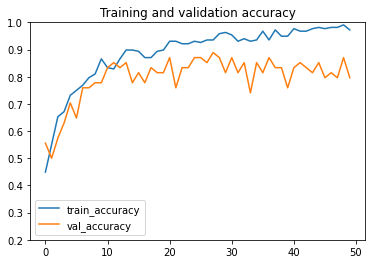

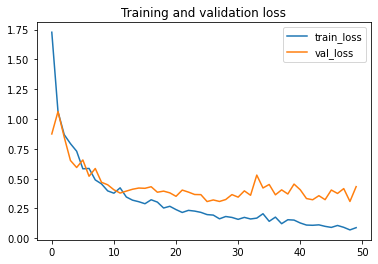

2/2 [==============================] - 1s 235ms/step - loss: 0.3395 - accuracy: 0.8704
{'loss': 0.3395410478115082, 'accuracy': 0.8703703880310059}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/50
7/7 [==============================] - 7s 658ms/step - loss: 1.8485 - accuracy: 0.3519 - val_loss: 0.9744 - val_accuracy: 0.3519

Epoch 00001: val_accuracy improved from -inf to 0.35185, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_3.h5
Epoch 2/50
7/7 [==============================] - 3s 489ms/step - loss: 1.0776 - accuracy: 0.4583 - val_loss: 0.6953 - val_accuracy: 0.6852

Epoch 00002: val_accuracy improved from 0.35185 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_3.h5
Epoch 3/50
7/7 [==============================] - 4s 525ms/step - loss: 0.8467 - accuracy: 0.6250 - val_loss: 0.6397 - val_accuracy: 0.7222

Epoch 00003: val_accuracy improved fr

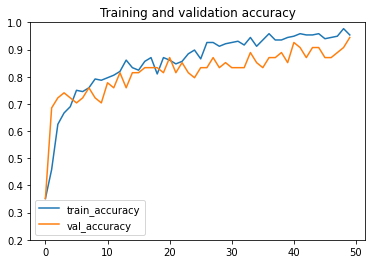

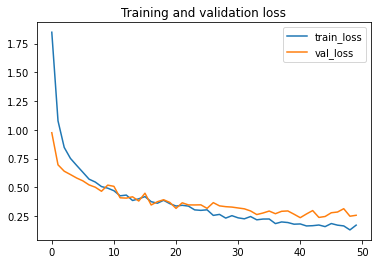

2/2 [==============================] - 1s 241ms/step - loss: 0.2352 - accuracy: 0.9074
{'loss': 0.23522822558879852, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/50
7/7 [==============================] - 7s 640ms/step - loss: 1.7639 - accuracy: 0.3704 - val_loss: 1.1282 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_4.h5
Epoch 2/50
7/7 [==============================] - 3s 463ms/step - loss: 1.2248 - accuracy: 0.5046 - val_loss: 0.8185 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.55556 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_4.h5
Epoch 3/50
7/7 [==============================] - 4s 538ms/step - loss: 0.8335 - accuracy: 0.6250 - val_loss: 0.7906 - val_accuracy: 0.6852

Epoch 00003: val_accuracy improved f


Epoch 00038: val_accuracy did not improve from 0.81481
Epoch 39/50
7/7 [==============================] - 3s 463ms/step - loss: 0.1383 - accuracy: 0.9583 - val_loss: 0.5284 - val_accuracy: 0.7963

Epoch 00039: val_accuracy did not improve from 0.81481
Epoch 40/50
7/7 [==============================] - 4s 564ms/step - loss: 0.1400 - accuracy: 0.9722 - val_loss: 0.5530 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.81481
Epoch 41/50
7/7 [==============================] - 4s 556ms/step - loss: 0.1545 - accuracy: 0.9352 - val_loss: 0.5443 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.81481
Epoch 42/50
7/7 [==============================] - 4s 495ms/step - loss: 0.1112 - accuracy: 0.9769 - val_loss: 0.5809 - val_accuracy: 0.7778

Epoch 00042: val_accuracy did not improve from 0.81481
Epoch 43/50
7/7 [==============================] - 4s 493ms/step - loss: 0.1434 - accuracy: 0.9583 - val_loss: 0.4859 - val_accuracy: 0.8148

Epoch 00043: v

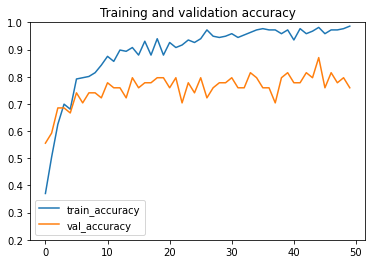

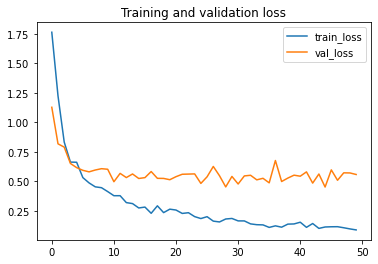

2/2 [==============================] - 1s 236ms/step - loss: 0.4846 - accuracy: 0.7778
{'loss': 0.48459774255752563, 'accuracy': 0.7777777910232544}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/50
7/7 [==============================] - 8s 724ms/step - loss: 2.5024 - accuracy: 0.3380 - val_loss: 0.9701 - val_accuracy: 0.6111

Epoch 00001: val_accuracy improved from -inf to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_5.h5
Epoch 2/50
7/7 [==============================] - 4s 535ms/step - loss: 1.2615 - accuracy: 0.5093 - val_loss: 0.7976 - val_accuracy: 0.6296

Epoch 00002: val_accuracy improved from 0.61111 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_22\model_5.h5
Epoch 3/50
7/7 [==============================] - 4s 558ms/step - loss: 1.1341 - accuracy: 0.5648 - val_loss: 0.8520 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved f

7/7 [==============================] - 3s 458ms/step - loss: 0.1713 - accuracy: 0.9491 - val_loss: 0.3520 - val_accuracy: 0.7963

Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/50
7/7 [==============================] - 4s 526ms/step - loss: 0.2113 - accuracy: 0.9444 - val_loss: 0.3927 - val_accuracy: 0.8333

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/50
7/7 [==============================] - 4s 595ms/step - loss: 0.1659 - accuracy: 0.9491 - val_loss: 0.3703 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/50
7/7 [==============================] - 3s 465ms/step - loss: 0.1676 - accuracy: 0.9630 - val_loss: 0.3467 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/50
7/7 [==============================] - 3s 462ms/step - loss: 0.1407 - accuracy: 0.9676 - val_loss: 0.4626 - val_accuracy: 0.8148

Epoch 00042: val_accuracy did not improve from 0.87037
Epoch 43/50
7/7 [==========

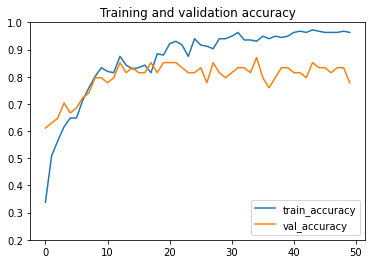

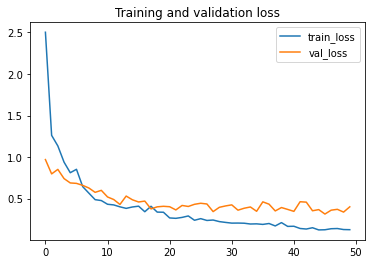

2/2 [==============================] - 1s 200ms/step - loss: 0.3522 - accuracy: 0.9074
{'loss': 0.3521804213523865, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
7/7 [==============================] - 8s 797ms/step - loss: 1.1748 - accuracy: 0.3981 - val_loss: 1.1042 - val_accuracy: 0.4630

Epoch 00001: val_accuracy improved from -inf to 0.46296, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
7/7 [==============================] - 4s 523ms/step - loss: 0.9480 - accuracy: 0.5417 - val_loss: 0.9933 - val_accuracy: 0.4815

Epoch 00002: val_accuracy improved from 0.46296 to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_1.h5
Epoch 3/100
7/7 [==============================] - 4s 566ms/step - loss: 0.9169 - accuracy: 0.5509 - val_loss: 0.8445 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved from 0.48148 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_1.h5
Epoch 4/100
7/7 [==============================] - 4s 531ms/step - loss: 0.8714 - accuracy: 0.5787 - val_loss: 0.8799 - val_accuracy: 0.6296

Epoch 00004: val_accuracy improved from 0.61111 to 0.62963, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_1.h5
Epoch 5/100
7/7 [==============================] - 4s 565ms/step - loss: 0.8248 - accuracy: 0.6343 - val_loss: 0.7602 - val_accuracy: 0.6296

Epoch 00005: val_accuracy did not impro

7/7 [==============================] - 4s 568ms/step - loss: 0.3406 - accuracy: 0.8750 - val_loss: 0.4812 - val_accuracy: 0.8333

Epoch 00041: val_accuracy improved from 0.81481 to 0.83333, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_1.h5
Epoch 42/100
7/7 [==============================] - 4s 524ms/step - loss: 0.3515 - accuracy: 0.8843 - val_loss: 0.4677 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.83333
Epoch 43/100
7/7 [==============================] - 4s 574ms/step - loss: 0.3183 - accuracy: 0.8981 - val_loss: 0.5664 - val_accuracy: 0.7593

Epoch 00043: val_accuracy did not improve from 0.83333
Epoch 44/100
7/7 [==============================] - 4s 565ms/step - loss: 0.3274 - accuracy: 0.8796 - val_loss: 0.4587 - val_accuracy: 0.8148

Epoch 00044: val_accuracy did not improve from 0.83333
Epoch 45/100
7/7 [==============================] - 4s 553ms/step - loss: 0.3527 - accuracy: 0.8565 - val_loss: 0.5066 - val_accuracy: 0.7593

Ep


Epoch 00081: val_accuracy did not improve from 0.87037
Epoch 82/100
7/7 [==============================] - 3s 460ms/step - loss: 0.1869 - accuracy: 0.9537 - val_loss: 0.3890 - val_accuracy: 0.8333

Epoch 00082: val_accuracy did not improve from 0.87037
Epoch 83/100
7/7 [==============================] - 4s 513ms/step - loss: 0.2062 - accuracy: 0.9259 - val_loss: 0.4840 - val_accuracy: 0.7963

Epoch 00083: val_accuracy did not improve from 0.87037
Epoch 84/100
7/7 [==============================] - 4s 570ms/step - loss: 0.1904 - accuracy: 0.9583 - val_loss: 0.4158 - val_accuracy: 0.8519

Epoch 00084: val_accuracy did not improve from 0.87037
Epoch 85/100
7/7 [==============================] - 4s 563ms/step - loss: 0.1815 - accuracy: 0.9491 - val_loss: 0.4153 - val_accuracy: 0.7963

Epoch 00085: val_accuracy did not improve from 0.87037
Epoch 86/100
7/7 [==============================] - 4s 564ms/step - loss: 0.2456 - accuracy: 0.9213 - val_loss: 0.3809 - val_accuracy: 0.8333

Epoch 000

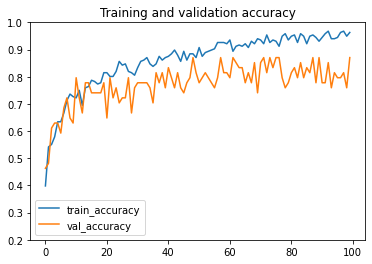

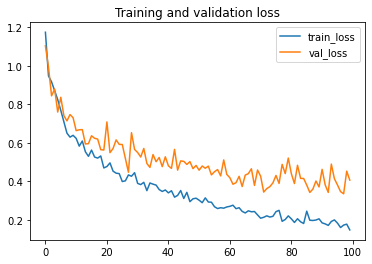

2/2 [==============================] - 1s 236ms/step - loss: 0.4146 - accuracy: 0.8148
{'loss': 0.4146144390106201, 'accuracy': 0.8148148059844971}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
7/7 [==============================] - 7s 659ms/step - loss: 1.4469 - accuracy: 0.4074 - val_loss: 1.0686 - val_accuracy: 0.4815

Epoch 00001: val_accuracy improved from -inf to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_2.h5
Epoch 2/100
7/7 [==============================] - 4s 528ms/step - loss: 1.0804 - accuracy: 0.4815 - val_loss: 0.8325 - val_accuracy: 0.5370

Epoch 00002: val_accuracy improved from 0.48148 to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_2.h5
Epoch 3/100
7/7 [==============================] - 4s 501ms/step - loss: 0.9207 - accuracy: 0.5741 - val_loss: 0.8441 - val_accuracy: 0.5370

Epoch 00003: val_accuracy did not 

7/7 [==============================] - 4s 547ms/step - loss: 0.3853 - accuracy: 0.8426 - val_loss: 0.5386 - val_accuracy: 0.6852

Epoch 00037: val_accuracy did not improve from 0.87037
Epoch 38/100
7/7 [==============================] - 3s 475ms/step - loss: 0.3739 - accuracy: 0.8750 - val_loss: 0.5243 - val_accuracy: 0.7593

Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/100
7/7 [==============================] - 4s 510ms/step - loss: 0.3603 - accuracy: 0.8657 - val_loss: 0.4725 - val_accuracy: 0.7593

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
7/7 [==============================] - 3s 459ms/step - loss: 0.3419 - accuracy: 0.8750 - val_loss: 0.4763 - val_accuracy: 0.7778

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
7/7 [==============================] - 4s 538ms/step - loss: 0.3335 - accuracy: 0.8796 - val_loss: 0.5248 - val_accuracy: 0.7778

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
7/7 [=====

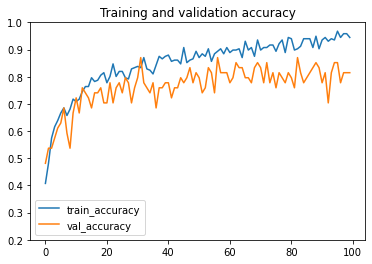

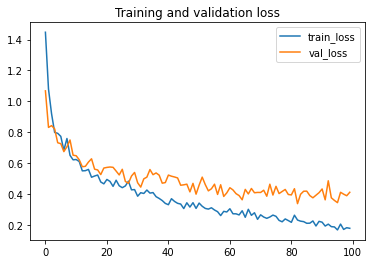

2/2 [==============================] - 1s 237ms/step - loss: 0.5171 - accuracy: 0.7222
{'loss': 0.5171192288398743, 'accuracy': 0.7222222089767456}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
7/7 [==============================] - 7s 647ms/step - loss: 1.3548 - accuracy: 0.3704 - val_loss: 1.0133 - val_accuracy: 0.5370

Epoch 00001: val_accuracy improved from -inf to 0.53704, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_3.h5
Epoch 2/100
7/7 [==============================] - 3s 465ms/step - loss: 1.0678 - accuracy: 0.4630 - val_loss: 0.7864 - val_accuracy: 0.6852

Epoch 00002: val_accuracy improved from 0.53704 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_3.h5
Epoch 3/100
7/7 [==============================] - 4s 554ms/step - loss: 0.9120 - accuracy: 0.5880 - val_loss: 0.7733 - val_accuracy: 0.6852

Epoch 00003: val_accuracy did not 


Epoch 00078: val_accuracy did not improve from 0.88889
Epoch 79/100
7/7 [==============================] - 4s 574ms/step - loss: 0.2348 - accuracy: 0.9259 - val_loss: 0.3135 - val_accuracy: 0.9074

Epoch 00079: val_accuracy improved from 0.88889 to 0.90741, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_3.h5
Epoch 80/100
7/7 [==============================] - 3s 462ms/step - loss: 0.2188 - accuracy: 0.9259 - val_loss: 0.3178 - val_accuracy: 0.8519

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
7/7 [==============================] - 4s 544ms/step - loss: 0.2163 - accuracy: 0.9259 - val_loss: 0.3356 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
7/7 [==============================] - 4s 558ms/step - loss: 0.2647 - accuracy: 0.9259 - val_loss: 0.3086 - val_accuracy: 0.8519

Epoch 00082: val_accuracy did not improve from 0.90741
Epoch 83/100
7/7 [==============================] - 4s 470ms/step - loss: 0.

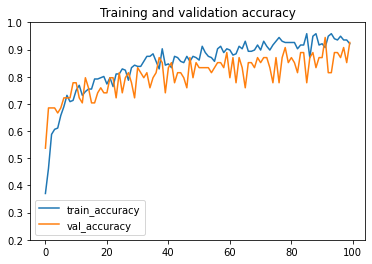

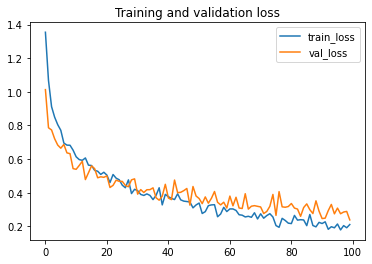

2/2 [==============================] - 1s 198ms/step - loss: 0.2618 - accuracy: 0.9074
{'loss': 0.2617916762828827, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
7/7 [==============================] - 8s 776ms/step - loss: 1.3759 - accuracy: 0.3565 - val_loss: 1.0928 - val_accuracy: 0.4444

Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_4.h5
Epoch 2/100
7/7 [==============================] - 3s 486ms/step - loss: 1.1037 - accuracy: 0.4861 - val_loss: 0.9079 - val_accuracy: 0.6111

Epoch 00002: val_accuracy improved from 0.44444 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_4.h5
Epoch 3/100
7/7 [==============================] - 4s 526ms/step - loss: 0.9954 - accuracy: 0.5602 - val_loss: 0.9778 - val_accuracy: 0.5000

Epoch 00003: val_accuracy did not 


Epoch 00037: val_accuracy did not improve from 0.83333
Epoch 38/100
7/7 [==============================] - 4s 576ms/step - loss: 0.3740 - accuracy: 0.8843 - val_loss: 0.6278 - val_accuracy: 0.7593

Epoch 00038: val_accuracy did not improve from 0.83333
Epoch 39/100
7/7 [==============================] - 4s 562ms/step - loss: 0.3467 - accuracy: 0.9074 - val_loss: 0.5755 - val_accuracy: 0.7593

Epoch 00039: val_accuracy did not improve from 0.83333
Epoch 40/100
7/7 [==============================] - 4s 600ms/step - loss: 0.3851 - accuracy: 0.8565 - val_loss: 0.5936 - val_accuracy: 0.7963

Epoch 00040: val_accuracy did not improve from 0.83333
Epoch 41/100
7/7 [==============================] - 4s 564ms/step - loss: 0.3603 - accuracy: 0.8981 - val_loss: 0.5559 - val_accuracy: 0.7407

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/100
7/7 [==============================] - 4s 572ms/step - loss: 0.3141 - accuracy: 0.8843 - val_loss: 0.5567 - val_accuracy: 0.7593

Epoch 000

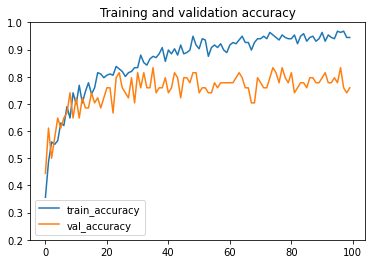

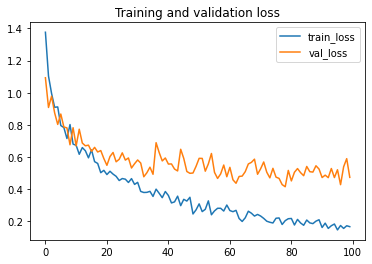

2/2 [==============================] - 1s 241ms/step - loss: 0.6323 - accuracy: 0.7407
{'loss': 0.6322724223136902, 'accuracy': 0.7407407164573669}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
7/7 [==============================] - 8s 844ms/step - loss: 1.3106 - accuracy: 0.3843 - val_loss: 0.9792 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_5.h5
Epoch 2/100
7/7 [==============================] - 4s 517ms/step - loss: 1.0233 - accuracy: 0.5046 - val_loss: 0.9138 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.51852 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_23\model_5.h5
Epoch 3/100
7/7 [==============================] - 4s 499ms/step - loss: 0.9060 - accuracy: 0.5787 - val_loss: 0.8356 - val_accuracy: 0.7407

Epoch 00003: val_accuracy improved

7/7 [==============================] - 4s 572ms/step - loss: 0.2299 - accuracy: 0.9352 - val_loss: 0.4005 - val_accuracy: 0.8148

Epoch 00079: val_accuracy did not improve from 0.88889
Epoch 80/100
7/7 [==============================] - 4s 535ms/step - loss: 0.2247 - accuracy: 0.9306 - val_loss: 0.4522 - val_accuracy: 0.7963

Epoch 00080: val_accuracy did not improve from 0.88889
Epoch 81/100
7/7 [==============================] - 3s 463ms/step - loss: 0.2016 - accuracy: 0.9398 - val_loss: 0.4050 - val_accuracy: 0.8519

Epoch 00081: val_accuracy did not improve from 0.88889
Epoch 82/100
7/7 [==============================] - 4s 502ms/step - loss: 0.2151 - accuracy: 0.9398 - val_loss: 0.3621 - val_accuracy: 0.8519

Epoch 00082: val_accuracy did not improve from 0.88889
Epoch 83/100
7/7 [==============================] - 4s 575ms/step - loss: 0.2005 - accuracy: 0.9630 - val_loss: 0.4414 - val_accuracy: 0.8148

Epoch 00083: val_accuracy did not improve from 0.88889
Epoch 84/100
7/7 [=====

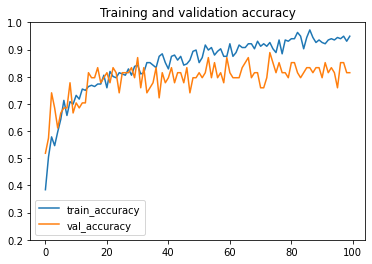

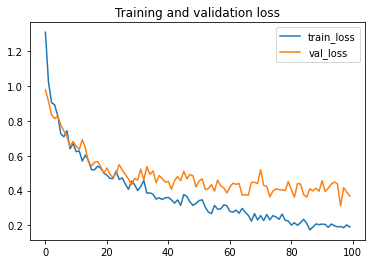

2/2 [==============================] - 1s 198ms/step - loss: 0.4318 - accuracy: 0.7963
{'loss': 0.431816041469574, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 1
Epoch 1/100
7/7 [==============================] - 7s 647ms/step - loss: 2.0489 - accuracy: 0.3704 - val_loss: 0.9655 - val_accuracy: 0.5556

Epoch 00001: val_accuracy improved from -inf to 0.55556, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_1.h5


C:\Users\user\anaconda3\envs\tensorflow25\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/100
7/7 [==============================] - 4s 520ms/step - loss: 1.2920 - accuracy: 0.4630 - val_loss: 1.0301 - val_accuracy: 0.4815

Epoch 00002: val_accuracy did not improve from 0.55556
Epoch 3/100
7/7 [==============================] - 4s 567ms/step - loss: 1.1092 - accuracy: 0.5648 - val_loss: 0.8428 - val_accuracy: 0.6111

Epoch 00003: val_accuracy improved from 0.55556 to 0.61111, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_1.h5
Epoch 4/100
7/7 [==============================] - 3s 492ms/step - loss: 0.8324 - accuracy: 0.6713 - val_loss: 0.7475 - val_accuracy: 0.6852

Epoch 00004: val_accuracy improved from 0.61111 to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_1.h5
Epoch 5/100
7/7 [==============================] - 3s 483ms/step - loss: 0.6417 - accuracy: 0.7315 - val_loss: 0.6351 - val_accuracy: 0.7407

Epoch 00005: val_accuracy improved from 0.68519 to 0.74074, saving model to C:/Users/user/Desktop/Model/saved_model

7/7 [==============================] - 4s 548ms/step - loss: 0.0665 - accuracy: 0.9815 - val_loss: 0.4243 - val_accuracy: 0.7778

Epoch 00080: val_accuracy did not improve from 0.90741
Epoch 81/100
7/7 [==============================] - 4s 574ms/step - loss: 0.0665 - accuracy: 0.9907 - val_loss: 0.2914 - val_accuracy: 0.8704

Epoch 00081: val_accuracy did not improve from 0.90741
Epoch 82/100
7/7 [==============================] - 4s 501ms/step - loss: 0.0792 - accuracy: 0.9861 - val_loss: 0.2344 - val_accuracy: 0.9259

Epoch 00082: val_accuracy improved from 0.90741 to 0.92593, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_1.h5
Epoch 83/100
7/7 [==============================] - 4s 502ms/step - loss: 0.0757 - accuracy: 0.9907 - val_loss: 0.3100 - val_accuracy: 0.8889

Epoch 00083: val_accuracy did not improve from 0.92593
Epoch 84/100
7/7 [==============================] - 4s 483ms/step - loss: 0.0534 - accuracy: 0.9954 - val_loss: 0.2902 - val_accuracy: 0.8889

Ep

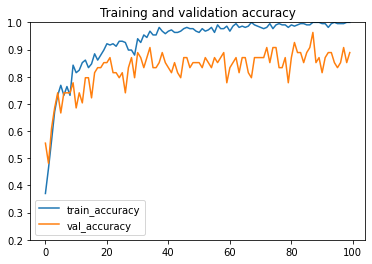

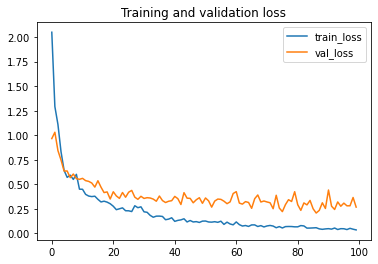

2/2 [==============================] - 1s 198ms/step - loss: 0.3127 - accuracy: 0.8333
{'loss': 0.3126743733882904, 'accuracy': 0.8333333134651184}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 2
Epoch 1/100
7/7 [==============================] - 9s 811ms/step - loss: 1.8118 - accuracy: 0.4120 - val_loss: 0.7574 - val_accuracy: 0.6852

Epoch 00001: val_accuracy improved from -inf to 0.68519, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_2.h5
Epoch 2/100
7/7 [==============================] - 4s 563ms/step - loss: 1.0421 - accuracy: 0.6481 - val_loss: 0.7589 - val_accuracy: 0.5741

Epoch 00002: val_accuracy did not improve from 0.68519
Epoch 3/100
7/7 [==============================] - 4s 490ms/step - loss: 0.8584 - accuracy: 0.6713 - val_loss: 0.7409 - val_accuracy: 0.6481

Epoch 00003: val_accuracy did not improve from 0.68519
Epoch 4/100
7/7 [==============================] - 4s 5


Epoch 00038: val_accuracy did not improve from 0.87037
Epoch 39/100
7/7 [==============================] - 4s 543ms/step - loss: 0.1161 - accuracy: 0.9630 - val_loss: 0.3739 - val_accuracy: 0.8519

Epoch 00039: val_accuracy did not improve from 0.87037
Epoch 40/100
7/7 [==============================] - 4s 567ms/step - loss: 0.1495 - accuracy: 0.9491 - val_loss: 0.4043 - val_accuracy: 0.7778

Epoch 00040: val_accuracy did not improve from 0.87037
Epoch 41/100
7/7 [==============================] - 3s 458ms/step - loss: 0.1024 - accuracy: 0.9815 - val_loss: 0.3609 - val_accuracy: 0.8519

Epoch 00041: val_accuracy did not improve from 0.87037
Epoch 42/100
7/7 [==============================] - 4s 572ms/step - loss: 0.1274 - accuracy: 0.9722 - val_loss: 0.4001 - val_accuracy: 0.7963

Epoch 00042: val_accuracy did not improve from 0.87037
Epoch 43/100
7/7 [==============================] - 4s 493ms/step - loss: 0.1091 - accuracy: 0.9676 - val_loss: 0.3331 - val_accuracy: 0.8148

Epoch 000

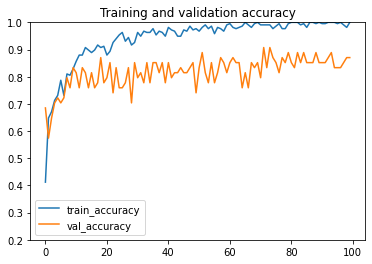

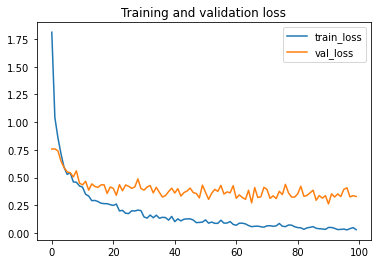

2/2 [==============================] - 1s 247ms/step - loss: 0.3983 - accuracy: 0.8519
{'loss': 0.3983275890350342, 'accuracy': 0.8518518805503845}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 3
Epoch 1/100
7/7 [==============================] - 8s 719ms/step - loss: 1.9181 - accuracy: 0.3843 - val_loss: 0.8999 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_3.h5
Epoch 2/100
7/7 [==============================] - 3s 460ms/step - loss: 1.1021 - accuracy: 0.4907 - val_loss: 0.6983 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.51852 to 0.66667, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_3.h5
Epoch 3/100
7/7 [==============================] - 3s 473ms/step - loss: 1.0553 - accuracy: 0.5787 - val_loss: 0.6168 - val_accuracy: 0.7593

Epoch 00003: val_accuracy improved


Epoch 00078: val_accuracy did not improve from 0.94444
Epoch 79/100
7/7 [==============================] - 4s 557ms/step - loss: 0.0805 - accuracy: 0.9907 - val_loss: 0.2246 - val_accuracy: 0.8889

Epoch 00079: val_accuracy did not improve from 0.94444
Epoch 80/100
7/7 [==============================] - 4s 552ms/step - loss: 0.0709 - accuracy: 0.9907 - val_loss: 0.2075 - val_accuracy: 0.9074

Epoch 00080: val_accuracy did not improve from 0.94444
Epoch 81/100
7/7 [==============================] - 4s 569ms/step - loss: 0.0619 - accuracy: 0.9861 - val_loss: 0.1561 - val_accuracy: 0.9259

Epoch 00081: val_accuracy did not improve from 0.94444
Epoch 82/100
7/7 [==============================] - 4s 556ms/step - loss: 0.0699 - accuracy: 0.9861 - val_loss: 0.1876 - val_accuracy: 0.9259

Epoch 00082: val_accuracy did not improve from 0.94444
Epoch 83/100
7/7 [==============================] - 4s 564ms/step - loss: 0.0815 - accuracy: 0.9769 - val_loss: 0.2363 - val_accuracy: 0.8704

Epoch 000

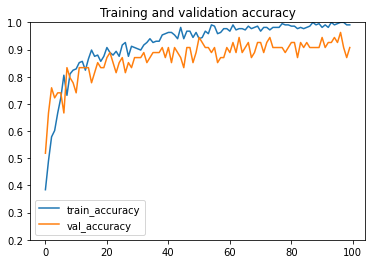

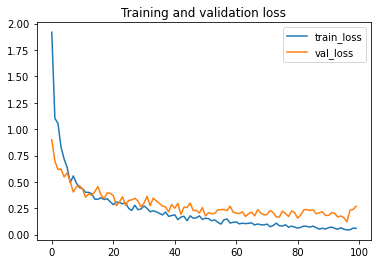

2/2 [==============================] - 1s 198ms/step - loss: 0.2076 - accuracy: 0.9074
{'loss': 0.20762459933757782, 'accuracy': 0.9074074029922485}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 4
Epoch 1/100
7/7 [==============================] - 7s 653ms/step - loss: 2.3716 - accuracy: 0.3657 - val_loss: 1.4341 - val_accuracy: 0.5185

Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_4.h5
Epoch 2/100
7/7 [==============================] - 4s 501ms/step - loss: 1.3030 - accuracy: 0.5185 - val_loss: 0.9185 - val_accuracy: 0.5741

Epoch 00002: val_accuracy improved from 0.51852 to 0.57407, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_4.h5
Epoch 3/100
7/7 [==============================] - 3s 465ms/step - loss: 1.0532 - accuracy: 0.5741 - val_loss: 0.7148 - val_accuracy: 0.6296

Epoch 00003: val_accuracy improve


Epoch 00037: val_accuracy did not improve from 0.83333
Epoch 38/100
7/7 [==============================] - 4s 573ms/step - loss: 0.1715 - accuracy: 0.9398 - val_loss: 0.4882 - val_accuracy: 0.7778

Epoch 00038: val_accuracy did not improve from 0.83333
Epoch 39/100
7/7 [==============================] - 4s 572ms/step - loss: 0.1403 - accuracy: 0.9722 - val_loss: 0.4908 - val_accuracy: 0.7963

Epoch 00039: val_accuracy did not improve from 0.83333
Epoch 40/100
7/7 [==============================] - 4s 573ms/step - loss: 0.1482 - accuracy: 0.9630 - val_loss: 0.4457 - val_accuracy: 0.8148

Epoch 00040: val_accuracy did not improve from 0.83333
Epoch 41/100
7/7 [==============================] - 4s 599ms/step - loss: 0.1060 - accuracy: 0.9769 - val_loss: 0.4541 - val_accuracy: 0.7963

Epoch 00041: val_accuracy did not improve from 0.83333
Epoch 42/100
7/7 [==============================] - 4s 580ms/step - loss: 0.1220 - accuracy: 0.9676 - val_loss: 0.4263 - val_accuracy: 0.7593

Epoch 000


Epoch 00078: val_accuracy did not improve from 0.85185
Epoch 79/100
7/7 [==============================] - 4s 550ms/step - loss: 0.0627 - accuracy: 0.9954 - val_loss: 0.4499 - val_accuracy: 0.8148

Epoch 00079: val_accuracy did not improve from 0.85185
Epoch 80/100
7/7 [==============================] - 4s 534ms/step - loss: 0.0535 - accuracy: 0.9907 - val_loss: 0.4543 - val_accuracy: 0.7963

Epoch 00080: val_accuracy did not improve from 0.85185
Epoch 81/100
7/7 [==============================] - 4s 579ms/step - loss: 0.0442 - accuracy: 1.0000 - val_loss: 0.4186 - val_accuracy: 0.8333

Epoch 00081: val_accuracy did not improve from 0.85185
Epoch 82/100
7/7 [==============================] - 4s 541ms/step - loss: 0.0462 - accuracy: 0.9954 - val_loss: 0.5181 - val_accuracy: 0.7593

Epoch 00082: val_accuracy did not improve from 0.85185
Epoch 83/100
7/7 [==============================] - 3s 464ms/step - loss: 0.0389 - accuracy: 0.9954 - val_loss: 0.4280 - val_accuracy: 0.8333

Epoch 000

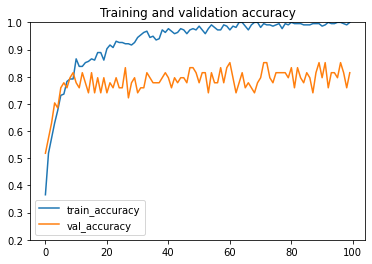

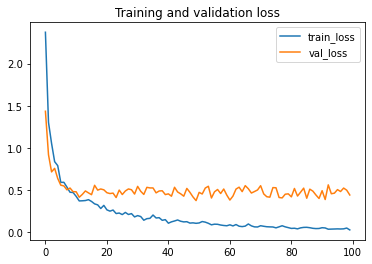

2/2 [==============================] - 1s 242ms/step - loss: 0.4568 - accuracy: 0.7963
{'loss': 0.4568256139755249, 'accuracy': 0.7962962985038757}
Found 216 validated image filenames belonging to 3 classes.
Found 54 validated image filenames belonging to 3 classes.
Fold number 5
Epoch 1/100
7/7 [==============================] - 8s 743ms/step - loss: 1.9164 - accuracy: 0.3889 - val_loss: 0.9681 - val_accuracy: 0.4815

Epoch 00001: val_accuracy improved from -inf to 0.48148, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_5.h5
Epoch 2/100
7/7 [==============================] - 3s 489ms/step - loss: 1.2646 - accuracy: 0.5833 - val_loss: 0.8814 - val_accuracy: 0.5926

Epoch 00002: val_accuracy improved from 0.48148 to 0.59259, saving model to C:/Users/user/Desktop/Model/saved_models_24\model_5.h5
Epoch 3/100
7/7 [==============================] - 4s 569ms/step - loss: 0.9467 - accuracy: 0.5880 - val_loss: 0.8692 - val_accuracy: 0.6481

Epoch 00003: val_accuracy improved


Epoch 00037: val_accuracy did not improve from 0.92593
Epoch 38/100
7/7 [==============================] - 4s 563ms/step - loss: 0.1556 - accuracy: 0.9491 - val_loss: 0.4022 - val_accuracy: 0.8333

Epoch 00038: val_accuracy did not improve from 0.92593
Epoch 39/100
7/7 [==============================] - 4s 506ms/step - loss: 0.1409 - accuracy: 0.9491 - val_loss: 0.4264 - val_accuracy: 0.8519

Epoch 00039: val_accuracy did not improve from 0.92593
Epoch 40/100
7/7 [==============================] - 4s 480ms/step - loss: 0.0969 - accuracy: 0.9769 - val_loss: 0.4631 - val_accuracy: 0.8333

Epoch 00040: val_accuracy did not improve from 0.92593
Epoch 41/100
7/7 [==============================] - 4s 538ms/step - loss: 0.1221 - accuracy: 0.9583 - val_loss: 0.4575 - val_accuracy: 0.8148

Epoch 00041: val_accuracy did not improve from 0.92593
Epoch 42/100
7/7 [==============================] - 4s 542ms/step - loss: 0.1137 - accuracy: 0.9630 - val_loss: 0.3570 - val_accuracy: 0.8704

Epoch 000

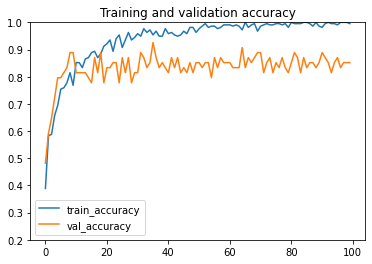

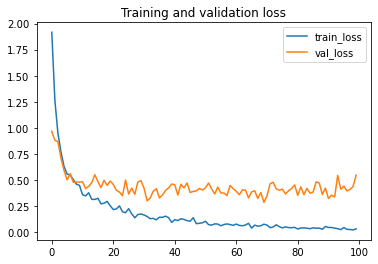

2/2 [==============================] - 1s 198ms/step - loss: 0.4177 - accuracy: 0.8148
{'loss': 0.4177379310131073, 'accuracy': 0.8148148059844971}


In [17]:
for x in range(len(batch_size_arr)):
    #for batch size values
    if len(param_arr) == 0:
        param_arr.append([])
    
    for y in range(len(num_epochs_arr)):
        #for epoch values
        if len(param_arr) == 1:
            param_arr.append([])
        
        for z in range(len(lr_arr)):
            #for learning rate values
            if len(param_arr) == 2:
                param_arr.append([])
            
            #append the values per combo
            param_arr[0].append(batch_size_arr[x])
            param_arr[1].append(num_epochs_arr[y])
            param_arr[2].append(lr_arr[z])
            
            VALIDATION_ACCURACY = []
            VALIDATION_LOSS = []
            
            #change save_dir value per combination
            save_dir = savemodel()
            fold_var = 1
            
            for train_index, val_index in skf.split(np.zeros(n),Y):

                training_data = df2.iloc[train_index]
                validation_data = df2.iloc[val_index]

                train_data_generator = imgdatagen.flow_from_dataframe(training_data, directory = image_dir,
                                           x_col = "filename", y_col = "label",
                                          class_mode = "categorical", target_size = dim, batch_size = batch_size_arr[x],
                                            shuffle = False)
                valid_data_generator  = imgdatagen.flow_from_dataframe(validation_data, directory = image_dir,
                                        x_col = "filename", y_col = "label",
                                        class_mode = "categorical", target_size = dim, batch_size = batch_size_arr[x],
                                            shuffle = False)
                
                full_model = model()
                # Compile the model
                full_model.compile(loss='categorical_crossentropy',
                              optimizer=keras.optimizers.Adamax(learning_rate=lr_arr[z]),
                              metrics=['accuracy']) #categorical_crossentropy cause it is more than 2 classes

                # Create callbacks
                checkpoint = tf.keras.callbacks.ModelCheckpoint((save_dir+"/"+ "model_" + str(fold_var) + ".h5"), 
                                        monitor='val_accuracy', verbose=1, 
                                        save_best_only=True, mode='max')
                callbacks_list = [checkpoint]
                # This saves the best model

                print("Fold number " + str(fold_var))

                # Fit the model
                history = full_model.fit(train_data_generator,
                                         epochs=num_epochs_arr[y],
                                         callbacks=callbacks_list,
                                         validation_data=valid_data_generator)

                #Plot the history
                plot_history(history, yrange=(0.2,1))

                # Load the best model instance to evaluate the performance of the model
                full_model.load_weights(save_dir+"/model_"+str(fold_var)+".h5")

                results = full_model.evaluate(valid_data_generator)
                results = dict(zip(full_model.metrics_names,results))

                print(results)

                VALIDATION_ACCURACY.append(results['accuracy'])
                VALIDATION_LOSS.append(results['loss'])

                tf.keras.backend.clear_session()

                fold_var += 1
                
            val_acc_arr.append(VALIDATION_ACCURACY)
            val_loss_arr.append(VALIDATION_LOSS)

In [22]:
#append means of accuracy and loss sets per combo
for x in range(len(val_acc_arr)):
    val_acc_means.append(np.mean(val_acc_arr[x]))                                
    val_loss_means.append(np.mean(val_loss_arr[x]))

### Display Values Per Combination of Parameters

We will put the combination of parameters and the resulting means of accuracy and loss together in a dataframe in order to display it nicely.

In [24]:
df_hyperparam = pd.DataFrame(list(zip(param_arr[0],param_arr[1],param_arr[2],val_acc_means,val_loss_means))
                             ,columns=['batch size','number of epoch', 'learning rate', 'accuracy', 'loss'])

df_hyperparam

,batch size,number of epoch,learning rate,accuracy,loss
0,4,20,0.00001,0.744444,0.547758
1,4,20,0.00010,0.803704,0.440496
2,4,50,0.00001,0.803704,0.423696
3,4,50,0.00010,0.807407,0.403251
4,4,100,0.00001,0.859259,0.367147
5,4,100,0.00010,0.866667,0.371921
6,8,20,0.00001,0.722222,0.579347
7,8,20,0.00010,0.803704,0.427825
8,8,50,0.00001,0.807407,0.415269
9,8,50,0.00010,0.829630,0.383192


### Best Accuracy

The combination that yielded the best results is then picked.

In [25]:
df_hyperparam.loc[df_hyperparam['accuracy'] == max(df_hyperparam['accuracy'])]

,batch size,number of epoch,learning rate,accuracy,loss
11,8,100,0.0001,0.874074,0.325164


In [26]:
stopper

NameError: name 'stopper' is not defined

## Kfold Evaluation Results

Below are the validation accuracy and validation loss per fold and their average of the best combination.

In [27]:
print("Validation Accuracy of All Folds:")
n = 1
for x in val_acc_arr[11]:
    print("Fold "+ str(n) +" Accuracy:",x)
    n=n+1    
print("Mean Validation Accuracy: " + str(np.mean(val_acc_arr[11])))

print("")

print("Validation Loss of All Folds:")
n=1
for x in val_loss_arr[11]:
    print("Fold "+ str(n) +" Loss:",x)
    n=n+1    
print("Mean Validation Loss: " + str(np.mean(val_loss_arr[11])))

Validation Accuracy of All Folds:
Fold 1 Accuracy: 0.8703703880310059
Fold 2 Accuracy: 0.8333333134651184
Fold 3 Accuracy: 0.9444444179534912
Fold 4 Accuracy: 0.8518518805503845
Fold 5 Accuracy: 0.8703703880310059
Mean Validation Accuracy: 0.8740740776062011

Validation Loss of All Folds:
Fold 1 Loss: 0.36771562695503235
Fold 2 Loss: 0.42924806475639343
Fold 3 Loss: 0.16552717983722687
Fold 4 Loss: 0.3264366388320923
Fold 5 Loss: 0.33689096570014954
Mean Validation Loss: 0.3251636952161789


In [ ]:
stopper

## Model Prediction and Evaluation

Load the images in the test set and predict what class it is in all models of the best combination. There are three values of confidence level. The one with the highest confidence level is the predicted class of the image. The order of classes is [0 1 2]. The results will be feed to the eval function defined below in order to get the metrics.

In [28]:
#make the labels to integer to get the model metrics
yt = pd.to_numeric(y_test['label'])

The content displayed are the metrics, roc auc of each class (balut/penoy,salted,table), and confusion matrix per fold, as well as the sum and mean of those confusion matrices and roc auc of each class for all folds.

In [29]:
#Metrics
def evaluate(yhat_probs, 
             yhat_classes, 
             total_acc, 
             total_precision, 
             total_recall, 
             total_f1_score, 
             matrix_sum,
             fold_num,
             fpr_total,
             tpr_total):

    # accuracy: (tp + tn) / (p + n)
    accuracy = accuracy_score(yt, yhat_classes)
    total_acc.append(accuracy)
    print('Accuracy: %f' % accuracy)
    # precision tp / (tp + fp)
    precision = precision_score(yt, yhat_classes, average="weighted")
    total_precision.append(precision)
    print('Precision: %f' % precision)
    # recall: tp / (tp + fn)
    recall = recall_score(yt, yhat_classes, average="weighted")
    total_recall.append(recall)
    print('Recall: %f' % recall)
    # f1: 2 tp / (2 tp + fp + fn)
    f1 = f1_score(yt, yhat_classes, average="weighted")
    total_f1_score.append(f1)
    print('F1 score: %f' % f1)
    
    #ROC AUC
    #-------------------------------------------------------------------------------
    # Binarize the true label
    ytbin = label_binarize(yt, classes=[0, 1, 2])
    n_classes = ytbin.shape[1]

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
      
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(ytbin[:, i], yhat_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
     
        if fold_num == 0:
            fpr_total.append([])

        fpr_total[i].append(fpr[i])
        
        if fold_num == 0:
            tpr_total.append([])

        tpr_total[i].append(tpr[i]) 

    # Compute micro-average ROC curve and ROC area
    fpr["macro"], tpr["macro"], _ = roc_curve(ytbin.ravel(), yhat_probs.ravel())
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.rcParams['axes.facecolor'] = 'white'
    plt.rcParams["axes.edgecolor"] = 'black'
    plt.rcParams["axes.linewidth"]  = 1.25
    
    #balut-penoy
    plt.figure()
    lw = 2
    plt.plot(fpr[0], tpr[0], color='darkorange',
             lw=lw, label='ROC curve (area = %0.4f)' % roc_auc[0])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Balut-Penoy Fold ' + str(fold_num+1))
    plt.legend(loc="lower right")
    plt.show()

    #salted egg
    plt.figure()
    lw = 2
    plt.plot(fpr[1], tpr[1], color='darkorange',
             lw=lw, label='ROC curve (area = %0.4f)' % roc_auc[1])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Salted Egg Fold ' + str(fold_num+1))
    plt.legend(loc="lower right")
    plt.show()

    #table egg
    plt.figure()
    lw = 2
    plt.plot(fpr[2], tpr[2], color='darkorange',
             lw=lw, label='ROC curve (area = %0.4f)' % roc_auc[2])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Table Egg Fold ' + str(fold_num+1))
    plt.legend(loc="lower right")
    plt.show()
    #-------------------------------------------------------------------------------
    
    #confusion matrix
    matrix = confusion_matrix(yt, yhat_classes)
    
    if len(total_acc) == 1:
        matrix_sum = matrix
    elif len(total_acc) > 1:
        matrix_sum = [[matrix_sum[i][j] + matrix[i][j]  
                       for j in range(len(matrix_sum[0]))] 
                      for i in range(len(matrix_sum))]
    
    df_cm = pd.DataFrame(matrix, range(matrix.shape[0]), range(matrix.shape[1]))
    df_cm = df_cm.rename(columns={0:'Balut/Penoy', 1:'Salted Egg', 2:'Table Egg'}, 
                         index={0:'Balut/Penoy', 1:'Salted Egg', 2:'Table Egg'})
    
    sn.set(font_scale=1.4) # for label size
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title('Confusion Matrix Fold ' + str(fold_num+1))
    plt.show()
    
    return total_acc, total_precision, total_recall, total_f1_score, matrix_sum, fpr_total, tpr_total

fold 1 metrics:
Accuracy: 0.933333
Precision: 0.936364
Recall: 0.933333
F1 score: 0.933250


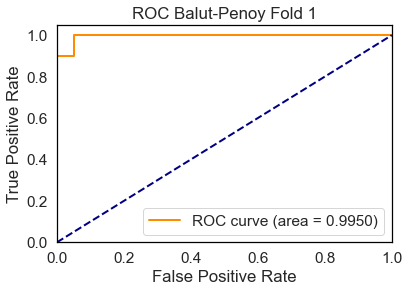

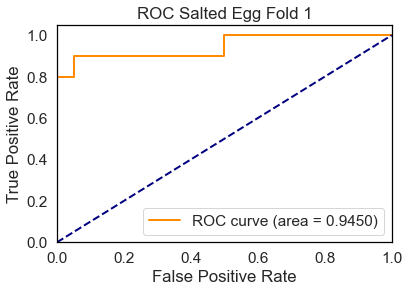

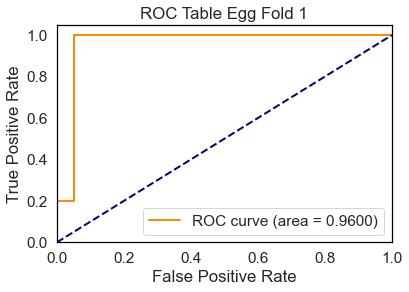

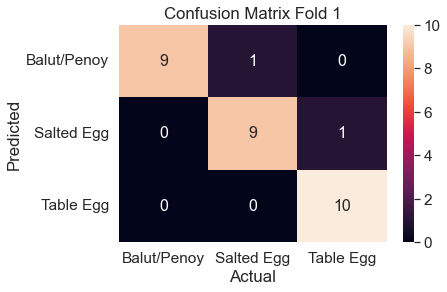


fold 2 metrics:
Accuracy: 0.900000
Precision: 0.907407
Recall: 0.900000
F1 score: 0.899522


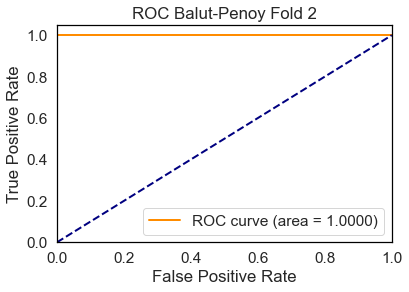

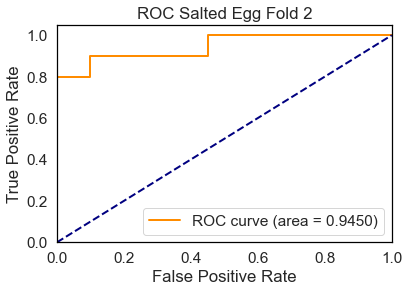

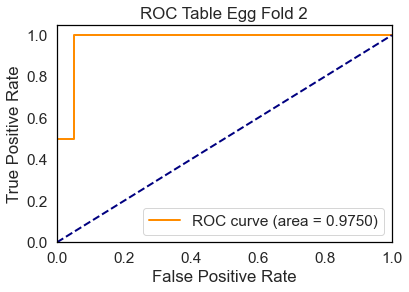

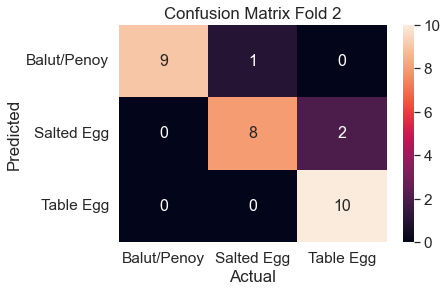


fold 3 metrics:
Accuracy: 0.900000
Precision: 0.907407
Recall: 0.900000
F1 score: 0.899522


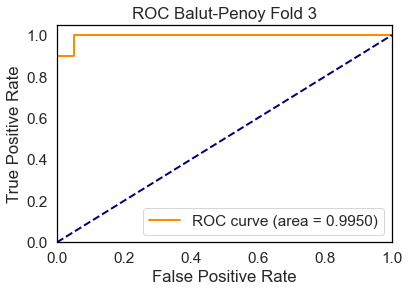

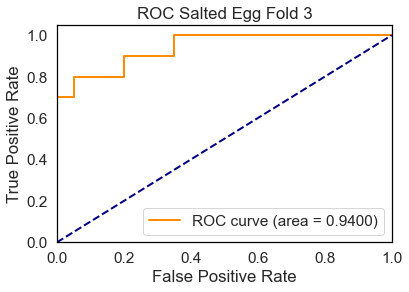

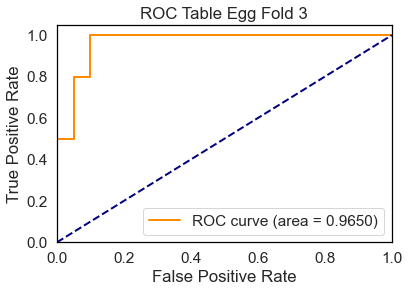

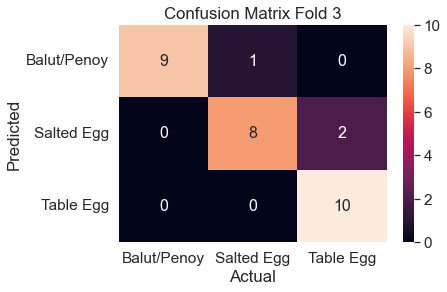


fold 4 metrics:
Accuracy: 0.833333
Precision: 0.848485
Recall: 0.833333
F1 score: 0.835979


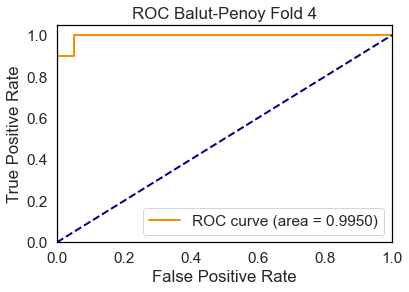

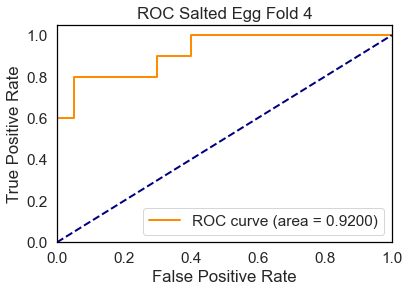

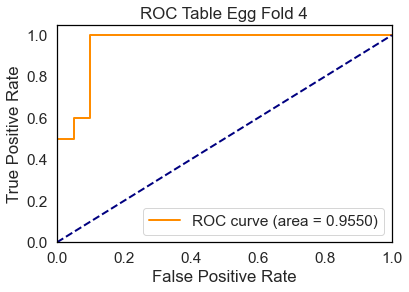

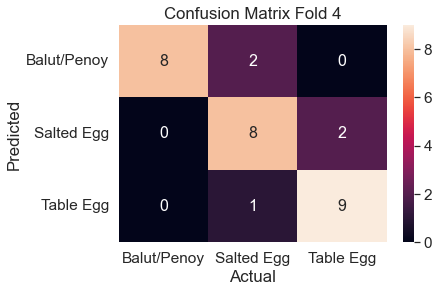


fold 5 metrics:
Accuracy: 0.933333
Precision: 0.936364
Recall: 0.933333
F1 score: 0.933250


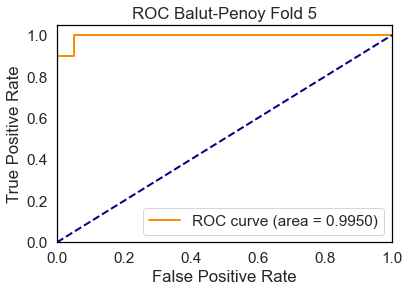

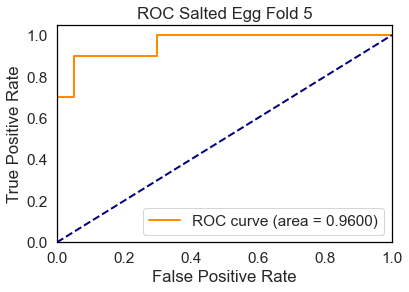

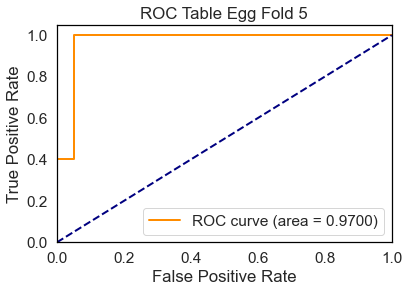

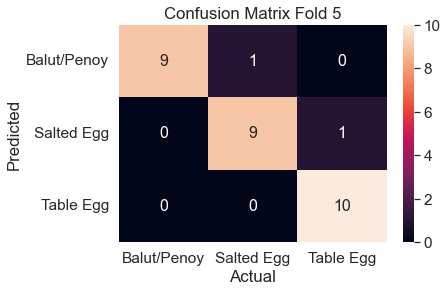

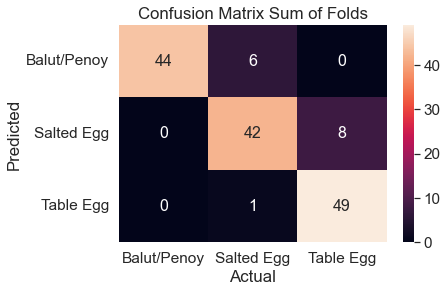

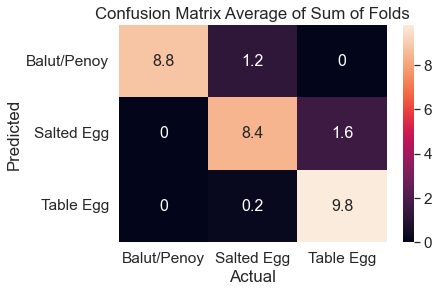

C:\Users\user\AppData\Local\Temp/ipykernel_6188/1893730839.py:146: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fpr_total = np.array(fpr_total)
C:\Users\user\AppData\Local\Temp/ipykernel_6188/1893730839.py:147: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  tpr_total = np.array(tpr_total)
C:\Users\user\AppData\Local\Temp/ipykernel_6188/1893730839.py:175: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


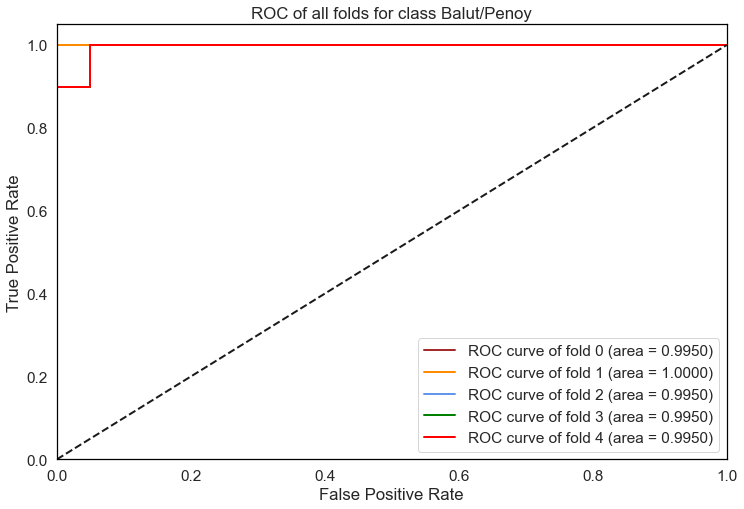

C:\Users\user\AppData\Local\Temp/ipykernel_6188/1893730839.py:175: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


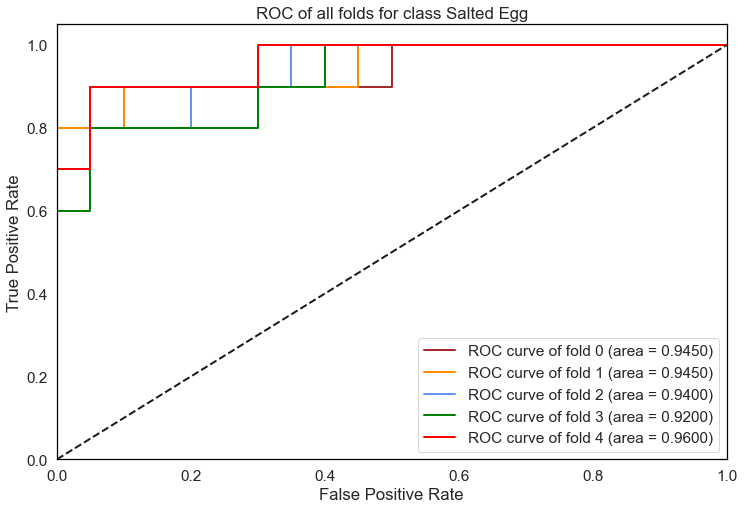

C:\Users\user\AppData\Local\Temp/ipykernel_6188/1893730839.py:175: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


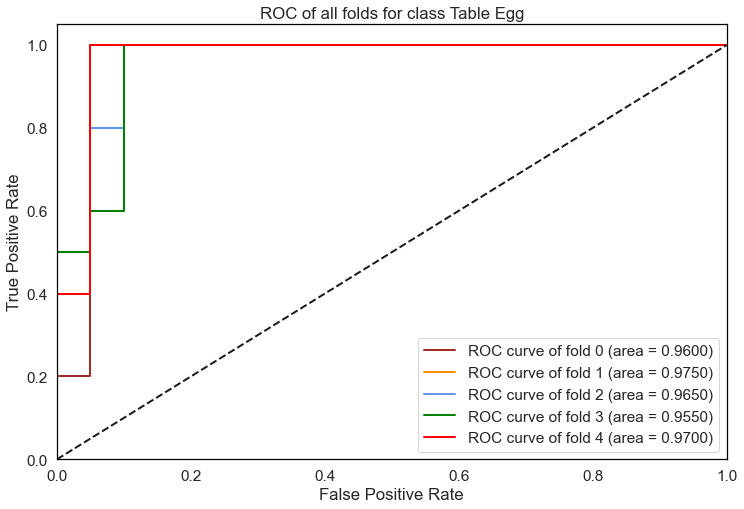

In [31]:
fold = 5
modelname = "saved_models_12"

#for fold number and average string
fold_ave = []

#for metrics values
total_acc = []
total_precision = []
total_recall = []
total_f1_score = []

#for confusion matrix sum of folds
matrix_sum = np.array([])

#for roc auc of folds per class
fpr_bp = []
tpr_bp = []

fpr_se = []
tpr_se = []

fpr_te = []
tpr_te = []

fpr_total = []
tpr_total = []

#for validating misclassified images
yhat_classes_total = []

for fold_num in range(fold):
    
    full_model = model()
    
    #load the weights of bet model
    model_dir = gen_dir + "/"+modelname+"/model_"+str(fold_num+1)+".h5"
    full_model.load_weights(model_dir)

    test_set = directory + "/ToBeUsed/test_set"

    testX = []

    for img_path in X_test['filename']:
        img = im.load_img(img_path, target_size=(224,224))
        x = im.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
        x = x.reshape(224,224,3)
        testX.append(x)

    testX = np.array(testX)    

    # predict probabilities for test set, y_test
    yhat_probs = full_model.predict(testX, verbose=0)

    # predict crisp classes for test set
    yhat_classes = yhat_probs.argmax(axis=-1)
    
    yhat_classes_total.append(yhat_classes)
    
    print("fold "+str(fold_num+1) +" metrics:")
    total_acc, total_precision, total_recall, total_f1_score, matrix_sum, fpr_total, tpr_total  = evaluate(yhat_probs,
                                                                                                           yhat_classes,
                                                                                                           total_acc,
                                                                                                           total_precision,
                                                                                                           total_recall,
                                                                                                           total_f1_score,
                                                                                                           matrix_sum,
                                                                                                           fold_num,
                                                                                                           fpr_total,
                                                                                                           tpr_total)
    
    fold_ave.append(str(fold_num+1))
    
    print('')

#Metrics
#-------------------------------------------------------------------------------------------------------------
fold_ave.append("Ave:")
total_acc.append(np.mean(total_acc))
total_precision.append(np.mean(total_precision))
total_recall.append(np.mean(total_recall))
total_f1_score.append(np.mean(total_recall))
    
df_eval = pd.DataFrame(data = list(zip(fold_ave,
                                       total_acc,
                                       total_precision,
                                       total_recall,
                                       total_f1_score)), columns=["Fold",
                                                                  "Accuracy",
                                                                  "Precision",
                                                                  "Recall",
                                                                  "F1 Score"])

#set fold_ave as the index
df_eval.set_index("Fold",inplace=True)

df_eval
#-------------------------------------------------------------------------------------------------------------

#Confusion Matrix
#-------------------------------------------------------------------------------------------------------------
#confusion matrix sum of folds
matrix_sum = np.array(matrix_sum)

df_cm = pd.DataFrame(matrix_sum, range(matrix_sum.shape[0]), range(matrix_sum.shape[1]))
df_cm = df_cm.rename(columns={0:'Balut/Penoy', 1:'Salted Egg', 2:'Table Egg'}, 
                     index={0:'Balut/Penoy', 1:'Salted Egg', 2:'Table Egg'})

# plt.figure(figsize=(10,7))
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Confusion Matrix Sum of Folds")
plt.show()

#confusion matrix ave of sum of folds
matrix_ave = [[matrix_sum[i][j]/fold 
               for j in range(len(matrix_sum[0]))] 
              for i in range(len(matrix_sum))]

matrix_ave = np.array(matrix_ave)

df_cm = pd.DataFrame(matrix_ave, range(matrix_ave.shape[0]), range(matrix_ave.shape[1]))
df_cm = df_cm.rename(columns={0:'Balut/Penoy', 1:'Salted Egg', 2:'Table Egg'}, 
                     index={0:'Balut/Penoy', 1:'Salted Egg', 2:'Table Egg'})

sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Confusion Matrix Average of Sum of Folds")
plt.show()
#-------------------------------------------------------------------------------------------------------------

#ROC AUC
#-------------------------------------------------------------------------------------------------------------
fpr_total = np.array(fpr_total)
tpr_total = np.array(tpr_total)

#print("fpr_total")
#print(fpr_total)
#print("\ntpr_total")
#print(tpr_total)

classes = ["Balut/Penoy","Salted Egg","Table Egg"]

for x in range(len(fpr_total)):
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(fold):
        fpr[i] = fpr_total[x][i]
        tpr[i] = tpr_total[x][i]
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(fold)]))
    
    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(fold):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= fold
   
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
    plt.rcParams['axes.facecolor'] = 'white'
    plt.rcParams["axes.edgecolor"] = 'black'
    plt.rcParams["axes.linewidth"]  = 1.25

    # Plot all ROC curves
    plt.figure(figsize=(12, 8))
    lw = 2
   
    colors = cycle(['brown', 'darkorange', 'cornflowerblue', 'green', 'red'])
    for i, color in zip(range(fold), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                 label='ROC curve of fold {0} (area = {1:0.4f})'
                 ''.format(i, roc_auc[i]))
    
    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC of all folds for class ' + classes[x])
    plt.legend(loc="lower right")
    plt.show()
#-------------------------------------------------------------------------------------------------------------

## Validating Misclassified Images

We will check whether or not the predicted classes of the images match with the true classes that they have. We will display the correct and incorrect predictions.

In [35]:
for yhat_classes in yhat_classes_total:
    print(yhat_classes.shape, yt.shape)

(30,) (30,)
(30,) (30,)
(30,) (30,)
(30,) (30,)
(30,) (30,)


We will get the images from the directories stored under the filename column.

In [32]:
testX2 = []

for img_path in X_test['filename']:
    img = cv2.imread(img_path)
    testX2.append(img)

testX2 = np.array(testX2)

### Correct predictions

Fold 1
Found 28 correct labels


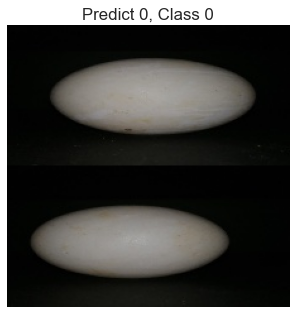

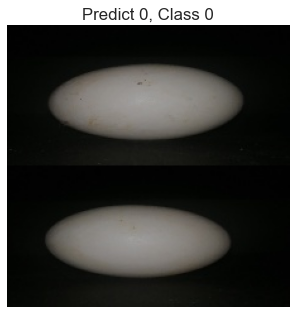

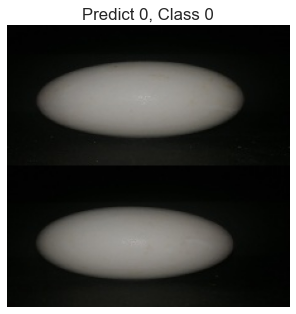

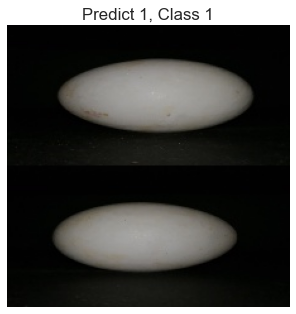

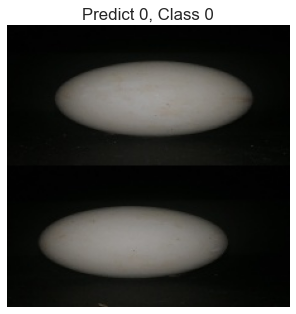

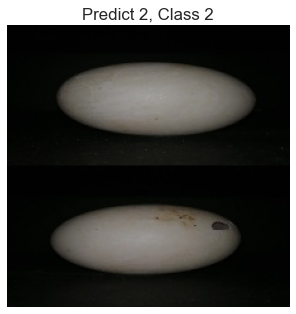

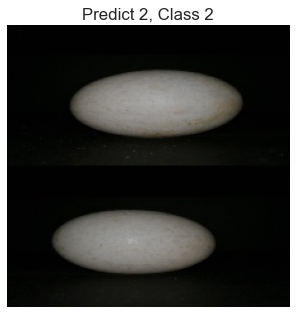

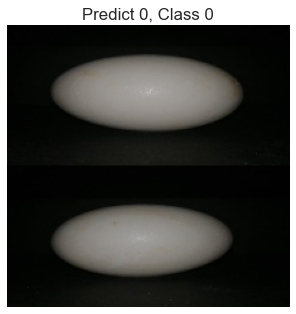

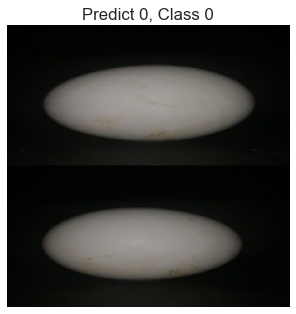

Fold 2
Found 27 correct labels


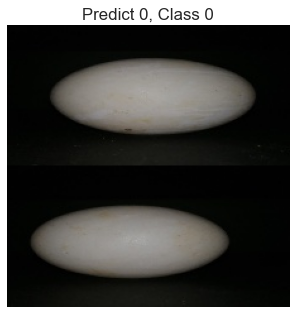

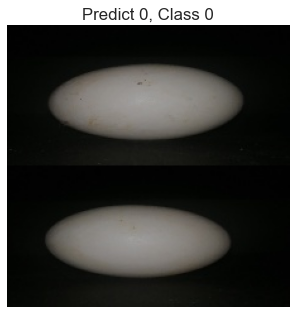

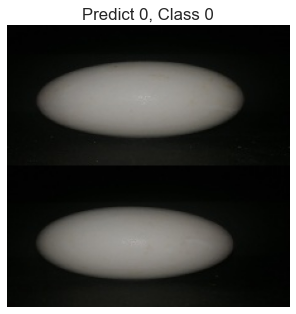

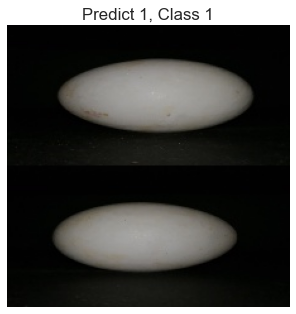

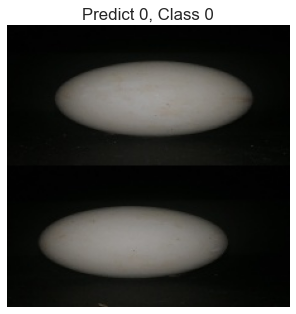

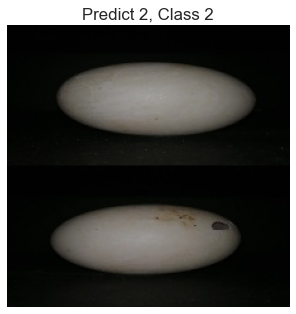

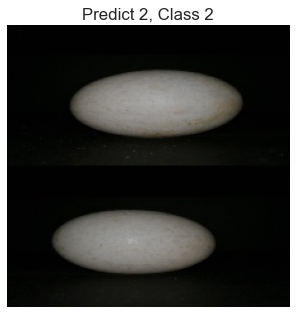

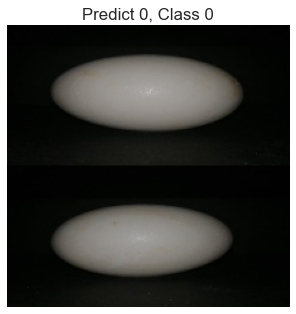

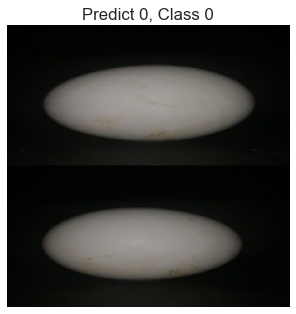

Fold 3
Found 27 correct labels


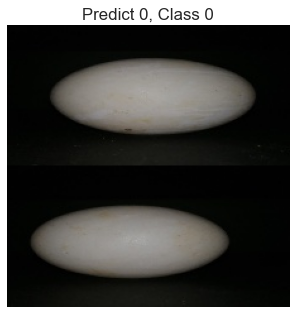

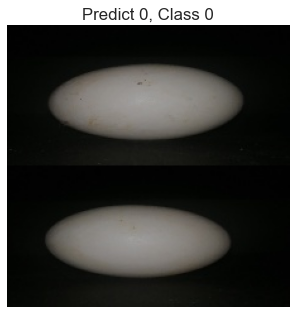

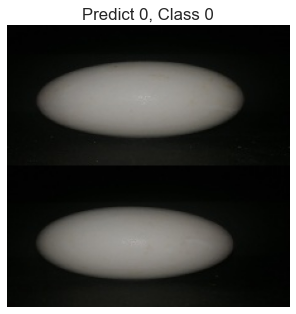

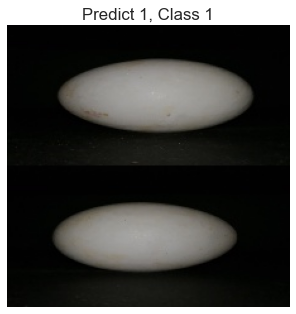

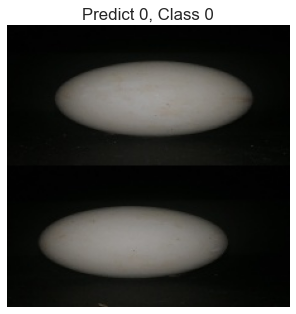

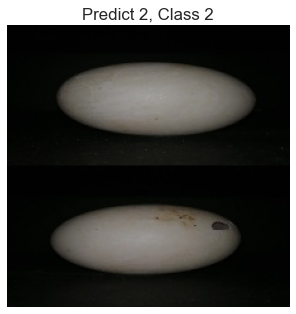

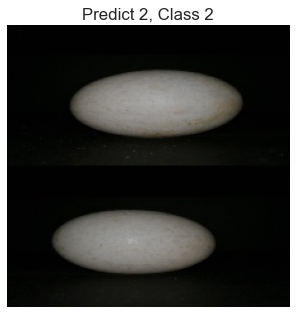

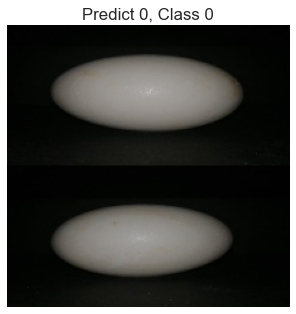

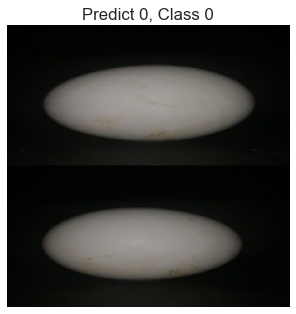

Fold 4
Found 25 correct labels


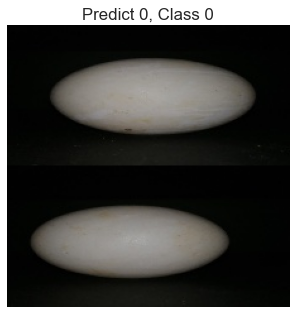

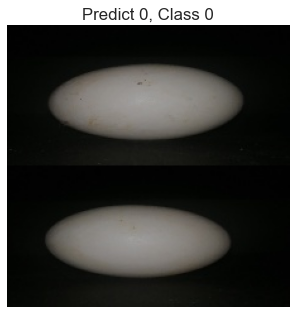

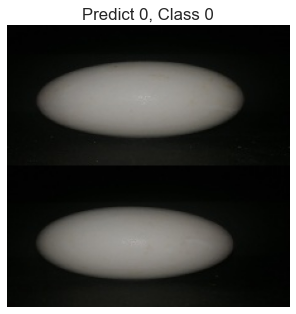

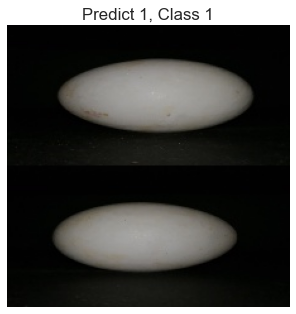

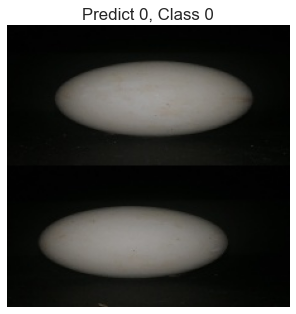

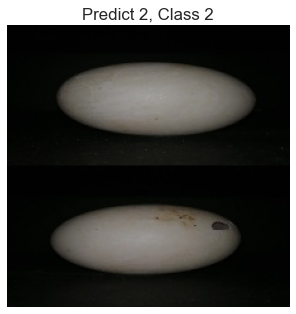

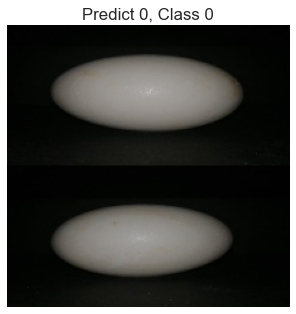

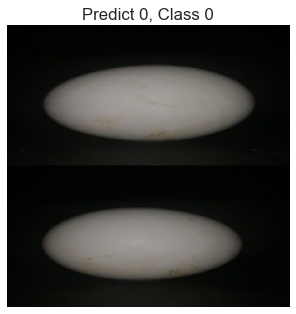

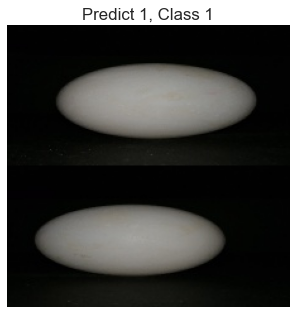

Fold 5
Found 28 correct labels


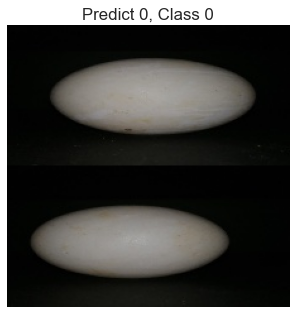

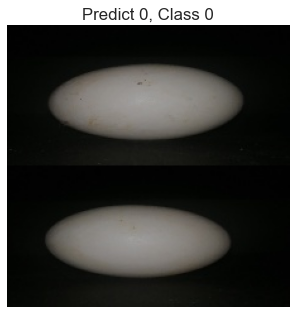

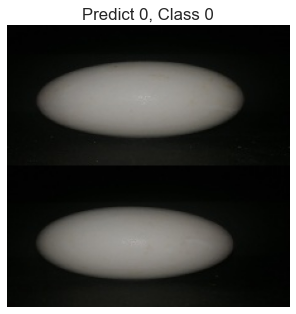

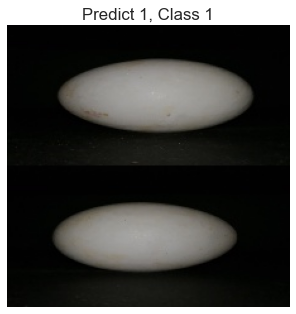

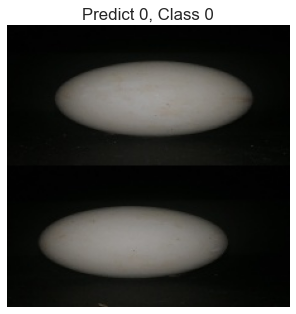

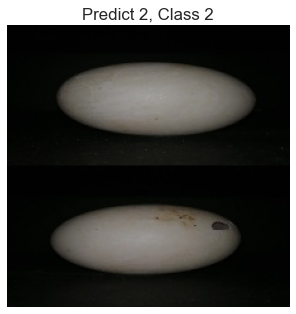

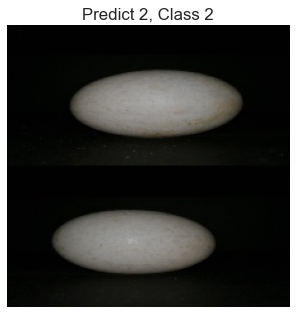

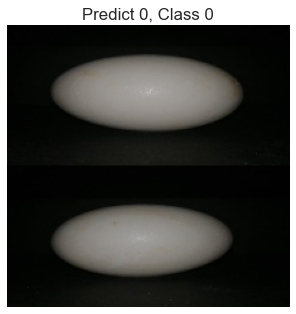

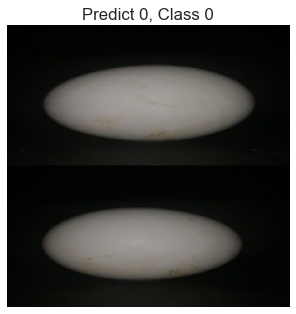

In [33]:
for x in range(len(yhat_classes_total)):
    print("Fold " + str(x+1))
    
    correct = np.where(yhat_classes_total[x]==yt)[0]

    print ("Found %d correct labels" % len(correct))

    for i, correct in enumerate(correct[:9]):
        plt.figure(figsize=(5,5))
        #plt.subplot(3,3,i+1)
        RGB_img = cv2.cvtColor(testX2[correct], cv2.COLOR_BGR2RGB)
        plt.imshow(RGB_img) #, interpolation='nearest') #, cmap='gray')
        plt.title("Predict {0}, Class {1}".format(str(yhat_classes_total[x][correct]),str(yt.values[correct])))
        plt.tight_layout()
        plt.grid(False)
        plt.axis('off')
        plt.show()

### Incorrect predictions

Fold 1
Found 2 incorrect labels


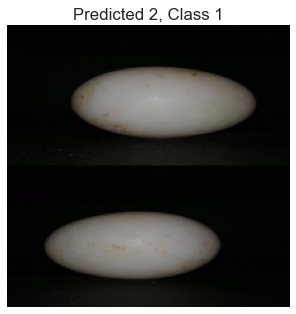

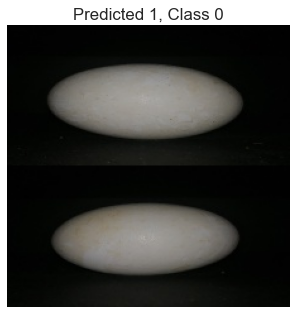

Fold 2
Found 3 incorrect labels


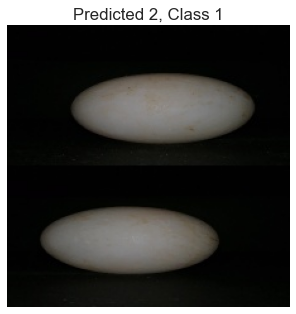

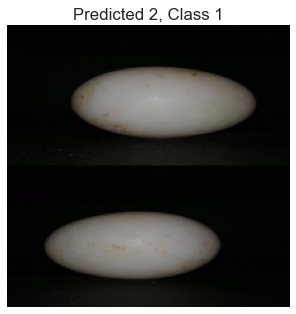

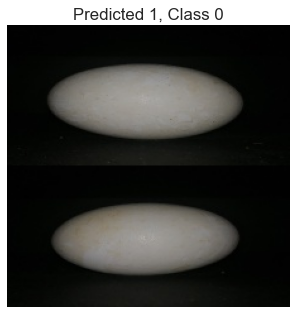

Fold 3
Found 3 incorrect labels


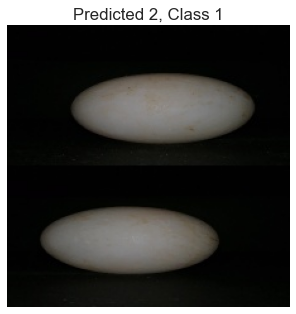

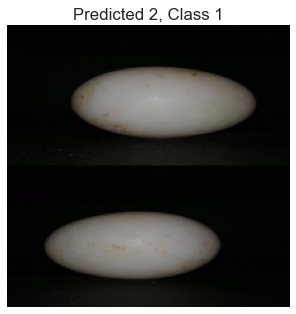

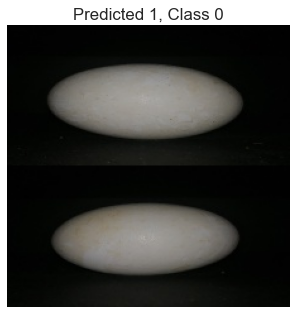

Fold 4
Found 5 incorrect labels


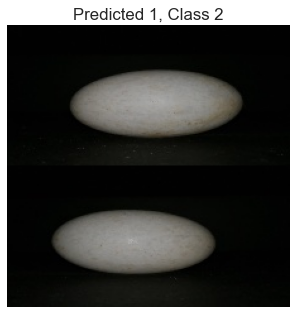

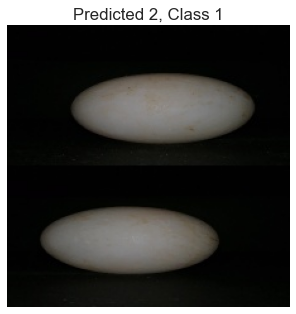

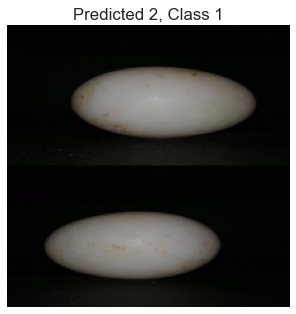

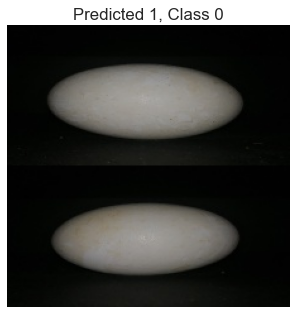

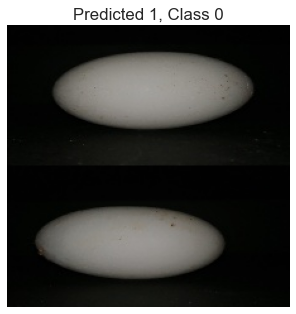

Fold 5
Found 2 incorrect labels


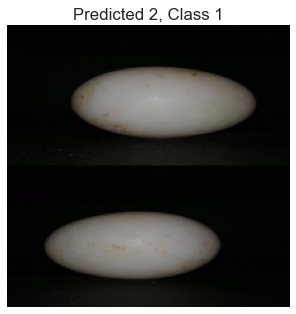

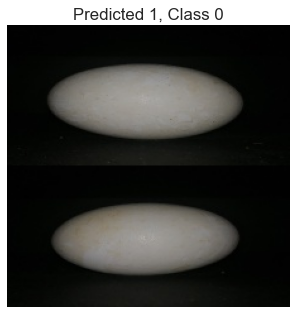

In [34]:
for x in range(len(yhat_classes_total)):
    print("Fold " + str(x+1))
    
    incorrect = np.where(yhat_classes_total[x]!=yt)[0]
    
    print ("Found %d incorrect labels" % len(incorrect))
    
    for i, incorrect in enumerate(incorrect[:9]):
        plt.figure(figsize=(5,5))
        #plt.subplot(3,3,i+1)
        RGB_img = cv2.cvtColor(testX2[incorrect], cv2.COLOR_BGR2RGB)
        plt.imshow(RGB_img) #, interpolation='nearest') #, cmap='gray')
        plt.title("Predicted {0}, Class {1}".format(str(yhat_classes_total[x][incorrect]), str(yt.values[incorrect])))
        plt.tight_layout()
        plt.grid(False)
        plt.axis('off')
        plt.show()